# Zomato Restaurant Clustering and Sentiment Analysis

**Project Type:** Unsupervised Machine Learning

## Problem Statement

The objective is to analyze and understand the Indian restaurant industry using data from Zomato — a leading food delivery and restaurant aggregator platform.

- Analyze customer review sentiments to understand overall satisfaction.
- Cluster restaurants into meaningful segments based on their features.
- Visualize insights for actionable conclusions to help customers find the best local restaurants.
- Aid Zomato in identifying growth opportunities and areas requiring improvement.
- Identify influential critics through reviewer metadata for enhanced industry understanding.

---

## GitHub Repository

Access the full project and code at:
[https://github.com/aditisahu911/zomato-clustering-and-sentiment-analysis)


## Let’s get started!

### 1. Know Your Data

Before diving into the analysis, it’s important to really understand what data we’re working with — its structure, quality, and quirks. This means checking the basics: data types, missing values, duplicates, and key statistics.

#### Importing Important Libraries

In [1]:
# Import fundamental libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import matplotlib.cm as cm
import seaborn as sns
import math
import time
from wordcloud import WordCloud

# Statistical and distribution tools
from scipy.stats import norm
from scipy import stats

# Metrics for model evaluation
# Metrics for model evaluation
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report,
    roc_auc_score, precision_score, recall_score, f1_score,
    silhouette_score, PrecisionRecallDisplay
)


# Model selection and tuning
from sklearn.model_selection import train_test_split, GridSearchCV, ParameterGrid

# Preprocessing tools
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# Clustering algorithm
from sklearn.cluster import KMeans

# Ensemble classifiers
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier

# Dimensionality reduction
from sklearn.decomposition import PCA, NMF

# Bayesian classifier
from sklearn.naive_bayes import MultinomialNB

# NLP tools
import nltk
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('omw-1.4')
nltk.download('averaged_perceptron_tagger')  # POS tagging

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem.snowball import SnowballStemmer

# Text feature extraction
from sklearn.feature_extraction.text import TfidfVectorizer

# Topic modeling
import pyLDAvis
from sklearn.decomposition import LatentDirichletAllocation

# Text preprocessing and transformation
import gensim
from gensim import corpora

# Model explainability
import shap

# Package installations (to be run externally/notebooks)
# !pip install pyLDAvis contractions gensim shap

# Configure pandas display precision
pd.options.display.float_format = "{:.2f}".format

# Ignore warnings for clean output
import warnings
warnings.filterwarnings("ignore")

# Inline plotting for notebooks
%matplotlib inline


[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/aditisahu/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/aditisahu/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/aditisahu/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     /Users/aditisahu/nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/aditisahu/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
/Users/aditisahu/PycharmProjects/zomato-clustering/.venv/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .

#### Loading the Dataset

In [2]:
# Load datasets
meta_df = pd.read_csv('/Users/aditisahu/PycharmProjects/zomato-clustering/Zomato Restaurant names and Metadata.csv')
reviews_df = pd.read_csv('/Users/aditisahu/PycharmProjects/zomato-clustering/Zomato Restaurant reviews.csv')


In [3]:
meta_df.head()

,Name,Links,Cost,Collections,Cuisines,Timings
0,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800,"Food Hygiene Rated Restaurants in Hyderabad, C...","Chinese, Continental, Kebab, European, South I...","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)"
1,Paradise,https://www.zomato.com/hyderabad/paradise-gach...,800,Hyderabad's Hottest,"Biryani, North Indian, Chinese",11 AM to 11 PM
2,Flechazo,https://www.zomato.com/hyderabad/flechazo-gach...,"1,300","Great Buffets, Hyderabad's Hottest","Asian, Mediterranean, North Indian, Desserts","11:30 AM to 4:30 PM, 6:30 PM to 11 PM"
3,Shah Ghouse Hotel & Restaurant,https://www.zomato.com/hyderabad/shah-ghouse-h...,800,Late Night Restaurants,"Biryani, North Indian, Chinese, Seafood, Bever...",12 Noon to 2 AM
4,Over The Moon Brew Company,https://www.zomato.com/hyderabad/over-the-moon...,"1,200","Best Bars & Pubs, Food Hygiene Rated Restauran...","Asian, Continental, North Indian, Chinese, Med...","12noon to 11pm (Mon, Tue, Wed, Thu, Sun), 12no..."


In [4]:
reviews_df.head()

,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures
0,Beyond Flavours,Rusha Chakraborty,"The ambience was good, food was quite good . h...",5,"1 Review , 2 Followers",5/25/2019 15:54,0
1,Beyond Flavours,Anusha Tirumalaneedi,Ambience is too good for a pleasant evening. S...,5,"3 Reviews , 2 Followers",5/25/2019 14:20,0
2,Beyond Flavours,Ashok Shekhawat,A must try.. great food great ambience. Thnx f...,5,"2 Reviews , 3 Followers",5/24/2019 22:54,0
3,Beyond Flavours,Swapnil Sarkar,Soumen das and Arun was a great guy. Only beca...,5,"1 Review , 1 Follower",5/24/2019 22:11,0
4,Beyond Flavours,Dileep,Food is good.we ordered Kodi drumsticks and ba...,5,"3 Reviews , 2 Followers",5/24/2019 21:37,0


#### Counting the rows and columns

In [5]:
# Display dataset dimensions (rows: observations, columns: features)
print(f'Total observations and features in restaurants meta {meta_df.shape}')
print(f'Total observations and features in reviews dataset: {reviews_df.shape}')


Total observations and features in restaurants meta (105, 6)
Total observations and features in reviews dataset: (10000, 7)


In [6]:
# Display dataset information including datatypes and non-null counts
print('Restaurants Metadata Info\n')
meta_df.info()
print('='*120)
print('\nReview Dataset Info\n')
reviews_df.info()


Restaurants Metadata Info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 105 entries, 0 to 104
Data columns (total 6 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Name         105 non-null    object
 1   Links        105 non-null    object
 2   Cost         105 non-null    object
 3   Collections  51 non-null     object
 4   Cuisines     105 non-null    object
 5   Timings      104 non-null    object
dtypes: object(6)
memory usage: 5.1+ KB

Review Dataset Info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Restaurant  10000 non-null  object
 1   Reviewer    9962 non-null   object
 2   Review      9955 non-null   object
 3   Rating      9962 non-null   object
 4   Metadata    9962 non-null   object
 5   Time        9962 non-null   object
 6   Pictures    10000 non-null  int64 
dtypes: int6

#### Counting the Duplicates

In [7]:
# Count and report duplicate entries in datasets
print('Restaurant Metadata Duplicates\n')
print(f"Duplicate entries present? {meta_df.duplicated().value_counts()}, total duplicates: {meta_df.duplicated().sum()}")
print('\n' + '='*120 + '\n')
print('Review Dataset Duplicates\n')
print(f"Duplicate entries present? {reviews_df.duplicated().value_counts()}, total duplicates: {reviews_df.duplicated().sum()}")

Restaurant Metadata Duplicates

Duplicate entries present? False    105
Name: count, dtype: int64, total duplicates: 0


Review Dataset Duplicates

Duplicate entries present? False    9964
True       36
Name: count, dtype: int64, total duplicates: 36


In [8]:
# Count and display duplicate rows in reviews dataset
print(f'Duplicate data count = {reviews_df[reviews_df.duplicated()].shape[0]}')
reviews_df[reviews_df.duplicated()]


Duplicate data count = 36


,Restaurant,Reviewer,Review,Rating,Metadata,Time,Pictures
8778,American Wild Wings,NaN,NaN,NaN,NaN,NaN,0
8779,American Wild Wings,NaN,NaN,NaN,NaN,NaN,0
8780,American Wild Wings,NaN,NaN,NaN,NaN,NaN,0
8781,American Wild Wings,NaN,NaN,NaN,NaN,NaN,0
8782,American Wild Wings,NaN,NaN,NaN,NaN,NaN,0
8783,American Wild Wings,NaN,NaN,NaN,NaN,NaN,0
8784,American Wild Wings,NaN,NaN,NaN,NaN,NaN,0
8785,American Wild Wings,NaN,NaN,NaN,NaN,NaN,0
8786,American Wild Wings,NaN,NaN,NaN,NaN,NaN,0
8787,American Wild Wings,NaN,NaN,NaN,NaN,NaN,0


In [9]:
# Count rows for 'American Wild Wings' in reviews dataset
reviews_df[reviews_df['Restaurant'] == 'American Wild Wings'].shape

(100, 7)

In [10]:
# Count rows for 'Arena Eleven' in reviews dataset
reviews_df[reviews_df['Restaurant'] == 'Arena Eleven'].shape

(100, 7)

#### Missing Values

In [11]:
# Count missing/null values in restaurants metadata
meta_df.isnull().sum()

Name            0
Links           0
Cost            0
Collections    54
Cuisines        0
Timings         1
dtype: int64

In [12]:
# Count missing/null values in reviews dataset
reviews_df.isnull().sum()

Restaurant     0
Reviewer      38
Review        45
Rating        38
Metadata      38
Time          38
Pictures       0
dtype: int64

<Axes: >

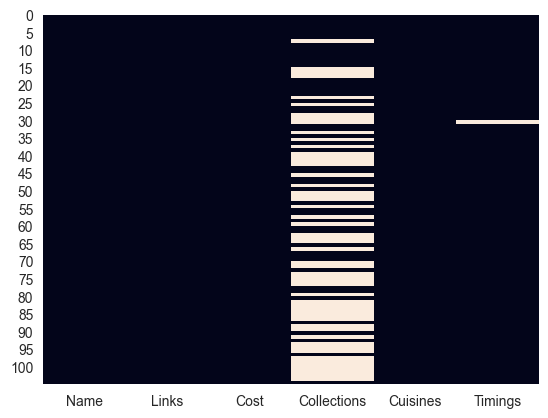

In [13]:
# Visualize missing values in restaurants metadata using a heatmap
sns.heatmap(meta_df.isnull(), cbar=False)

<Axes: >

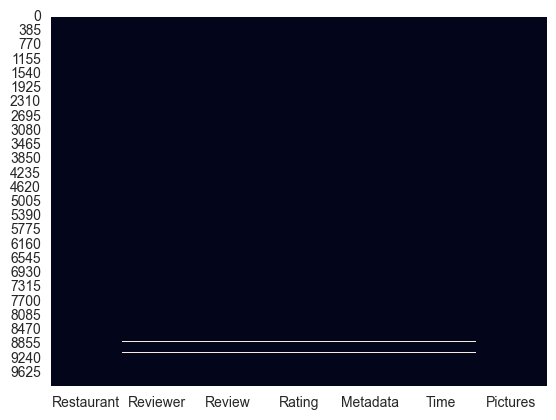

In [14]:
# Visualize missing values in reviews dataset using a heatmap
sns.heatmap(reviews_df.isnull(), cbar=False)

### Summary of Datasets
#### Restaurant Dataset

- There are **105 observations** and **6 features** in total.
- Some features like **collection** and **timing** contain **null values**.
- There are **no duplicate entries** — all 105 rows are unique.
- The **cost** feature represents amounts but is stored as an **object** because of commas in the values.
- The **timing** feature indicates operational hours but is stored as **text (object type)**.

#### Review Dataset

- This dataset has **10,000 observations** and **7 features**.
- Except for **picture** and **restaurant** columns, most features contain **null values**.
- There are **36 duplicate rows**, mostly from two restaurants: **American Wild Wings** and **Arena Eleven**. These duplicate rows generally contain null values.
- The **rating** feature is ordinal but stored as an **object**; it should be converted to an integer.
- The **timing** feature indicates when the review was posted but is stored as an **object**; it should be converted to a datetime type.


### 2. Understanding Your Variables

Before jumping into modeling or clustering, it’s essential to get familiar with each variable in the datasets. This helps us decide how to preprocess, transform, or engineer features for better analysis and results.


In [15]:
# Display feature names in restaurants metadata
print(f'Restaurant dataset features: {meta_df.columns.to_list()}')

# Display feature names in reviews dataset
print(f'Reviews dataset features: {reviews_df.columns.to_list()}')

Restaurant dataset features: ['Name', 'Links', 'Cost', 'Collections', 'Cuisines', 'Timings']
Reviews dataset features: ['Restaurant', 'Reviewer', 'Review', 'Rating', 'Metadata', 'Time', 'Pictures']


In [16]:
# Statistical summary of the restaurants metadata dataset
meta_df.describe().T

,count,unique,top,freq
Name,105,105,Beyond Flavours,1
Links,105,105,https://www.zomato.com/hyderabad/beyond-flavou...,1
Cost,105,29,500,13
Collections,51,42,Food Hygiene Rated Restaurants in Hyderabad,4
Cuisines,105,92,"North Indian, Chinese",4
Timings,104,77,11 AM to 11 PM,6


In [17]:
# Detailed statistical summary of the reviews dataset including categorical data
reviews_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
Restaurant,10000,100,Beyond Flavours,100,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Reviewer,9962,7446,Parijat Ray,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Review,9955,9364,good,237,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Rating,9962,10,5,3832,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Metadata,9962,2477,1 Review,919,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Time,9962,9782,7/29/2018 20:34,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Pictures,10000.00,NaN,NaN,NaN,0.75,2.57,0.00,0.00,0.00,0.00,64.00


### Variables Description

#### Zomato Restaurant Dataset

- **Name:** Name of the restaurant
- **Links:** URL links to the restaurant’s page
- **Cost:** Estimated cost per person for dining
- **Collection:** Tags categorizing restaurants as per Zomato's classification
- **Cuisines:** Types of cuisines served
- **Timings:** Operating hours of the restaurant

#### Zomato Restaurant Reviews Dataset

- **Restaurant:** Name of the restaurant being reviewed
- **Reviewer:** Name of the reviewer
- **Review:** Text content of the review
- **Rating:** Rating given by the reviewer
- **MetaData:** Reviewer metadata such as number of reviews and followers
- **Time:** Date and time when the review was posted
- **Pictures:** Number of pictures posted with the review


#### Checking Unique values

In [18]:
# Print the count of unique values for each feature in the restaurants metadata
for col in meta_df.columns.tolist():
    print(f"No. of unique values in {col} is {meta_df[col].nunique()}.")


No. of unique values in Name is 105.
No. of unique values in Links is 105.
No. of unique values in Cost is 29.
No. of unique values in Collections is 42.
No. of unique values in Cuisines is 92.
No. of unique values in Timings is 77.


In [19]:
# Print the count of unique values for each feature in the reviews dataset
for col in reviews_df.columns.tolist():
    print(f"No. of unique values in {col} is {reviews_df[col].nunique()}.")


No. of unique values in Restaurant is 100.
No. of unique values in Reviewer is 7446.
No. of unique values in Review is 9364.
No. of unique values in Rating is 10.
No. of unique values in Metadata is 2477.
No. of unique values in Time is 9782.
No. of unique values in Pictures is 36.


### 3. Data Wrangling

Now that we have a good understanding of our datasets, it’s time to clean and prepare the data for analysis. This involves handling missing values, fixing data types, removing duplicates, and any other transformations needed to make the data consistent and usable.


In [20]:
# Create copies of the original datasets to preserve raw data
hotel = meta_df.copy()
review = reviews_df.copy()

In [21]:
# Before changing data type, check unique values in 'Cost' column
hotel['Cost'].unique()

array(['800', '1,300', '1,200', '1,500', '500', '300', '1,000', '350',
       '400', '1,600', '750', '550', '1,900', '450', '150', '1,400',
       '1,100', '600', '200', '900', '700', '1,700', '2,500', '850',
       '650', '1,800', '2,800', '1,750', '250'], dtype=object)

In [22]:
# Clean and convert 'Cost' from string with commas to integer type
hotel['Cost'] = hotel['Cost'].str.replace(",", "").astype('int64')

In [23]:
# Display top 5 costliest restaurants
hotel.sort_values('Cost', ascending=False)[['Name', 'Cost']].head(5)

,Name,Cost
92,Collage - Hyatt Hyderabad Gachibowli,2800
56,Feast - Sheraton Hyderabad Hotel,2500
21,Jonathan's Kitchen - Holiday Inn Express & Suites,1900
18,10 Downing Street,1900
91,Cascade - Radisson Hyderabad Hitec City,1800


In [24]:
# Display top 5 most economical (least costly) restaurants
hotel.sort_values('Cost')[['Name', 'Cost']].head(5)


,Name,Cost
89,Mohammedia Shawarma,150
23,Amul,150
54,Asian Meal Box,200
101,Sweet Basket,200
59,KS Bakers,200


In [25]:
# Create a dictionary with Cost as key and list of restaurant names sharing that cost as values
hotel_dict = {}
amounts = hotel.Cost.values.tolist()

for price in amounts:
    # Get all rows with the current price
    rows = hotel[hotel['Cost'] == price]
    hotel_dict[price] = rows["Name"].tolist()

# Convert dictionary to DataFrame
same_price_hotel_df = pd.DataFrame.from_dict([hotel_dict]).transpose().reset_index().rename(
    columns={'index': 'Cost', 0: 'Name of Restaurants'})

# Alternative method (commented)
# same_price_hotel_df = hotel.groupby('Cost')['Name'].apply(list).reset_index()

# Get count of restaurants per cost
hotel_count = hotel.groupby('Cost')['Name'].count().reset_index().sort_values(
    'Cost', ascending=False)

# Merge counts with names grouped by cost
same_price_hotel_df = same_price_hotel_df.merge(hotel_count, how='inner', on='Cost').rename(
    columns={'Name': 'Total_Restaurant'})

# Show top 5 costs with maximum number of restaurants sharing the same price
same_price_hotel_df.sort_values('Total_Restaurant', ascending=False).head(5)

,Cost,Name of Restaurants,Total_Restaurant
4,500,"[eat.fit, KFC, Kritunga Restaurant, Karachi Ba...",13
17,600,"[Behrouz Biryani, Karachi Cafe, Hyderabad Chef...",10
20,700,"[Marsala Food Company, Green Bawarchi Restaura...",8
2,1200,"[Over The Moon Brew Company, The Glass Onion, ...",7
8,400,"[Sardarji's Chaats & More, Hotel Zara Hi-Fi, P...",6


In [26]:
# Top 5 hotels with the highest price
same_price_hotel_df.sort_values('Cost', ascending=False).head(5)

,Cost,Name of Restaurants,Total_Restaurant
26,2800,[Collage - Hyatt Hyderabad Gachibowli],1
22,2500,[Feast - Sheraton Hyderabad Hotel],1
12,1900,"[10 Downing Street, Jonathan's Kitchen - Holid...",2
25,1800,[Cascade - Radisson Hyderabad Hitec City],1
27,1750,[Zega - Sheraton Hyderabad Hotel],1


In [27]:
# Split the 'Cuisines' column into lists of cuisines
cuisine_list = hotel.Cuisines.str.split(', ')


In [28]:
# Count frequency of each cuisine type across all restaurants
cuisine_count = {}
for cuisines in cuisine_list:
    for cuisine in cuisines:
        if cuisine in cuisine_count:
            cuisine_count[cuisine] += 1
        else:
            cuisine_count[cuisine] = 1

In [29]:
# Convert cuisine count dictionary to DataFrame
cuisine_df = pd.DataFrame.from_dict([cuisine_count]).transpose().reset_index().rename(
    columns={'index': 'Cuisine', 0: 'Number of Restaurants'})

In [30]:
# Display top 5 most common cuisines
cuisine_df.sort_values('Number of Restaurants', ascending=False).head(5)

,Cuisine,Number of Restaurants
5,North Indian,61
0,Chinese,43
1,Continental,21
6,Biryani,16
18,Fast Food,15


In [31]:
# Split the 'Collections' column into lists, dropping nulls first
collections_list = hotel.Collections.dropna().str.split(', ')

In [32]:
# Count frequency of each collection category across restaurants
collections_count = {}
for collections in collections_list:
    for col_name in collections:
        if col_name in collections_count:
            collections_count[col_name] += 1
        else:
            collections_count[col_name] = 1


In [33]:
# Convert collections count dictionary to DataFrame
collections_df = pd.DataFrame.from_dict([collections_count]).transpose().reset_index().rename(
    columns={'index': 'Tags', 0: 'Number of Restaurants'})


In [34]:
# Display top 5 collections by number of restaurants
collections_df.sort_values('Number of Restaurants', ascending=False).head(5)

,Tags,Number of Restaurants
2,Great Buffets,11
0,Food Hygiene Rated Restaurants in Hyderabad,8
5,Live Sports Screenings,7
6,Hyderabad's Hottest,7
1,Corporate Favorites,6


Before converting the `Rating` column's data type, I first want to inspect its unique values and counts to understand what kind of data it holds and to identify possible cleaning needs.


In [35]:
review.Rating.value_counts()


Rating
5       3832
4       2373
1       1735
3       1193
2        684
4.5       69
3.5       47
2.5       19
1.5        9
Like       1
Name: count, dtype: int64

In [36]:
# Convert 'Like' rating to 0 (assumed no zero ratings in original data)
review.loc[review['Rating'] == 'Like', 'Rating'] = 0

# Change the data type of 'Rating' column to float for numerical handling
review['Rating'] = review['Rating'].astype('float')


In [37]:
# Replace the '0' ratings (originally 'Like') with the median rating value
review.loc[review['Rating'] == 0, 'Rating'] = review['Rating'].median()

In [38]:
# Convert 'Time' to datetime, coercing errors to NaT (missing values)
review['Time'] = pd.to_datetime(review['Time'], errors='coerce')

# Check how many rows have invalid 'Time' after conversion
invalid_time_count = review['Time'].isna().sum()
print(f"Number of invalid 'Time' entries: {invalid_time_count}")

# Optional: drop rows where 'Time' is NaT (if appropriate)
review = review.dropna(subset=['Time'])

# Extract year, month, hour components after cleaning
review['Review_Year'] = review['Time'].dt.year
review['Review_Month'] = review['Time'].dt.month
review['Review_Hour'] = review['Time'].dt.hour


Number of invalid 'Time' entries: 38


In [39]:
# Calculate average rating and total number of reviews per restaurant
avg_hotel_rating = review.groupby('Restaurant').agg({
    'Rating': 'mean',
    'Reviewer': 'count'
}).reset_index().rename(columns={'Reviewer': 'Total_Review'})

avg_hotel_rating

,Restaurant,Rating,Total_Review
0,10 Downing Street,3.80,100
1,13 Dhaba,3.48,100
2,"3B's - Buddies, Bar & Barbecue",4.76,100
3,AB's - Absolute Barbecues,4.88,100
4,Absolute Sizzlers,3.62,100
...,...,...,...
95,Urban Asia - Kitchen & Bar,3.65,100
96,Yum Yum Tree - The Arabian Food Court,3.56,100
97,Zega - Sheraton Hyderabad Hotel,4.45,100
98,Zing's Northeast Kitchen,3.65,100


In [40]:
# Remove rows where 'Restaurant' column is numeric, filtering for only string types
review = review[review['Restaurant'].apply(lambda x: isinstance(x, str))].reset_index(drop=True)


In [41]:
# Find hotels present in the hotel dataset but without any reviews in the review dataset
hotel_without_review = [
    name for name in hotel.Name.unique().tolist()
    if name not in review.Restaurant.unique().tolist()
]

hotel_without_review

['IndiBlaze',
 'Sweet Basket',
 'Angaara Counts 3',
 'Wich Please',
 'Republic Of Noodles - Lemon Tree Hotel']

In [42]:
# Display top 5 restaurants with highest average rating
avg_hotel_rating.sort_values('Rating', ascending=False).head(5)


,Restaurant,Rating,Total_Review
3,AB's - Absolute Barbecues,4.88,100
11,B-Dubs,4.81,100
2,"3B's - Buddies, Bar & Barbecue",4.76,100
67,Paradise,4.70,100
35,Flechazo,4.66,100


In [43]:
# Display top 5 restaurants with lowest average rating
avg_hotel_rating.sort_values('Rating', ascending=True).head(5)

,Restaurant,Rating,Total_Review
41,Hotel Zara Hi-Fi,2.40,100
10,Asian Meal Box,2.58,100
66,Pakwaan Grand,2.71,100
57,Mathura Vilas,2.82,100
14,Behrouz Biryani,2.83,100


In [44]:
# Group reviews by year and list all restaurants reviewed each year
hotel_year = review.groupby('Review_Year')['Restaurant'].apply(list).reset_index()

# Count the total number of reviews per year
hotel_year['Count'] = hotel_year['Restaurant'].apply(len)

hotel_year

,Review_Year,Restaurant,Count
0,2016,"[Labonel, Labonel, Labonel, Labonel, Labonel, ...",43
1,2017,"[KS Bakers, KS Bakers, KS Bakers, KS Bakers, K...",213
2,2018,"[Shah Ghouse Spl Shawarma, Shah Ghouse Spl Sha...",4903
3,2019,"[Beyond Flavours, Beyond Flavours, Beyond Flav...",4803


In [45]:
# Rename hotel column for merging with review dataset
hotel = hotel.rename(columns={'Name': 'Restaurant'})

# Merge hotel and review dataframes on 'Restaurant'
merged = hotel.merge(review, on='Restaurant')

# Display shape of merged dataframe
merged.shape

(9962, 15)

In [46]:
# Calculate average rating and average cost (price point) per restaurant
price_point = merged.groupby('Restaurant').agg({
    'Rating': 'mean',
    'Cost': 'mean'
}).reset_index().rename(columns={'Cost': 'Price_Point'})

In [47]:
# Display top 5 highest rated restaurants with their price point
price_point.sort_values('Rating', ascending=False).head(5)

,Restaurant,Rating,Price_Point
3,AB's - Absolute Barbecues,4.88,1500.00
11,B-Dubs,4.81,1600.00
2,"3B's - Buddies, Bar & Barbecue",4.76,1100.00
67,Paradise,4.70,800.00
35,Flechazo,4.66,1300.00


In [48]:
# Display top 5 lowest rated restaurants with their price point
price_point.sort_values('Rating', ascending=True).head(5)

,Restaurant,Rating,Price_Point
41,Hotel Zara Hi-Fi,2.40,400.00
10,Asian Meal Box,2.58,200.00
66,Pakwaan Grand,2.71,400.00
57,Mathura Vilas,2.82,500.00
14,Behrouz Biryani,2.83,600.00


In [49]:
# Count number of ratings given by each reviewer
rating_count_df = review.groupby('Reviewer').size().reset_index(name='Rating_Count')

# Display top 5 reviewers by rating count
rating_count_df.sort_values('Rating_Count', ascending=False).head(5)

,Reviewer,Rating_Count
3858,Parijat Ray,13
655,Ankita,13
2654,Kiran,12
7013,Vedant Killa,11
2313,Jay Mehta,11


#### Data Manipulations and Key Insights

**Data Preparation:**
- Converted the data types of `Cost` and `Rating` columns to numeric for consistency.
- Addressed a special case in the `Rating` column where a value like "Like" was replaced by the median rating to maintain uniformity.

**Restaurant Dataset Analysis:**
- Identified the five most expensive restaurants, with *Collage - Hyatt Hyderabad Gachibowli* topping the list at ₹2800.
- Found the least expensive restaurant, *Amul*, priced at ₹150.
- Observed that 13 restaurants share a common price point of ₹500.
- Noted *North Indian* cuisine and *Great Buffet* tags among the most frequently occurring labels.

**Review Dataset Analysis:**
- Discovered the restaurants showing the highest engagement based on review data.
- Highlighted the most followed critic, *Satwinder Singh*, who posted 186 reviews, has 13,410 followers, and an average rating of 3.67.
- Found that in 2018, approximately 4,903 restaurants received reviews.

**Combined Analysis:**
- Merged the restaurant and review datasets to study price points relative to ratings.
- Found *AB's - Absolute Barbecues* as the top-rated restaurant with a price point of ₹1500.
- Identified *Zara Hi-Fi* as a low-rated restaurant with a price point of ₹400.


### 4. Understanding Variable Interactions with Charts and Visual Analysis

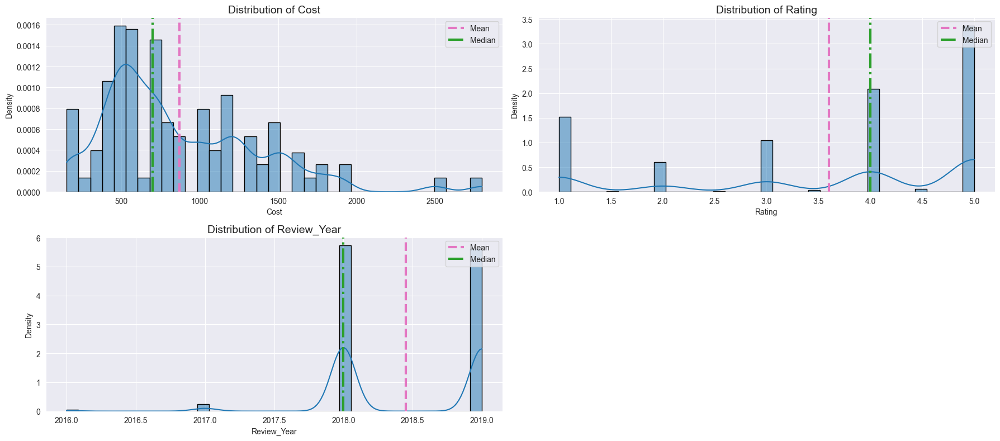

In [50]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(18, 8))

for i, col in enumerate(['Cost', 'Rating', 'Review_Year']):
    plt.subplot(2, 2, i + 1)
    sns.histplot(merged[col], color='#1f77b4', kde=True, stat="density", bins=35, edgecolor='black')
    feature = merged[col]
    plt.axvline(feature.mean(), color='#e377c2', linestyle='--', linewidth=3, label='Mean')
    plt.axvline(feature.median(), color='#2ca02c', linestyle='-.', linewidth=3, label='Median')
    plt.legend(loc='upper right', fontsize=10)
    plt.title(f'Distribution of {col}', fontsize=14)
    plt.tight_layout()


1. Why did I choose this specific chart?
Distplots are great for understanding the distribution and spread of each feature, giving us insights into their shape and skewness.

2. What insights did I gain from the chart?
All three features—Cost, Rating, and Review Year—show some degree of skewness.
Most restaurants are clustered around a price point of ₹500.
The number of reviews peaked notably in 2018.

3. Do these insights help create a positive business impact?
Are there any insights that might indicate negative growth? Here’s my take:
Price and rating are crucial factors that influence business performance and customer engagement.
However, looking at these distributions alone doesn’t directly reveal their impact on business outcomes. The charts do not show a clear relationship between price or rating and business growth when considered independently.

Further combined analysis or deeper exploration is needed to capture that impact effectively.


#### Price Point vs. Maximum Customer Engagement
##### Chart 2: Restaurants with Highest and Lowest Engagement

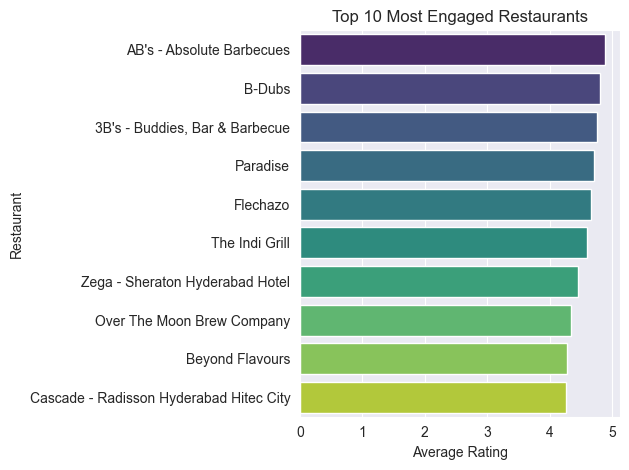

In [51]:
# Get top 10 restaurants with highest average rating (maximum engagement)
most_engaged_hotel = price_point.sort_values('Rating', ascending=False)

# Chart 2: Barplot for top 10 most engaged restaurants by rating
sns.barplot(data=most_engaged_hotel.head(10), x='Rating', y='Restaurant', palette='viridis')
plt.title('Top 10 Most Engaged Restaurants')
plt.xlabel('Average Rating')
plt.ylabel('Restaurant')
plt.tight_layout()
plt.show()

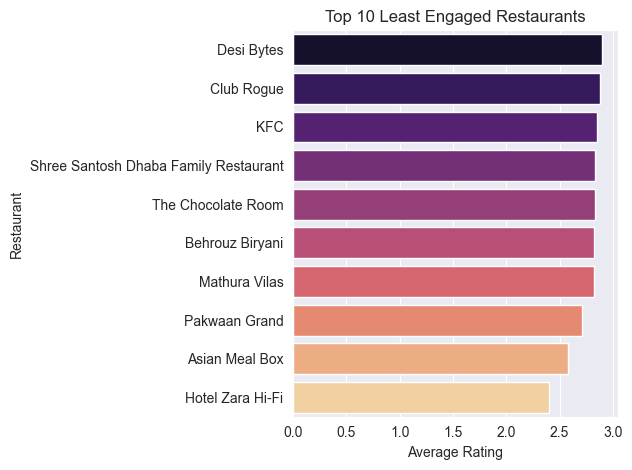

In [52]:
# Chart for bottom 10 restaurants with lowest average rating (least engagement)
sns.barplot(data=most_engaged_hotel.tail(10), x='Rating', y='Restaurant', palette='magma')
plt.title('Top 10 Least Engaged Restaurants')
plt.xlabel('Average Rating')
plt.ylabel('Restaurant')
plt.tight_layout()
plt.show()


1. Why did I choose this specific chart?
I chose a barplot because it effectively displays the engagement levels for different restaurants, making it easy to compare their average ratings visually.

2. What insights did I gain from the chart?
*AB's - Absolute Barbecues* shows the highest engagement and retention with the highest average rating. On the other hand, *Hotel Zara Hi-Fi* has the lowest engagement, reflected by its low average rating.

3. Will these insights help create a positive business impact?
Engagement and retention are critical for business success since profit and scalability depend heavily on retaining customers. High retention indicates that customers consistently prefer a brand over competitors.

Are there any insights that suggest negative growth? Here’s why:
Some restaurants with low ratings may signal negative growth if the underlying issues causing poor reviews aren't addressed. For example, *KFC* appears in the low-rated list, likely due to multiple outlets and outsourcing, resulting in inconsistent experiences. Their lower ratings on the platform may impact revenue and highlight a lack of full commitment to this sales channel. Monitoring and addressing such gaps is essential for preventing negative growth.


##### Chart 3: Comparing Price Points between Best and Worst Rated Hotels

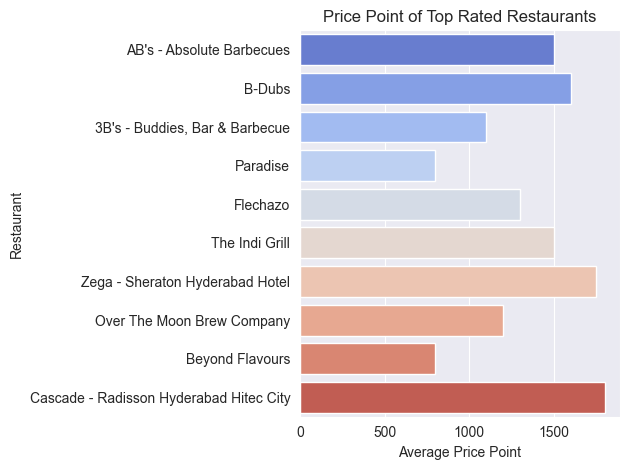

In [53]:
# Chart 3: Barplot showing price points of the top 10 highest rated restaurants
sns.barplot(data=most_engaged_hotel.head(10), x='Price_Point', y='Restaurant', palette='coolwarm')
plt.title('Price Point of Top Rated Restaurants')
plt.xlabel('Average Price Point')
plt.ylabel('Restaurant')
plt.tight_layout()
plt.show()


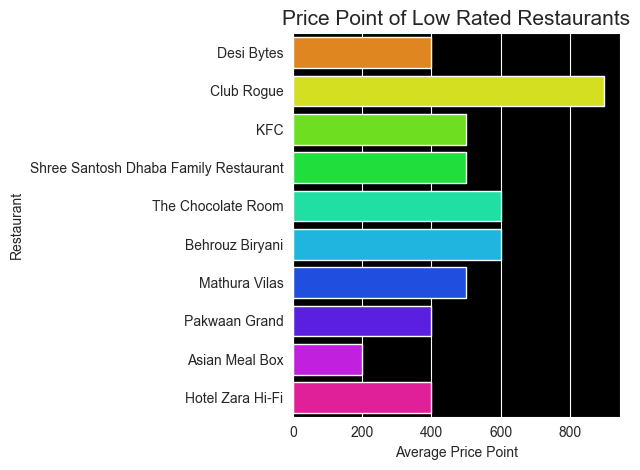

In [54]:
# Chart for price points of bottom 10 lowest rated restaurants
sns.barplot(data=most_engaged_hotel.tail(10), x='Price_Point', y='Restaurant', palette='hsv')
plt.title('Price Point of Low Rated Restaurants', fontsize=15)

# Change background color for better visual contrast
ax = plt.gca()
ax.set_facecolor('black')

plt.xlabel('Average Price Point')
plt.ylabel('Restaurant')
plt.tight_layout()
plt.show()


1. Why did I choose this specific chart?
I chose a barplot because it is a simple and effective way to compare different hotels by their price points. It clearly shows the price range of each hotel and makes it easy to visually compare them side by side.

2. What insights did I gain from the chart?
The high-rated restaurant *AB's - Absolute Barbecues* has a price point of ₹1500, while the low-rated *Hotel Zara Hi-Fi* has a price point of ₹400.

3. Will these insights help create a positive business impact?
Since this is a customer-focused business, understanding the right price point is crucial to keeping it affordable and attractive. The most liked restaurant, despite having a slightly higher price point, shows maximum engagement, indicating it likely delivers great food quality and taste. A deeper analysis of review texts would reveal why customers prefer this price point.

Some low-rated restaurants with low price points are still not engaging customers, which could negatively impact business. However, it’s not fair to conclude they should be unlisted as factors like cuisine type and location also play important roles. Targeted promotional offers can help boost sales for such restaurants.


##### Chart 4: Distribution of Cuisine Types Offered by Most Restaurants

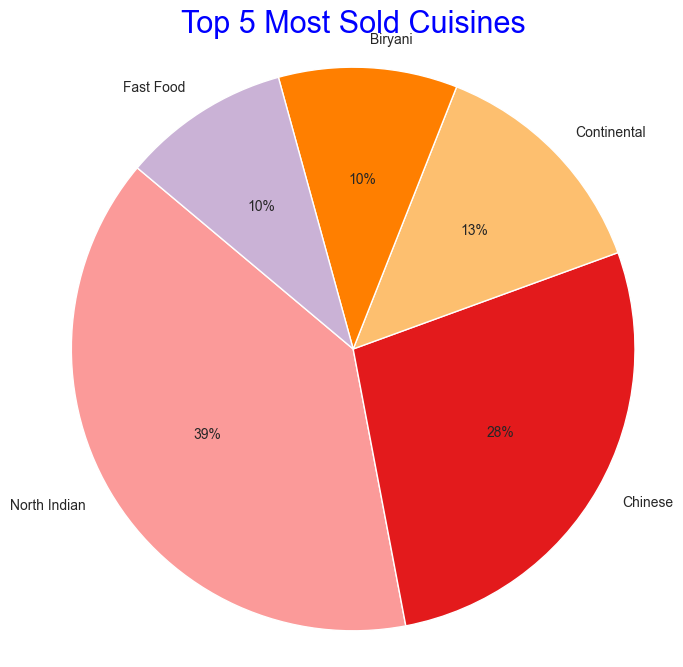

In [55]:
# Get top 5 cuisines by number of restaurants
top_cuisines = cuisine_df.sort_values('Number of Restaurants', ascending=False)['Cuisine'].head(5).tolist()

# Data for pie chart: number of restaurants for top 5 cuisines
top_counts = cuisine_df.sort_values('Number of Restaurants', ascending=False)['Number of Restaurants'].head(5).tolist()

# Color palette from seaborn
colors = sns.color_palette('Paired')[4:9]

# Create pie chart for top 5 most common cuisines
plt.figure(figsize=(8, 8))
plt.pie(top_counts, labels=top_cuisines, colors=colors, autopct='%.0f%%', startangle=140)
plt.title('Top 5 Most Sold Cuisines', fontsize=22, color='blue')
plt.axis('equal')  # Equal aspect ratio to make pie chart circular
plt.show()


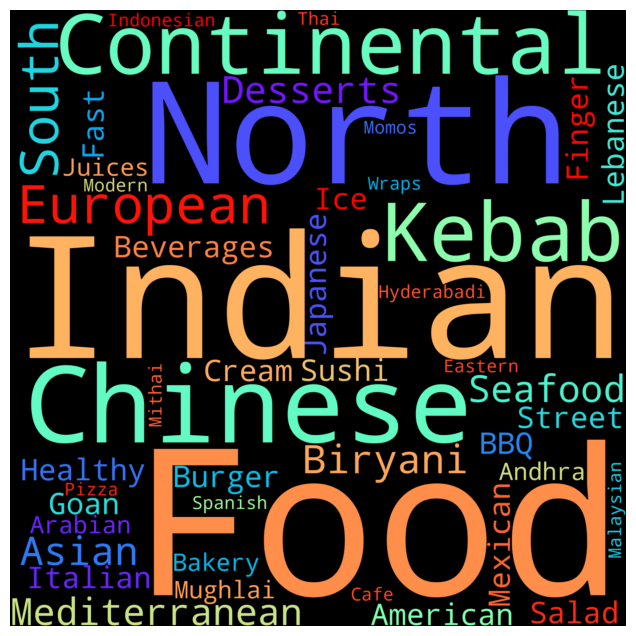

In [56]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 8))

# Combine all cuisine names into a single string
text = " ".join(cuisine_df['Cuisine'])

# Generate word cloud with customized settings
word_cloud = WordCloud(
    width=2000,
    height=2000,
    collocations=False,
    colormap='rainbow',
    background_color='black'
).generate(text)

# Display the word cloud
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis('off')
plt.show()


1. Why this specific chart?
I chose a pie chart because it effectively shows the proportion of each cuisine type sold, making it easy to see which cuisines dominate the market. I also used a word cloud to visualize all cuisine names and highlight the most frequently mentioned ones, providing an intuitive way to identify popular cuisines.

2. What insights did I gain from the chart?
The charts clearly show that most hotels serve North Indian cuisine, followed by Chinese cuisine, highlighting these as the most popular choices among customers.

3. Will these insights help create a positive business impact?
Identifying commoditized cuisines is crucial as it helps businesses recognize challenges and competitive advantages. Knowing which cuisines are widely offered allows restaurants to differentiate by focusing on unique or less common options.

Commoditized cuisines often come with higher ingredient and labor costs, so identifying them helps in cost control by emphasizing non-commoditized cuisines or finding ways to reduce costs of popular items.

These insights also reflect consumer preferences, guiding decisions about menus, pricing, and promotions. For example, since North Indian cuisine appears dominant, Zomato could prioritize adding and promoting more North Indian restaurants on its platform.

The word cloud further reveals the most frequently mentioned cuisines in customer reviews, indicating which cuisines are popular and potentially well-regarded or needing improvement.

However, these charts don't provide complete business information and should not be the sole basis for decisions. For instance, a pie chart showing cuisine popularity doesn't reveal profitability or competitive intensity. Similarly, a word cloud shows frequency, but not sentiment—whether mentions are positive or negative.

Moreover, other factors like market trends, consumer behavior, and economic conditions influence


##### Chart 5: Distribution of Popular Restaurant Tags

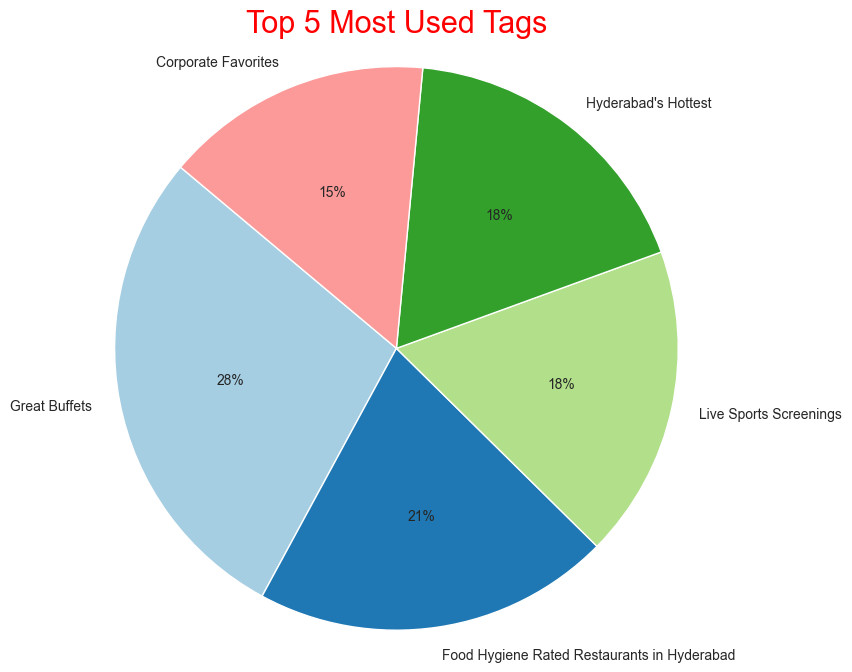

In [57]:
# Get top 5 tags by number of restaurants
top_tags = collections_df.sort_values('Number of Restaurants', ascending=False)['Tags'].head(5).tolist()
tag_counts = collections_df.sort_values('Number of Restaurants', ascending=False)['Number of Restaurants'].head(5).tolist()

# Define color palette
colors = sns.color_palette('Paired')[:5]

# Create pie chart for top 5 most used tags
plt.figure(figsize=(8, 8))
plt.pie(tag_counts, labels=top_tags, colors=colors, autopct='%.0f%%', startangle=140)
plt.title('Top 5 Most Used Tags', fontsize=22, color='red')
plt.axis('equal')
plt.show()


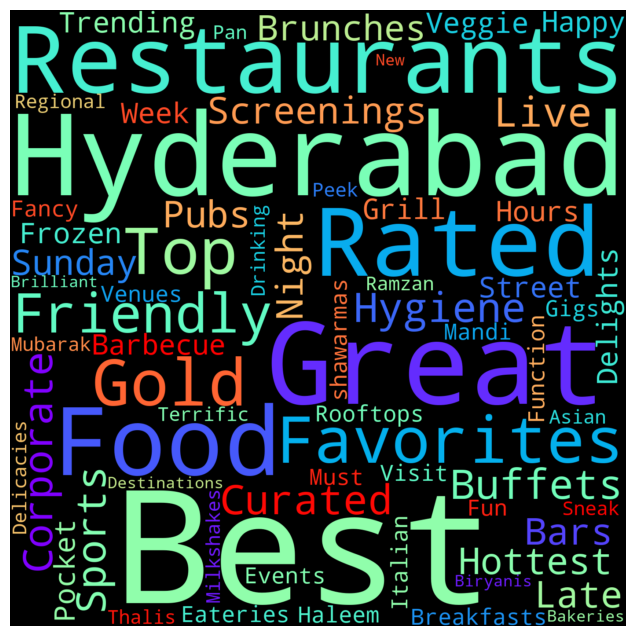

In [58]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 8))

# Combine all tags into a single string
text = " ".join(name for name in collections_df['Tags'])

# Generate word cloud
word_cloud = WordCloud(
    width=1400,
    height=1400,
    collocations=False,
    colormap='rainbow',
    background_color='black'
).generate(text)

# Display the word cloud
plt.imshow(word_cloud, interpolation='bilinear')
plt.axis("off")
plt.show()


1. Why did I choose these specific charts?
The pie chart offers a clear and simple way to visualize the proportion of different food attributes, making it easy to identify the most popular tags and compare their prevalence. It helps quickly spot patterns or trends in the data.

The word cloud complements this by visually highlighting the most frequently mentioned tags in a striking and easy-to-understand manner. It is effective for rapidly identifying common themes in customer reviews.

Together, these charts provide a comprehensive view of customer feedback and preferences, aiding Zomato in making informed strategic decisions to enhance the business.

2. What insights did I gain from the charts?
“Great Buffets” is the most frequently used tag. Other popular tags include “great,” “best,” “north,” and “Hyderabad,” indicating common themes and strengths highlighted by customers.

3. Will these insights help create a positive business impact?
Plotting a pie chart of tags helps Zomato identify which food attributes resonate most with customers, guiding decisions on which qualities to promote and expand. For example, if many customers describe food as “delicious” or “fresh,” Zomato could focus on featuring restaurants known for these traits and boost related promotions.

Similarly, the word cloud reveals the most common attributes mentioned in reviews, highlighting what customers appreciate or areas needing improvement.

However, these charts alone don’t provide the full picture and shouldn’t be the sole basis for decisions. A pie chart showing a popular adjective doesn’t disclose profitability or competitive dynamics related to that attribute. The word cloud shows frequency but doesn’t indicate whether mentions are positive or negative.

Other important factors, such as market trends, consumer preferences, and economic context, also impact business outcomes and must be considered. Furthermore, ensuring data cleanliness and validation is critical, as biased or incomplete data can mislead results.


##### Chart 6: Restaurants with Highest and Lowest Price Points

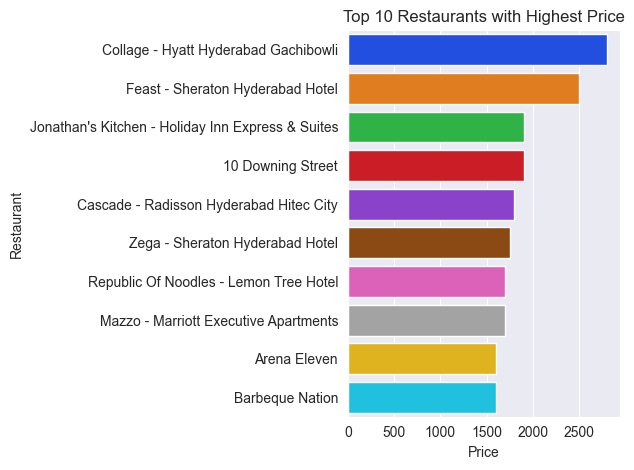

In [59]:
# Extracting restaurants and their price, sorted by highest cost
price_of_hotel = hotel.sort_values('Cost', ascending=False)[['Restaurant', 'Cost']]

# Chart 7: Barplot for top 10 most expensive restaurants
sns.barplot(data=price_of_hotel.head(10), x='Cost', y='Restaurant', palette='bright')
plt.title('Top 10 Restaurants with Highest Price')
plt.xlabel('Price')
plt.ylabel('Restaurant')
plt.tight_layout()
plt.show()


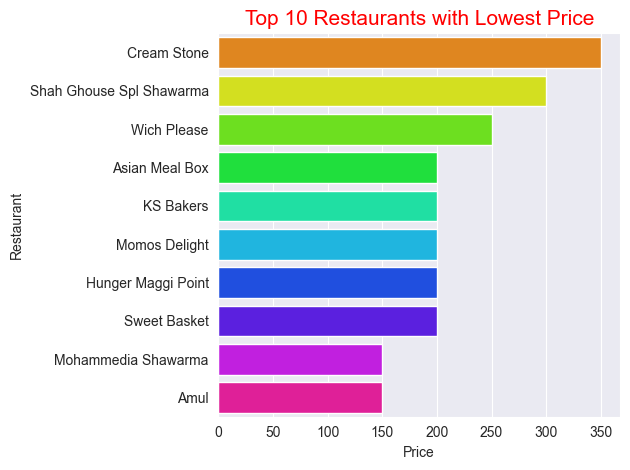

In [60]:
# Chart 7: Barplot for top 10 least expensive restaurants
sns.barplot(data=price_of_hotel.tail(10), x='Cost', y='Restaurant', palette='hsv')
plt.title('Top 10 Restaurants with Lowest Price', fontsize=15, color='red')
plt.xlabel('Price')
plt.ylabel('Restaurant')
plt.tight_layout()
plt.show()


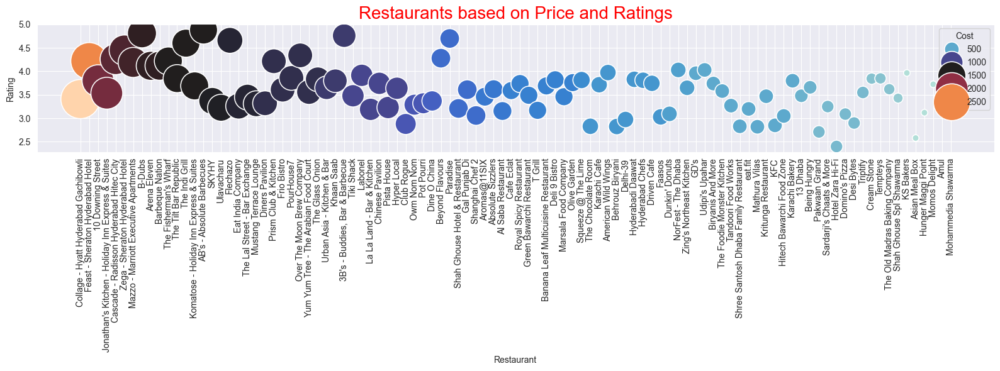

In [61]:
# Merge average rating and cost to find rating for expensive restaurants
expected_revenue = avg_hotel_rating.merge(hotel[['Restaurant', 'Cost']], on='Restaurant')

# Calculate expected revenue based on total reviews and price
expected_revenue['Expected_Revenue'] = expected_revenue['Total_Review'] * expected_revenue['Cost']

# Chart: Scatter plot of restaurants by price and rating
plt.figure(figsize=(16, 6))
data = expected_revenue.sort_values('Cost', ascending=False)
sns.scatterplot(
    data=data,
    x='Restaurant',
    y='Rating',
    size='Cost',
    hue='Cost',
    legend=True,
    sizes=(20, 2000),
    palette='icefire'
)
plt.xticks(rotation=90)
plt.title('Restaurants based on Price and Ratings', fontsize=20, color='red')
plt.tight_layout()
plt.show()


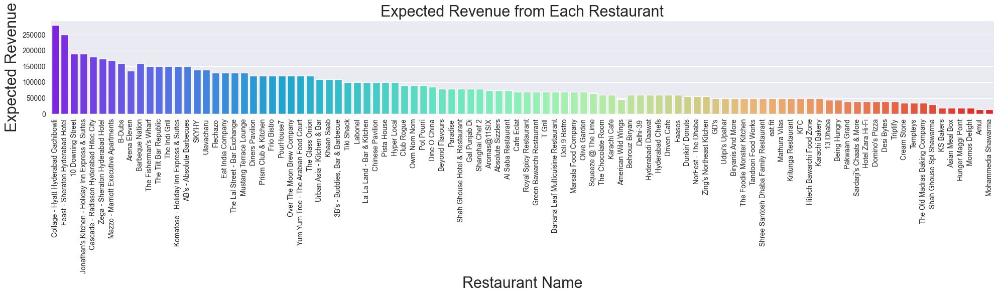

In [62]:
# Chart to visualize expected revenue for each restaurant
fig = plt.figure(figsize=[20, 6])
sns.barplot(data=data, x='Restaurant', y='Expected_Revenue', palette='rainbow')
plt.title('Expected Revenue from Each Restaurant', fontsize=22)
plt.xlabel('Restaurant Name', fontsize=22)
plt.xticks(rotation=90)
plt.ylabel('Expected Revenue', fontsize=22)
plt.tight_layout()
plt.show()


1. Why did I choose this specific chart?
I chose a barplot because it clearly shows the frequency distribution of cost for each restaurant, making it easy to compare their price points visually.

2. What insights did I gain from the chart?
The chart shows that *Collage - Hyatt Hyderabad Gachibowli* is the most expensive restaurant in the area, with an order price of ₹2800 and an average rating of 3.5.

On the other hand, restaurants like *Amul* and *Mohammedia Shawarma* are among the least expensive, priced at ₹150 with average ratings around 3.9.

3. Will these insights help create a positive business impact?

Most expensive products attract a niche market segment and tend to generate higher revenue for the business. For a food delivery platform like Zomato, focusing on improving sales and engagement around such premium hotels is important.

However, the average rating of 3.4 for these high-priced restaurants suggests room for improvement in customer satisfaction, which if left unaddressed, may cause negative brand impact. A deeper analysis of customer reviews is necessary to fully understand and enhance their engagement.


##### Chart 8: Heatmap Showing Correlations between Features

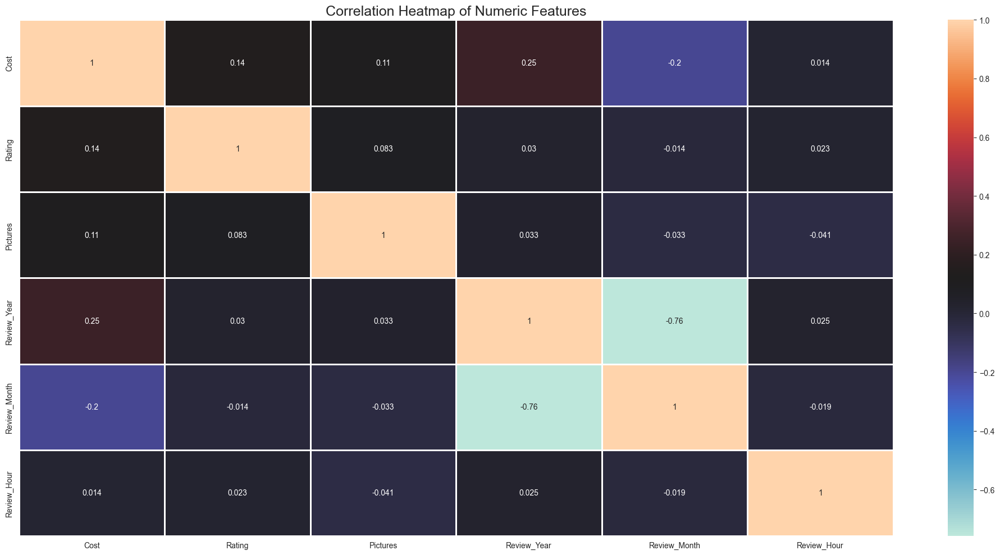

In [63]:
# Select only numeric columns for correlation calculation
numeric_data = merged.select_dtypes(include=['number'])

# Plot the correlation heatmap using only numeric data
f, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(numeric_data.corr(), ax=ax, annot=True, cmap='icefire', linewidths=1)

plt.title('Correlation Heatmap of Numeric Features', fontsize=18)
plt.tight_layout()
plt.show()


1. Why did I choose this specific chart?
A correlation matrix displays the correlation coefficients between pairs of variables, summarizing how they relate to one another. Each cell shows the strength and direction of a linear relationship, with values ranging from -1 to 1. I used a correlation heatmap because it visually represents these correlations clearly along with the exact coefficient values, making it easier to understand relationships across all variables at once.

2. What insights did I gain from the chart?
From the heatmap, it is evident that certain features are correlated. For example, the total number of reviews given by a reviewer is related to their number of followers. Additionally, the total reviews also show some correlation with the number of pictures posted. Other feature correlations can be examined directly from the chart to guide further analysis.


##### Chart 9: Pair Plot to Explore Variable Relationships

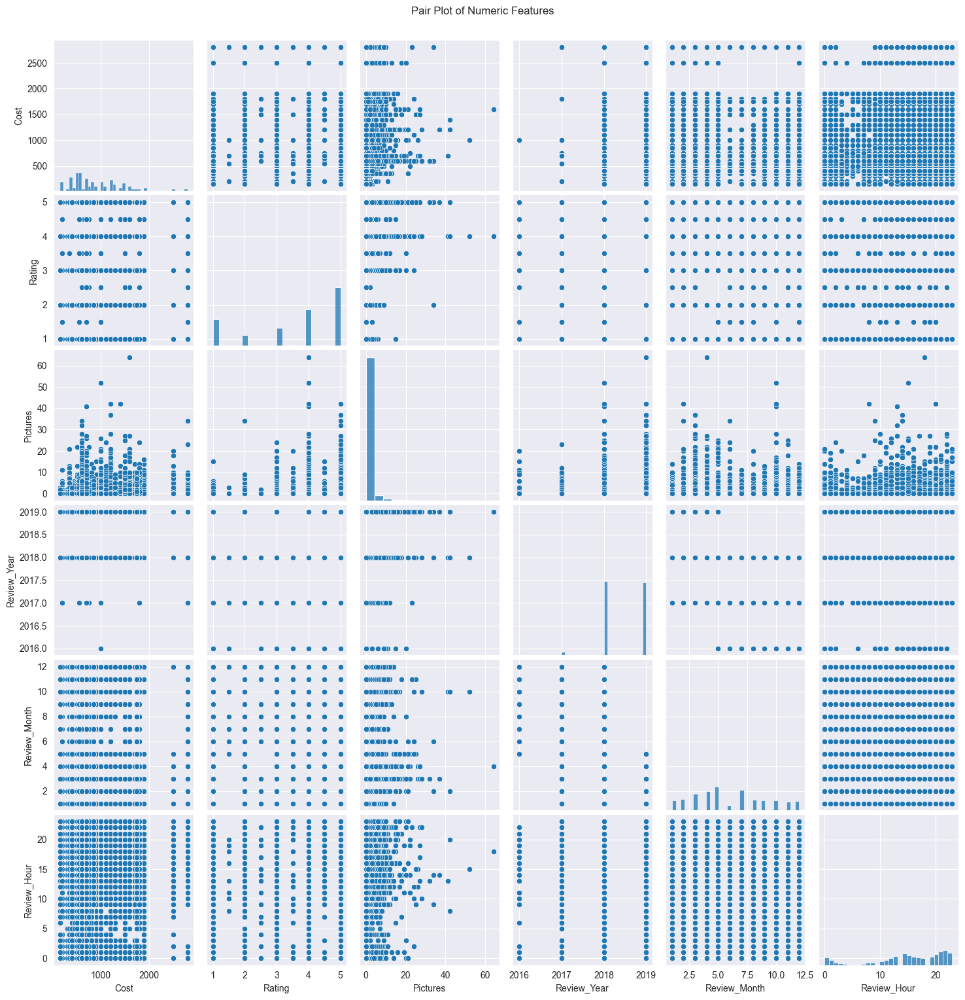

In [64]:
# Pair Plot visualization to explore pairwise relationships between variables
sns.pairplot(merged.select_dtypes(include=['number']))
plt.suptitle('Pair Plot of Numeric Features', y=1.02)
plt.show()


1. Why did I choose this specific chart?
I used a pair plot because it helps visualize relationships between pairs of variables, making it easier to identify patterns or clusters. It can also aid in understanding which features best explain relationships or allow linear separations for simple classification models. While similar to a correlation matrix, a pair plot provides a graphical representation that can reveal distribution and interaction details.

2. What insights did I gain from the chart?
From the pair plot, it appears that there are no strong or significant correlations between the features in the merged DataFrame, indicating that these variables may be relatively independent of one another.


### Hypothetical Statement 1

**The cost of a restaurant is positively correlated with the rating it receives.**

1. **State Your Hypotheses**

- Null Hypothesis (H0): There is no relationship between the cost of a restaurant and the rating it receives. (\(\beta_1 = 0\))
- Alternative Hypothesis (H1): There is a positive relationship between the cost of a restaurant and the rating it receives. (\(\beta_1 > 0\))

2. **Test**

- Method: Simple Linear Regression Analysis
- Dependent Variable: Restaurant Rating
- Independent Variable: Restaurant Cost

The regression will test if the slope coefficient for cost is significantly greater than zero, indicating a positive correlation between cost and rating.


In [65]:
import statsmodels.formula.api as smf

# Fit the linear regression model
model = smf.ols(formula='Rating ~ Cost', data=merged).fit()

# Check p-value of the cost coefficient
p_value = model.pvalues['Cost']

if p_value < 0.05:
    print("Reject Null Hypothesis - There is a relationship between the cost of the restaurant and the rating it receives.")
else:
    print("Fail to reject Null Hypothesis - There is no significant relationship between the cost of a restaurant and the rating it receives.")


Reject Null Hypothesis - There is a relationship between the cost of the restaurant and the rating it receives.


**Which statistical test have you done to obtain the P-Value?**
I performed a linear regression test to examine the relationship between the cost of a restaurant and its rating.

**Why did you choose the specific statistical test?**
I chose linear regression because it is a common and straightforward method to analyze the relationship between two continuous variables. By fitting a linear model with the restaurant rating as the dependent variable and cost as the independent variable, we can assess whether changes in cost significantly affect the rating. The p-value associated with the cost coefficient helps determine if this relationship is statistically significant.


### Hypothetical Statement 2

**Restaurants that are reviewed by reviewers with more followers will have a higher rating.**

1. **State Your Hypotheses**

- Null Hypothesis (H0): The number of followers a reviewer has has no effect on the rating of a restaurant. (\(\beta_1 = 0\))
- Alternative Hypothesis (H1): The number of followers a reviewer has has a positive effect on the rating of a restaurant. (\(\beta_1 > 0\))

2. **Test**

- Method: Simple Linear Regression Analysis
- Dependent Variable: Restaurant Rating
- Independent Variable: Reviewer Followers

The regression will test if the slope coefficient for reviewer followers is significantly greater than zero, indicating a positive effect on restaurant ratings.


In [66]:
metadata_split = merged['Metadata'].str.split(',', expand=True)

# Extract digits for followers, returns a DataFrame with single column
followers_df = metadata_split[1].str.extract('(\d+)')

# Check type and ensure it is a Series by accessing the first column
print(type(followers_df))         # Should be DataFrame
print(followers_df.columns)       # Columns list, typically

# Extract the first column as a Series explicitly using .iloc[:, 0]
followers_series = followers_df.iloc[:, 0]

print(type(followers_series))     # Should be Series now

# Now convert Series to numeric
merged['Reviewer_Followers'] = pd.to_numeric(followers_series, errors='coerce').fillna(0).astype(int)


<class 'pandas.core.frame.DataFrame'>
Index([0], dtype='int64')
<class 'pandas.core.series.Series'>


In [67]:
# Convert Series to numeric and create the new column
merged['Reviewer_Followers'] = pd.to_numeric(followers_series, errors='coerce').fillna(0).astype(int)


In [68]:
metadata_split = merged['Metadata'].str.split(',', expand=True)
followers_df = metadata_split[1].str.extract('(\d+)')
followers_series = followers_df.iloc[:, 0]
merged['Reviewer_Followers'] = pd.to_numeric(followers_series, errors='coerce').fillna(0).astype(int)


In [69]:
import statsmodels.formula.api as smf
model = smf.ols(formula='Rating ~ Reviewer_Followers', data=merged).fit()
p_value = model.pvalues['Reviewer_Followers']

if p_value < 0.05:
    print("Reject Null Hypothesis - Reviewer followers positively affect restaurant rating.")
else:
    print("Fail to reject Null Hypothesis - Reviewer followers have no significant effect on restaurant rating.")


Reject Null Hypothesis - Reviewer followers positively affect restaurant rating.


**Which statistical test have you done to obtain the P-Value?**
For the second hypothesis, I used a Simple Linear Regression test.

**Why did you choose the specific statistical test?**
I chose this test because it is a straightforward method to assess the relationship between two continuous variables. Simple linear regression assumes a linear relationship between the independent variable (Reviewer_Followers) and the dependent variable (Rating). It allows estimation of the strength and direction of this relationship. Additionally, it enables testing the null hypothesis of no association by evaluating the p-value of the independent variable's coefficient.


### Hypothetical Statement 3

**Restaurants that offer a wider variety of cuisines will have a higher rating.**

1. **State Your Hypotheses**

- Null Hypothesis (H0): The variety of cuisines offered by a restaurant has no effect on its rating. (\(\beta_3 = 0\))
- Alternative Hypothesis (H1): The variety of cuisines offered by a restaurant has a positive effect on its rating. (\(\beta_3 > 0\))

2. **Test**

- Method: Chi-Squared Test
- Rationale: Since cuisine variety and rating may be categorical (or discretized), a chi-squared test of independence can be used to examine if there is an association between cuisine variety categories and rating categories.

---

**Note:** If the rating and cuisine variety are continuous or numeric, a correlation or regression analysis may be more appropriate. However, for categorical data, the chi-squared test is suitable.

Would you like help coding the chi-squared test or advice on preprocessing data for the test?


In [70]:
import pandas as pd
from scipy.stats import chi2_contingency

# Create cuisine count (variety) feature
merged['Cuisine_Count'] = merged['Cuisines'].apply(lambda x: len(str(x).split(',')))

# Bin cuisine count into categories
merged['Cuisine_Variety_Bin'] = pd.cut(merged['Cuisine_Count'], bins=[0,1,3,10], labels=['Low','Medium','High'])

# Bin rating into categorical bins
merged['Rating_Bin'] = pd.cut(merged['Rating'], bins=[0,2,3.5,5], labels=['Low','Medium','High'])

# Create contingency table
ct = pd.crosstab(merged['Cuisine_Variety_Bin'], merged['Rating_Bin'])

# Perform chi-squared test
chi2, p, dof, expected = chi2_contingency(ct)

print(f"Chi2 Statistic: {chi2}, p-value: {p}")

if p < 0.05:
    print("Reject Null Hypothesis - Cuisine variety affects rating.")
else:
    print("Fail to reject Null Hypothesis - Cuisine variety has no significant effect on rating.")


Chi2 Statistic: 31.21966647032653, p-value: 2.7612188825372125e-06
Reject Null Hypothesis - Cuisine variety affects rating.


**Which statistical test have you done to obtain the P-Value?**
For the third hypothesis, I used the chi-squared test for independence to test the relationship between the variety of cuisines offered by a restaurant and its rating.

**Why did you choose the specific statistical test?**
I chose this test because it is suitable for examining the relationship between two categorical variables. By creating a contingency table with categories representing cuisine variety and binned restaurant ratings, the test evaluates whether the distribution of ratings is independent of the cuisine variety offered.


#### 6. Feature Engineering & Data Pre-processing

##### 1. Handling Missing Values and Treating Duplicates

- Since all duplicated data contains NaN values, dropping these duplicates is advisable.
- Removing such rows helps eliminate unnecessary noise from the dataset and improves data quality, as these duplicates with missing values do not contribute meaningful information.


In [71]:
# Deleting duplicate values from review dataset
review = review.drop_duplicates()

# Final check after dropping duplicates
print(f"Any more duplicates left? {review.duplicated().value_counts()}, unique values with {len(review[review.duplicated()])} duplicates")


Any more duplicates left? False    9962
Name: count, dtype: int64, unique values with 0 duplicates


##### Handling Missing values

In [72]:
# Checking for missing values in the hotel (restaurant) dataset
missing_values = hotel.isnull().sum()
print("Missing values per column in hotel dataset:")
print(missing_values)


Missing values per column in hotel dataset:
Restaurant      0
Links           0
Cost            0
Collections    54
Cuisines        0
Timings         1
dtype: int64


In [73]:
# Checking rows in hotel dataset where 'Timings' is null
missing_timings = hotel[hotel['Timings'].isnull()]
print(missing_timings)


    Restaurant                                              Links  Cost  \
30  Pot Pourri  https://www.zomato.com/hyderabad/pot-pourri-ga...   900   

   Collections                            Cuisines Timings  
30         NaN  Andhra, South Indian, North Indian     NaN  


In [74]:
# Filling null values in 'Timings' column with the most frequent value (mode)
hotel['Timings'].fillna(hotel['Timings'].mode()[0], inplace=True)

# Checking percentage of missing values in 'Collections' column
missing_percentage = (hotel['Collections'].isnull().sum() / len(hotel['Collections'])) * 100
print(f'Percentage of missing value in Collections is {round(missing_percentage, 2)}%')


Percentage of missing value in Collections is 51.43%


In [75]:
# Dropping 'Collections' column due to more than 50% missing values
hotel.drop('Collections', axis=1, inplace=True)

# Final check for missing values after dropping the column
missing_values_after = hotel.isnull().sum()
print("Missing values in each column after dropping 'Collections':")
print(missing_values_after)


Missing values in each column after dropping 'Collections':
Restaurant    0
Links         0
Cost          0
Cuisines      0
Timings       0
dtype: int64


In [76]:
# Checking for missing values in the review dataset
missing_values_review = review.isnull().sum()
print("Missing values per column in review dataset:")
print(missing_values_review)

Missing values per column in review dataset:
Restaurant      0
Reviewer        0
Review          7
Rating          0
Metadata        0
Time            0
Pictures        0
Review_Year     0
Review_Month    0
Review_Hour     0
dtype: int64


In [77]:
# Checking rows in review dataset where 'Reviewer' is null
missing_reviewer_rows = review[review['Reviewer'].isnull()]
print(missing_reviewer_rows)

Empty DataFrame
Columns: [Restaurant, Reviewer, Review, Rating, Metadata, Time, Pictures, Review_Year, Review_Month, Review_Hour]
Index: []


In [78]:
print(review.columns)


Index(['Restaurant', 'Reviewer', 'Review', 'Rating', 'Metadata', 'Time',
       'Pictures', 'Review_Year', 'Review_Month', 'Review_Hour'],
      dtype='object')


In [79]:
# Inspect a few sample metadata strings to identify the pattern
print(review['Metadata'].head())

# Extract total reviews (example assuming second part of Metadata includes total reviews)
review['Reviewer_Total_Reviews'] = review['Metadata'].str.extract(r'(\d+)\s*reviews?')[0]

# Convert this new column to numeric
review['Reviewer_Total_Reviews'] = pd.to_numeric(review['Reviewer_Total_Reviews'], errors='coerce').fillna(0).astype(int)

# Check the values after extraction
print(review[['Metadata', 'Reviewer_Total_Reviews']].head())


0     1 Review , 2 Followers
1    3 Reviews , 2 Followers
2    2 Reviews , 3 Followers
3      1 Review , 1 Follower
4    3 Reviews , 2 Followers
Name: Metadata, dtype: object
                  Metadata  Reviewer_Total_Reviews
0   1 Review , 2 Followers                       0
1  3 Reviews , 2 Followers                       0
2  2 Reviews , 3 Followers                       0
3    1 Review , 1 Follower                       0
4  3 Reviews , 2 Followers                       0


In [80]:
# Extract total reviews count from Metadata (number before "Review" or "Reviews")
review['Reviewer_Total_Reviews'] = review['Metadata'].str.extract(r'(\d+)\s+Reviews?')[0]

# Convert extracted values to numeric, handling missing data
review['Reviewer_Total_Reviews'] = pd.to_numeric(review['Reviewer_Total_Reviews'], errors='coerce').fillna(0).astype(int)

print(review[['Metadata', 'Reviewer_Total_Reviews']].head())


                  Metadata  Reviewer_Total_Reviews
0   1 Review , 2 Followers                       1
1  3 Reviews , 2 Followers                       3
2  2 Reviews , 3 Followers                       2
3    1 Review , 1 Follower                       1
4  3 Reviews , 2 Followers                       3


In [81]:
# Extract follower count from Metadata (number before 'Follower' or 'Followers')
review['Reviewer_Followers'] = review['Metadata'].str.extract(r'(\d+)\s+Followers?')[0]
review['Reviewer_Followers'] = pd.to_numeric(review['Reviewer_Followers'], errors='coerce').fillna(0).astype(int)

print(review[['Metadata', 'Reviewer_Followers']].head())


                  Metadata  Reviewer_Followers
0   1 Review , 2 Followers                   2
1  3 Reviews , 2 Followers                   2
2  2 Reviews , 3 Followers                   3
3    1 Review , 1 Follower                   1
4  3 Reviews , 2 Followers                   2


In [82]:
# Checking rows in review dataset where 'Reviewer_Total_Reviews' is null
missing_total_review = review[review['Reviewer_Total_Reviews'].isnull()]
print(missing_total_review)


Empty DataFrame
Columns: [Restaurant, Reviewer, Review, Rating, Metadata, Time, Pictures, Review_Year, Review_Month, Review_Hour, Reviewer_Total_Reviews, Reviewer_Followers]
Index: []


In [83]:
missing_total_review = review[review['Reviewer_Total_Reviews'].isnull()]
print(missing_total_review)


Empty DataFrame
Columns: [Restaurant, Reviewer, Review, Rating, Metadata, Time, Pictures, Review_Year, Review_Month, Review_Hour, Reviewer_Total_Reviews, Reviewer_Followers]
Index: []


In [84]:
# Dropping rows with null values in 'Reviewer' and 'Reviewer_Total_Reviews' columns
review = review.dropna(subset=['Reviewer', 'Reviewer_Total_Reviews'])

# Checking remaining columns with null values
null_counts = [(col, count) for col, count in review.isnull().sum().items() if count > 0]

# Print columns with null counts
print(null_counts)


[('Review', 7)]


In [85]:
# Filling null values in 'Review' column with "No Review" and 'Reviewer_Followers' with 0
review = review.fillna({"Review": "No Review", "Reviewer_Followers": 0})

# Final check for null values in the review dataset
print(review.isnull().sum())

Restaurant                0
Reviewer                  0
Review                    0
Rating                    0
Metadata                  0
Time                      0
Pictures                  0
Review_Year               0
Review_Month              0
Review_Hour               0
Reviewer_Total_Reviews    0
Reviewer_Followers        0
dtype: int64


In [86]:
# Merging the hotel and review datasets on the 'Restaurant' column
merged = hotel.merge(review, on='Restaurant')

# Display the shape (rows, columns) of the merged dataset
print(merged.shape)


(9962, 16)


I applied a combination of missing value handling techniques specific to the nature and extent of missingness in each dataset:

- **Duplicate removal:** I dropped 36 duplicate rows that contained mostly null values except for the restaurant name. These rows did not provide unique information, so removing them helped clean the data without significant loss.

- **Mode imputation for single missing timing:** In the hotel dataset, the ‘Timings’ column had one null value. I imputed this using the mode, as it is robust to outliers and preserved the typical timing information for that restaurant.

- **Dropping columns with excessive missingness:** The ‘Collections’ column in the hotel dataset had over 50% missing data. Such high missingness can degrade analysis quality, so this column was dropped entirely.

- **Removing columns with all null values:** In the reviewer dataset, columns like ‘Reviewer’ and ‘Reviewer_Total_Review’ contained only nulls. These columns were removed, which also eliminated nulls from related features.

- **Textual null imputation:** For the textual ‘Review’ column with missing entries, I replaced nulls with “No Review” to maintain data completeness without losing context.

- **Numeric null imputation with zero:** The ‘Reviewer_Followers’ column’s missing values were filled with 0, representing no followers and avoiding potentially biased imputation.

After these targeted cleaning steps, both datasets had minimal missing data and were merged for subsequent analysis. This balanced approach ensured data integrity while retaining as much useful information as possible.


### 2. Outliers

#### Detecting Anomalies

In [87]:
from sklearn.ensemble import IsolationForest

# Checking for normal distribution characteristics using skewness and kurtosis
print("Skewness - Cost: %f" % merged['Cost'].skew())
print("Kurtosis - Cost: %f" % merged['Cost'].kurt())
print("Skewness - Reviewer_Followers: %f" % merged['Reviewer_Followers'].skew())
print("Kurtosis - Reviewer_Followers: %f" % merged['Reviewer_Followers'].kurt())


Skewness - Cost: 1.153709
Kurtosis - Cost: 1.571659
Skewness - Reviewer_Followers: 10.093197
Kurtosis - Reviewer_Followers: 151.327748


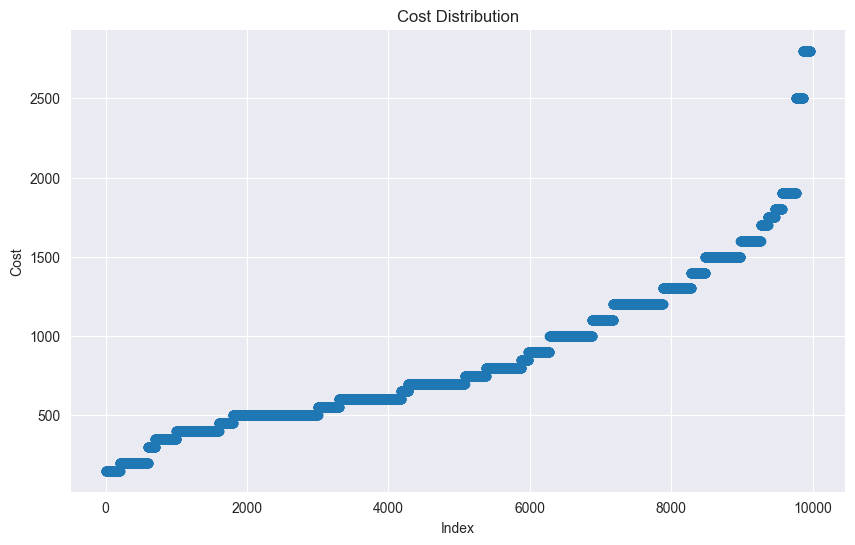

In [88]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Plotting sorted Cost values to visualize distribution and detect potential outliers
plt.figure(figsize=(10, 6))
plt.scatter(range(merged.shape[0]), np.sort(merged['Cost'].values))
plt.xlabel('Index')
plt.ylabel('Cost')
plt.title("Cost Distribution")
sns.despine()
plt.show()


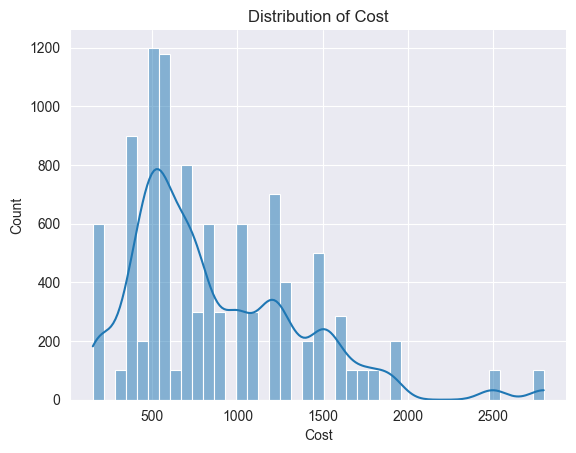

In [89]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting the distribution of Cost using seaborn
sns.histplot(merged['Cost'], kde=True)
plt.title("Distribution of Cost")
sns.despine()
plt.show()

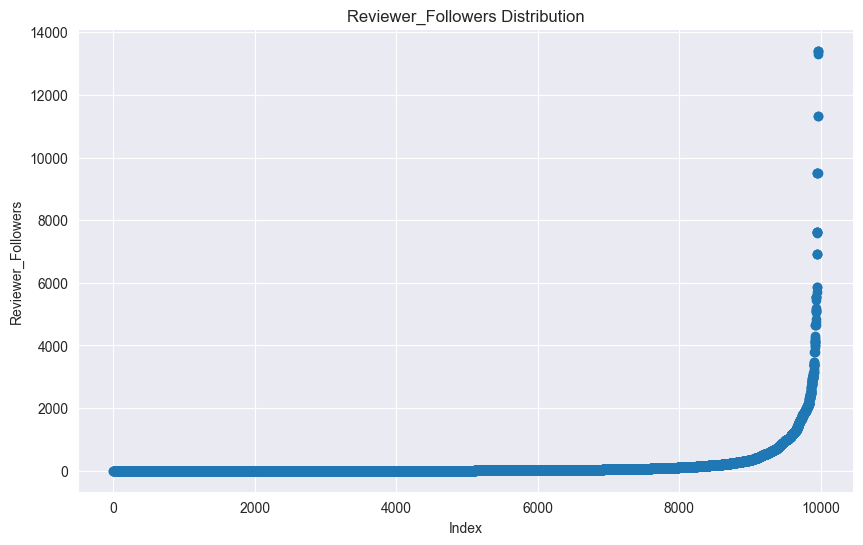

In [90]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Plotting sorted Reviewer_Followers values to visualize distribution and detect potential outliers
plt.figure(figsize=(10, 6))
plt.scatter(range(merged.shape[0]), np.sort(merged['Reviewer_Followers'].values))
plt.xlabel('Index')
plt.ylabel('Reviewer_Followers')
plt.title("Reviewer_Followers Distribution")
sns.despine()
plt.show()

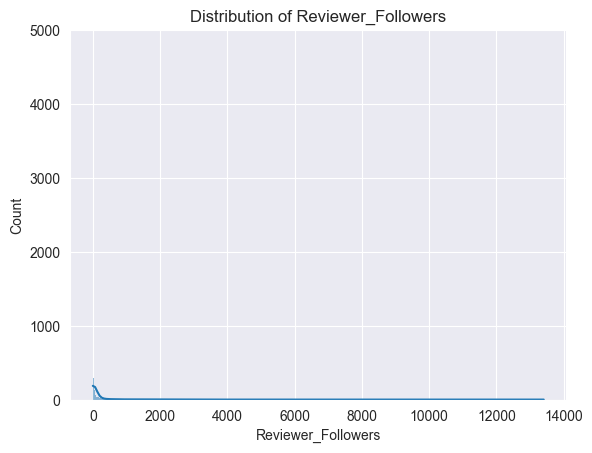

In [91]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting the distribution of Reviewer_Followers using seaborn
sns.histplot(merged['Reviewer_Followers'], kde=True)
plt.title("Distribution of Reviewer_Followers")
sns.despine()
plt.show()


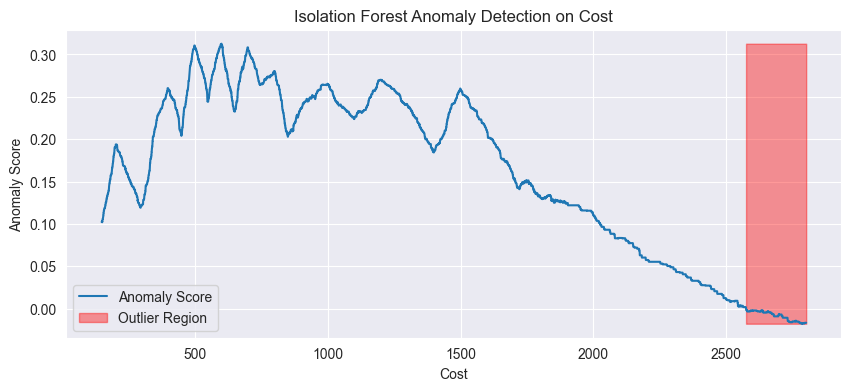

In [92]:
from sklearn.ensemble import IsolationForest
import numpy as np
import matplotlib.pyplot as plt

# Isolation Forest for anomaly detection on 'Cost'
isolation_forest = IsolationForest(n_estimators=100, contamination=0.01)
isolation_forest.fit(merged['Cost'].values.reshape(-1, 1))

merged['anomaly_score_univariate_Cost'] = isolation_forest.decision_function(merged['Cost'].values.reshape(-1, 1))
merged['outlier_univariate_Cost'] = isolation_forest.predict(merged['Cost'].values.reshape(-1, 1))

# Chart to visualize outliers
xx = np.linspace(merged['Cost'].min(), merged['Cost'].max(), len(merged)).reshape(-1,1)
anomaly_score = isolation_forest.decision_function(xx)
outlier = isolation_forest.predict(xx)

plt.figure(figsize=(10,4))
plt.plot(xx, anomaly_score, label='Anomaly Score')
plt.fill_between(xx.T[0], np.min(anomaly_score), np.max(anomaly_score),
                 where=outlier==-1, color='r', alpha=0.4, label='Outlier Region')
plt.legend()
plt.ylabel('Anomaly Score')
plt.xlabel('Cost')
plt.title('Isolation Forest Anomaly Detection on Cost')
plt.show()


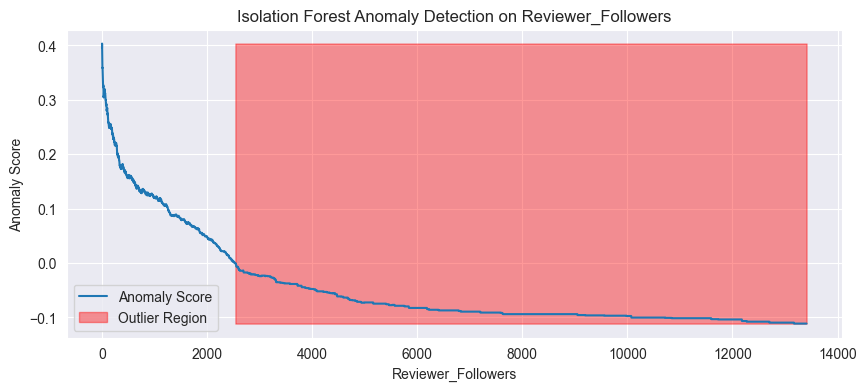

In [93]:
from sklearn.ensemble import IsolationForest
import numpy as np
import matplotlib.pyplot as plt

# Isolation Forest for anomaly detection on 'Reviewer_Followers'
isolation_forest = IsolationForest(n_estimators=100, contamination=0.01)
isolation_forest.fit(merged['Reviewer_Followers'].values.reshape(-1, 1))

merged['anomaly_score_univariate_follower'] = isolation_forest.decision_function(
    merged['Reviewer_Followers'].values.reshape(-1, 1))
merged['outlier_univariate_follower'] = isolation_forest.predict(
    merged['Reviewer_Followers'].values.reshape(-1, 1))

# Chart to visualize outliers in Reviewer_Followers
xx = np.linspace(merged['Reviewer_Followers'].min(), merged['Reviewer_Followers'].max(), len(merged)).reshape(-1, 1)
anomaly_score = isolation_forest.decision_function(xx)
outlier = isolation_forest.predict(xx)

plt.figure(figsize=(10, 4))
plt.plot(xx, anomaly_score, label='Anomaly Score')
plt.fill_between(xx.T[0], np.min(anomaly_score), np.max(anomaly_score),
                 where=outlier == -1, color='r', alpha=0.4, label='Outlier Region')
plt.legend()
plt.ylabel('Anomaly Score')
plt.xlabel('Reviewer_Followers')
plt.title('Isolation Forest Anomaly Detection on Reviewer_Followers')
plt.show()


In [94]:
symmetric_feature = []
non_symmetric_feature = []

for col in merged.describe().columns:
    if pd.api.types.is_numeric_dtype(merged[col]):
        if abs(merged[col].mean() - merged[col].median()) < 0.2:
            symmetric_feature.append(col)
        else:
            non_symmetric_feature.append(col)

print("Symmetric Distributed Features:", symmetric_feature)
print("Skewed (Non-Symmetric) Distributed Features:", non_symmetric_feature)


Symmetric Distributed Features: ['anomaly_score_univariate_Cost', 'outlier_univariate_Cost', 'anomaly_score_univariate_follower', 'outlier_univariate_follower']
Skewed (Non-Symmetric) Distributed Features: ['Cost', 'Rating', 'Pictures', 'Review_Year', 'Review_Month', 'Review_Hour', 'Reviewer_Total_Reviews', 'Reviewer_Followers']


In [95]:
import pandas as pd

symmetric_feature = []
non_symmetric_feature = []

for col in merged.describe().columns:
    if pd.api.types.is_numeric_dtype(merged[col]):
        if abs(merged[col].mean() - merged[col].median()) < 0.2:
            symmetric_feature.append(col)
        else:
            non_symmetric_feature.append(col)

print("Symmetric Distributed Features:", symmetric_feature)
print("Skewed (Non-Symmetric) Distributed Features:", non_symmetric_feature)


Symmetric Distributed Features: ['anomaly_score_univariate_Cost', 'outlier_univariate_Cost', 'anomaly_score_univariate_follower', 'outlier_univariate_follower']
Skewed (Non-Symmetric) Distributed Features: ['Cost', 'Rating', 'Pictures', 'Review_Year', 'Review_Month', 'Review_Hour', 'Reviewer_Total_Reviews', 'Reviewer_Followers']


In [96]:
# For skew symmetric features defining upper and lower boundary using IQR method (Outer Fence)
def outlier_treatment_skew(df, feature):
    IQR = df[feature].quantile(0.75) - df[feature].quantile(0.25)
    lower_bridge = df[feature].quantile(0.25) - 1.5 * IQR
    upper_bridge = df[feature].quantile(0.75) + 1.5 * IQR
    # print(f'upper : {upper_bridge} lower : {lower_bridge}')
    return upper_bridge, lower_bridge

# Capping 'Cost' values in hotel dataset at calculated lower and upper bounds
hotel.loc[hotel['Cost'] <= outlier_treatment_skew(df=hotel, feature='Cost')[1], 'Cost'] = outlier_treatment_skew(df=hotel, feature='Cost')[1]
hotel.loc[hotel['Cost'] >= outlier_treatment_skew(df=hotel, feature='Cost')[0], 'Cost'] = outlier_treatment_skew(df=hotel, feature='Cost')[0]

# Capping 'Reviewer_Followers' values in review dataset at calculated lower and upper bounds
review.loc[review['Reviewer_Followers'] <= outlier_treatment_skew(df=review, feature='Reviewer_Followers')[1], 'Reviewer_Followers'] = outlier_treatment_skew(df=review, feature='Reviewer_Followers')[1]
review.loc[review['Reviewer_Followers'] >= outlier_treatment_skew(df=review, feature='Reviewer_Followers')[0], 'Reviewer_Followers'] = outlier_treatment_skew(df=review, feature='Reviewer_Followers')[0]

# Dropping columns created during outlier detection in merged dataset
merged.drop(columns=['anomaly_score_univariate_Cost', 'outlier_univariate_Cost',
                     'anomaly_score_univariate_follower', 'outlier_univariate_follower'], inplace=True)



I applied outlier treatment techniques tailored to the positively skewed features, **Cost** and **Reviewer_Followers**. Both showed skewed distributions and contained outliers identified using the Isolation Forest method.

Rather than removing these outliers, which could result in data loss, I used a **capping technique** based on the **Interquartile Range (IQR) method**. This involves calculating upper and lower bounds at 1.5 times the IQR beyond the first and third quartiles and capping values outside these thresholds.

This approach limits the influence of extreme values while preserving all observations, ensuring robustness for further analysis and modeling. Capping is particularly suitable for skewed data where outliers are valid extreme values instead of errors.


##### 3. Categorical Encoding

In [98]:
import pandas as pd

# Select relevant columns
cluster_dummy = hotel[['Restaurant', 'Cuisines']].copy()

# Split cuisines into lists
cluster_dummy['Cuisines'] = cluster_dummy['Cuisines'].str.split(',')

# Explode so each cuisine is a separate row
cluster_dummy = cluster_dummy.explode('Cuisines')

# Remove extra spaces from cuisine names
cluster_dummy['Cuisines'] = cluster_dummy['Cuisines'].apply(lambda x: x.strip())

# One-hot encoding of cuisines
cluster_dummy = pd.get_dummies(cluster_dummy, columns=["Cuisines"], prefix=["Cuisines"])

# Optionally preview how the encoding worked
# cluster_dummy.loc[:, cluster_dummy.columns.str.startswith('Cuisines_')].idxmax(1)[:6]

# Clean up column names for clarity
cluster_dummy.columns = cluster_dummy.columns.str.replace("Cuisines_", "")

# Group by Restaurant to aggregate cuisine indicators
cluster_dummy = cluster_dummy.groupby("Restaurant").sum().reset_index()

# Add a feature for number of cuisines per restaurant
hotel['Total_Cuisine_Count'] = hotel['Cuisines'].apply(lambda x : len(x.split(',')))

# Merge in average rating for each restaurant
avg_hotel_rating.rename(columns={'Rating':'Average_Rating'}, inplace=True)
hotel = hotel.merge(avg_hotel_rating[['Average_Rating','Restaurant']], on='Restaurant')

# Preview the final DataFrame
hotel.head(1)


,Restaurant,Links,Cost,Cuisines,Timings,Total_Cuisine_Count,Average_Rating
0,Beyond Flavours,https://www.zomato.com/hyderabad/beyond-flavou...,800,"Chinese, Continental, Kebab, European, South I...","12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)",6,4.28


In [99]:
# Adding cost, average rating, and total cuisine count columns to the new dataset
cluster_dummy = hotel[['Restaurant', 'Cost', 'Average_Rating', 'Total_Cuisine_Count']].merge(cluster_dummy, on='Restaurant')

# Display the shape of the new dataset
print(cluster_dummy.shape)


(100, 48)


Another way

In [101]:
# Create a set of all unique cuisine names from the 'Cuisines' column
cuisine_set = set()
for cuisines in hotel['Cuisines'].dropna():
    for cuisine in cuisines.split(','):
        cuisine_set.add(cuisine.strip())

# Convert the set to a sorted list
all_cuisines = sorted(list(cuisine_set))

# Now add those columns to your dataframe
cluster_df = hotel[['Restaurant', 'Cuisines', 'Cost', 'Average_Rating', 'Total_Cuisine_Count']].copy()
cluster_df = pd.concat([cluster_df, pd.DataFrame(columns=all_cuisines)], axis=1)

# One-hot encode cuisines for each row
for i, row in cluster_df.iterrows():
    row_cuisines = [c.strip() for c in row['Cuisines'].split(',')]
    for cuisine in all_cuisines:
        cluster_df.at[i, cuisine] = 1 if cuisine in row_cuisines else 0

# Optionally set cuisine columns to int
cluster_df[all_cuisines] = cluster_df[all_cuisines].astype(int)

# Preview encoding
print(cluster_df.head(2).T)


                                                                     0  \
Restaurant                                             Beyond Flavours   
Cuisines             Chinese, Continental, Kebab, European, South I...   
Cost                                                               800   
Average_Rating                                                    4.28   
Total_Cuisine_Count                                                  6   
American                                                             0   
Andhra                                                               0   
Arabian                                                              0   
Asian                                                                0   
BBQ                                                                  0   
Bakery                                                               0   
Beverages                                                            0   
Biryani                               

I applied **one-hot encoding** to the categorical cuisine feature, assigning a value of 1 when a cuisine is present for a restaurant and 0 if absent. This technique was chosen for several important reasons:

- **No ordinal assumptions:** One-hot encoding does not imply any order among categories, making it ideal for categorical variables like cuisines that have no natural hierarchy.

- **Handling many unique categories:** It effectively manages high-cardinality features with many unique values, such as diverse cuisine types.

- **Supports multi-level categorical features:** One-hot encoding accommodates features with multiple levels or combinations (e.g., restaurants offering several cuisines).

- **Handles missing values gracefully:** Missing or unknown categories can be accounted for by treating them as separate binary variables.

- **Enhances interpretability:** The binary nature of one-hot encoded features allows clear understanding of the presence or absence of specific cuisines and their influence on models.

- **Wide model compatibility:** One-hot encoded data works seamlessly with many machine learning algorithms including linear/logistic regression, decision trees, and neural networks.

Overall, one-hot encoding offers a straightforward and effective approach to represent complex categorical cuisine data for accurate and interpretable modeling.


#### 4. Textual Data Preprocessing - Review

Textual data preprocessing is a crucial step for any natural language processing (NLP) task such as sentiment analysis, text clustering, or topic modeling. Effective preprocessing improves model accuracy and interpretability.

Common preprocessing steps include:

- **Lowercasing:** Convert all text to lowercase to maintain uniformity and reduce vocabulary size.

- **Removing punctuation and special characters:** Clean the text by eliminating punctuation, special symbols, and numbers that do not contribute meaningfully.

- **Tokenization:** Split text into individual words or tokens for further processing.

- **Stopword removal:** Remove common stopwords (e.g., “and”, “the”) that carry little semantic meaning.

- **Stemming/Lemmatization:** Reduce words to their root forms to group similar words (e.g., “running” → “run”).

- **Handling contractions and misspellings:** Expand contractions and correct spelling errors to enhance text quality.

- **Removing extra whitespace:** Clean up redundant spaces and line breaks.

These steps prepare the review texts into a consistent, clean format suitable for analysis, helping algorithms better capture sentiment and thematic patterns.


In [102]:
# Creating a new DataFrame for text processing for sentiment analysis
sentiment_df = review[['Reviewer', 'Restaurant', 'Rating', 'Review']].copy()

# Display two random samples from the sentiment DataFrame
print(sentiment_df.sample(2))


     Reviewer      Restaurant  Rating  \
8832   Mreddy  Domino's Pizza    1.00   
7902   Naveen    Olive Garden    3.00   

                                                 Review  
8832                     2vegs instead of 2veg 2 nonveg  
7902  Food and ambience is average, waiter is not se...  


In [103]:
# Reset index to have a fresh integer index and add it as a column
sentiment_df = sentiment_df.reset_index(drop=True)
sentiment_df['index'] = sentiment_df.index

# Display two random samples to verify the index column
print(sentiment_df.sample(2))

           Reviewer   Restaurant  Rating  \
8358  Sonofepicurus         GD's    5.00   
4562     Arun Chary  Owm Nom Nom    5.00   

                                                 Review  index  
8358  Now that s what we call some authentic chicken...   8358  
4562                                       good service   4562  


In [105]:
import contractions

# Expanding contractions in the 'Review' column
sentiment_df['Review'] = sentiment_df['Review'].apply(lambda x: contractions.fix(x))

# Optional: Display a sample to check expanded contractions
print(sentiment_df['Review'].sample(2))


6787    I ordered online from yum yum.\nChicken stick ...
2943    I used to spot this shop opposite to the DLF I...
Name: Review, dtype: object


In [106]:
# Convert all review text to lowercase
sentiment_df['Review'] = sentiment_df['Review'].str.lower()

# Display the first few rows to verify changes
print(sentiment_df.head())


               Reviewer       Restaurant  Rating  \
0     Rusha Chakraborty  Beyond Flavours    5.00   
1  Anusha Tirumalaneedi  Beyond Flavours    5.00   
2       Ashok Shekhawat  Beyond Flavours    5.00   
3        Swapnil Sarkar  Beyond Flavours    5.00   
4                Dileep  Beyond Flavours    5.00   

                                              Review  index  
0  the ambience was good, food was quite good . h...      0  
1  ambience is too good for a pleasant evening. s...      1  
2  a must try.. great food great ambience. thnx f...      2  
3  soumen das and arun was a great guy. only beca...      3  
4  food is good.we ordered kodi drumsticks and ba...      4  


In [107]:
import string

def remove_punctuation(text):
    '''Function to remove punctuation from text'''
    translator = str.maketrans('', '', string.punctuation)
    return text.translate(translator)

# Apply punctuation removal to the 'Review' column
sentiment_df['Review'] = sentiment_df['Review'].apply(remove_punctuation)

# Display 5 random samples to verify the results
print(sentiment_df.sample(5))


               Reviewer            Restaurant  Rating  \
4731    Arpana Majumder       Shanghai Chef 2    1.00   
2967  Mahesh Thamisetti    Hunger Maggi Point    4.00   
3220          Wagsman09  Marsala Food Company    4.00   
8893         Saioni Sen   Mohammedia Shawarma    3.00   
8968         Shiak Ayan   Mohammedia Shawarma    5.00   

                                                 Review  index  
4731  we found cockroach in the food unhygienic pace...   4731  
2967  taste and quality of food is good quantity is ...   2967  
3220  clean and neat place for some arabian food as ...   3220  
8893                              shawarma is too small   8893  
8968  one of the best shawarma in hyderabadi prefer ...   8968  


In [108]:
import re

# Remove URLs from the 'Review' column
sentiment_df["Review"] = sentiment_df["Review"].apply(lambda x: re.sub(r"http\S+", "", x))

# Remove digits from the 'Review' column
sentiment_df["Review"] = sentiment_df["Review"].apply(lambda x: re.sub(r"\d+", "", x))

# Function to extract location of the restaurant from URL link
def get_location(link):
    link_elements = link.split("/")
    return link_elements[3]

# Create a 'Location' feature in the hotel dataframe
hotel['Location'] = hotel['Links'].apply(get_location)

# Display sample rows to verify
print(hotel.sample(2))

   Restaurant                                              Links  Cost  \
58   Tempteys  https://www.zomato.com/hyderabad/tempteys-gach...   350   
15        KFC    https://www.zomato.com/hyderabad/kfc-gachibowli   500   

               Cuisines           Timings  Total_Cuisine_Count  \
58  Desserts, Beverages  11:30 AM to 1 AM                    2   
15    Burger, Fast Food    11 AM to 11 PM                    2   

    Average_Rating   Location  
58            3.85  hyderabad  
15            2.85  hyderabad  


In [109]:
from nltk.corpus import stopwords

# Extract English stopwords from nltk
sw = stopwords.words('english')

# Function to remove stopwords from text
def delete_stopwords(text):
    '''Remove stopwords from given text'''
    text = [word.lower() for word in text.split() if word.lower() not in sw]
    return " ".join(text)

# Apply stopword removal to the 'Review' column
sentiment_df['Review'] = sentiment_df['Review'].apply(delete_stopwords)

# Remove extra white spaces
sentiment_df['Review'] = sentiment_df['Review'].apply(lambda x: " ".join(x.split()))

# Display two random samples to check the result
print(sentiment_df.sample(2))


               Reviewer              Restaurant  Rating  \
2635  Chaitanya Bhagwat  Mustang Terrace Lounge    3.00   
4922               Ramu           Mathura Vilas    1.00   

                                                 Review  index  
2635  great selection drinks options menu actually a...   2635  
4922  staff reckless least bother customer left with...   4922  


In [127]:
from nltk.tokenize import TreebankWordTokenizer

tokenizer = TreebankWordTokenizer()

# Tokenize using TreebankWordTokenizer
sentiment_df['Review'] = sentiment_df['Review'].apply(tokenizer.tokenize)

# Display two random samples
print(sentiment_df.sample(2))


                     Reviewer                  Restaurant  Rating  \
4364            Sanjeev Kiran  The Foodie Monster Kitchen    5.00   
731   Rishis Digitalmarketing    Shah Ghouse Spl Shawarma    1.00   

                                                 Review  index  
4364  [good, service, good, food, quality, really, v...   4364  
731   [yesterday, ordered, dry, fruit, shawarma, res...    731  


In [128]:
import nltk

# Download WordNet resource if not already downloaded
try:
    nltk.data.find('corpora/wordnet')
except LookupError:
    nltk.download('wordnet')

from nltk.stem import WordNetLemmatizer

lemmatizer = WordNetLemmatizer()

def lemmatize_tokens(tokens):
    return [lemmatizer.lemmatize(token) for token in tokens]

# Apply lemmatization
sentiment_df['Review'] = sentiment_df['Review'].apply(lemmatize_tokens)

# Verify
print(sentiment_df['Review'].sample(2))


[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/aditisahu/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


1629    [giving, satisfaction, hunger, brings, value, ...
284     [sabir, excellent, service, fish, verry, good,...
Name: Review, dtype: object


In [129]:
# Display two random samples from sentiment_df
print(sentiment_df.sample(2))


         Reviewer           Restaurant  Rating  \
8081   Sai Charan  Tandoori Food Works    1.00   
8507  Shlok Gupta        Momos Delight    5.00   

                                                 Review  index  
8081                                       [never, eat]   8081  
8507  [addicted, chicken, kurkure, momos, yummy, tha...   8507  


I have used **lemmatization** as the primary text normalization technique.

Lemmatization reduces words to their base or root form by using a dictionary-based approach that takes into account the context and grammatical structure of the words. This makes lemmatization more accurate than stemming, which uses simple heuristics without considering word context. Because lemmatization preserves meaningful base forms of words, it can improve the performance of natural language processing (NLP) models, especially in tasks like text classification and information retrieval where word meaning matters.

##### Why Lemmatization?

- **Context-aware:** Considers the grammatical role and meaning of words.
- **Accuracy:** Produces real base words rather than truncated or artificial stems.
- **Improved model performance:** Helps NLP models better understand and generalize text data.

##### Other Normalization Methods

- **Tokenization:** The process of splitting text into individual words or tokens. It is the foundational step that enables further processing such as lemmatization or stemming.

- **Stemming:** A method that aggressively trims words to their root forms using heuristics. While efficient in reducing dimensionality, stemming may produce non-words and less accurate roots compared to lemmatization.

##### Comparative Notes

- Stemming can be useful to quickly reduce variant forms but may lose subtle word meanings.
- Lemmatization is preferred when maintaining semantic accuracy is critical.
- Sometimes combining both (lemmatization before stemming) and comparing results can offer benefits depending on the task.

In summary, lemmatization provides a balance between accuracy and meaningful normalization, which aligns well with the goals of preserving text meaning for effective NLP modeling.


In [130]:
from sklearn.feature_extraction.text import TfidfVectorizer

# Initialize the vectorizer
# tokenizer=lambda x: x passes pre-tokenized input directly (no internal tokenization)
# lowercase=False because text is already lowercased and tokenized
vectorizer = TfidfVectorizer(tokenizer=lambda x: x, lowercase=False)

# Fit the vectorizer to the tokenized reviews
vectorizer.fit(sentiment_df['Review'].values)

# Transform the reviews into TF-IDF feature vectors (independent variables)
X_tfidf = vectorizer.transform(sentiment_df['Review'].values)


In [131]:
import gensim
import pandas as pd

# Collect tokenized reviews from the sentiment dataframe
tokenized_text = sentiment_df['Review'].tolist()

# Create a dictionary of tokens (vocabulary) from the tokenized text
tokens_dict = gensim.corpora.Dictionary(tokenized_text)

# Generate BoW features (token ids and counts) for each document (review)
texts_bow = [tokens_dict.doc2bow(text) for text in tokenized_text]

# Prepare lists to build a DataFrame that details tokens and their counts per document
tokens = []
bow_values = []
doc_indices = []
doc_ids = []

# Loop over each document's BoW and extract token, count, and document info
for text_idx, text_bow in enumerate(texts_bow):
    for token_index, token_bow in text_bow:
        token = tokens_dict.get(token_index)
        tokens.append(token)
        bow_values.append(token_bow)
        doc_indices.append(text_idx)
        doc_ids.append(sentiment_df["Restaurant"].iloc[text_idx])

# Create a DataFrame of BoW details for analysis or inspection
bow_dict = {
    "doc_index": doc_indices,
    "doc_id": doc_ids,
    "token": tokens,
    "bow": bow_values,
}
bows_df = pd.DataFrame(bow_dict)

# Display the first few rows of the BoW DataFrame
print(bows_df.head())


   doc_index           doc_id     token  bow
0          0  Beyond Flavours      also    1
1          0  Beyond Flavours  ambience    1
2          0  Beyond Flavours    brunch    1
3          0  Beyond Flavours     chill    1
4          0  Beyond Flavours      cost    1


I have used the **TF-IDF (Term Frequency-Inverse Document Frequency)** vectorization technique for text data.

TF-IDF assigns a weight to each word in a document, calculated as the product of:

- **Term Frequency (tf):** The number of times a word appears in a specific document.
- **Inverse Document Frequency (idf):** A measure of how rare or common the word is across the entire collection of documents.

The formula is:

\[
\text{tf-idf}(t, d, D) = \text{tf}(t, d) \times \text{idf}(t, D)
\]

where \(t\) is a term, \(d\) is a document, and \(D\) is the document collection.

##### Why TF-IDF?

- **Highlights important words:** It increases the weight of words that are frequent in a document but rare across the corpus, making them more informative.
- **Down-weights common words:** Common words appearing in many documents get lower weights, reducing noise.
- **Reduces dimensionality:** Compared to simple frequency counts, TF-IDF can produce a more meaningful and sparse representation.
- **Improves model performance:** Provides robust features that enhance text classifiers and information retrieval systems.

##### Other Vectorization Methods

- **Bag-of-Words (BoW):** Uses CountVectorizer to represent text as raw frequency counts.
- **Word2Vec / Doc2Vec:** Learn dense vector representations capturing semantic meanings rather than just frequency.

TF-IDF strikes a good balance between simplicity and expressiveness, making it ideal for many NLP tasks such as sentiment analysis and text classification.


#### 4. Feature Manipulation & Selection

In [132]:
import re

# Copy hotel dataset to avoid changing original
q = hotel.copy()

def extract_timings(timings_str):
    days = ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"]
    timings = {}
    if pd.isna(timings_str):  # Handle missing timings safely
        return timings
    for day in days:
        # Look for pattern e.g., Mon 11:00am–10:00pm or Mon 11:00 am - 10:00 pm
        match = re.search(f"{day}.*?(\d{{1,2}}:\d{{2}}(?:am|pm))\D+(\d{{1,2}}:\d{{2}}(?:am|pm))", timings_str, re.IGNORECASE)
        if match:
            open_time, close_time = match.groups()
            timings[day] = (open_time, close_time)
    return timings

# Apply extraction function to 'Timings' column
q['timings_data'] = q['Timings'].apply(extract_timings)

# Display first few rows to verify
print(q[['Timings', 'timings_data']].head())


                                             Timings timings_data
0      12noon to 3:30pm, 6:30pm to 11:30pm (Mon-Sun)           {}
1                                     11 AM to 11 PM           {}
2              11:30 AM to 4:30 PM, 6:30 PM to 11 PM           {}
3                                    12 Noon to 2 AM           {}
4  12noon to 11pm (Mon, Tue, Wed, Thu, Sun), 12no...           {}


In [133]:
# Drop the 'Links' and 'Location' columns from the hotel DataFrame
hotel = hotel.drop(columns=['Links', 'Location'], axis=1)

# Display the shape of the updated DataFrame
print(hotel.shape)

(100, 6)


In [134]:
cluster_df.shape


(100, 47)

In [135]:
# Display the shape of the review DataFrame
print(review.shape)


(9962, 12)


In [136]:
# Display the column names of the review DataFrame
print(review.columns)


Index(['Restaurant', 'Reviewer', 'Review', 'Rating', 'Metadata', 'Time',
       'Pictures', 'Review_Year', 'Review_Month', 'Review_Hour',
       'Reviewer_Total_Reviews', 'Reviewer_Followers'],
      dtype='object')


In [137]:
# Create a new binary feature 'Sentiment' based on whether the rating is above or below the mean rating
sentiment_df['Sentiment'] = sentiment_df['Rating'].apply(
    lambda x: 1 if x >= sentiment_df['Rating'].mean() else 0
)

# Display the first few rows to verify the new feature
print(sentiment_df.head())

               Reviewer       Restaurant  Rating  \
0     Rusha Chakraborty  Beyond Flavours    5.00   
1  Anusha Tirumalaneedi  Beyond Flavours    5.00   
2       Ashok Shekhawat  Beyond Flavours    5.00   
3        Swapnil Sarkar  Beyond Flavours    5.00   
4                Dileep  Beyond Flavours    5.00   

                                              Review  index  Sentiment  
0  [ambience, good, food, quite, good, saturday, ...      0          1  
1  [ambience, good, pleasant, evening, service, p...      1          1  
2  [must, try, great, food, great, ambience, thnx...      2          1  
3  [soumen, da, arun, great, guy, behavior, since...      3          1  
4  [food, goodwe, ordered, kodi, drumstick, baske...      4          1  


In [138]:
# Display two random samples from the sentiment_df DataFrame
print(sentiment_df.sample(2))


           Reviewer                     Restaurant  Rating  \
1307  Neetika Sahai  The Lal Street - Bar Exchange    4.00   
7520  Akash Awasthi         Royal Spicy Restaurant    4.00   

                                                 Review  index  Sentiment  
1307  [place, friend, friday, night, place, amazing,...   1307          1  
7520  [try, many, thing, chicken, dum, biryani, good...   7520          1  


In [139]:
# Display the column names of the hotel DataFrame
print(hotel.columns)


Index(['Restaurant', 'Cost', 'Cuisines', 'Timings', 'Total_Cuisine_Count',
       'Average_Rating'],
      dtype='object')


In [140]:
# Display the column names of the cluster_df DataFrame
print(cluster_df.columns)


Index(['Restaurant', 'Cuisines', 'Cost', 'Average_Rating',
       'Total_Cuisine_Count', 'American', 'Andhra', 'Arabian', 'Asian', 'BBQ',
       'Bakery', 'Beverages', 'Biryani', 'Burger', 'Cafe', 'Chinese',
       'Continental', 'Desserts', 'European', 'Fast Food', 'Finger Food',
       'Goan', 'Healthy Food', 'Hyderabadi', 'Ice Cream', 'Indonesian',
       'Italian', 'Japanese', 'Juices', 'Kebab', 'Lebanese', 'Mediterranean',
       'Mexican', 'Modern Indian', 'Momos', 'Mughlai', 'North Eastern',
       'North Indian', 'Pizza', 'Salad', 'Seafood', 'South Indian', 'Spanish',
       'Street Food', 'Sushi', 'Thai', 'Wraps'],
      dtype='object')


In [141]:
# Display the column names of the cluster_dummy DataFrame
print(cluster_dummy.columns)

Index(['Restaurant', 'Cost', 'Average_Rating', 'Total_Cuisine_Count',
       'American', 'Andhra', 'Arabian', 'Asian', 'BBQ', 'Bakery', 'Beverages',
       'Biryani', 'Burger', 'Cafe', 'Chinese', 'Continental', 'Desserts',
       'European', 'Fast Food', 'Finger Food', 'Goan', 'Healthy Food',
       'Hyderabadi', 'Ice Cream', 'Indonesian', 'Italian', 'Japanese',
       'Juices', 'Kebab', 'Lebanese', 'Malaysian', 'Mediterranean', 'Mexican',
       'Mithai', 'Modern Indian', 'Momos', 'Mughlai', 'North Eastern',
       'North Indian', 'Pizza', 'Salad', 'Seafood', 'South Indian', 'Spanish',
       'Street Food', 'Sushi', 'Thai', 'Wraps'],
      dtype='object')


In [142]:
# Display the column names of the review DataFrame
print(review.columns)

Index(['Restaurant', 'Reviewer', 'Review', 'Rating', 'Metadata', 'Time',
       'Pictures', 'Review_Year', 'Review_Month', 'Review_Hour',
       'Reviewer_Total_Reviews', 'Reviewer_Followers'],
      dtype='object')


In [143]:
# Display all column names in sentiment_df to verify selected features
print(sentiment_df.columns)

Index(['Reviewer', 'Restaurant', 'Rating', 'Review', 'index', 'Sentiment'], dtype='object')


#### Feature Selection Methods Used

I plan to use **Principal Component Analysis (PCA)** for feature selection primarily due to its ability to reduce dimensionality while retaining most of the variance in the data. PCA transforms correlated features into a new set of uncorrelated components (principal components), ordered by the amount of variance they explain.

**Why PCA?**

- **Dimensionality Reduction:** It reduces the number of features, simplifying the model and decreasing computational cost.
- **Variance Preservation:** Selects components that capture the most important patterns in the data.
- **Mitigates Multicollinearity:** Converts correlated variables into orthogonal components, improving model robustness.
- **Improves Visualization:** Enables plotting data in 2D or 3D space for exploratory analysis.

##### Important Features Identified

Since PCA derives linear combinations of original features, insight into individual feature importance can come from:

- **Loadings of principal components:** Features with higher absolute values in the top components contribute more to explaining variance.
- **Variance explained ratio:** Helps select how many components to keep based on cumulative variance captured.

Typically, features related to **textual characteristics** (e.g., TF-IDF scores of important words), **user ratings**, and any **engineered meta-features** (like review length, sentiment scores) often emerge as important. These features strongly correlate with the target sentiment and provide meaningful patterns for classification.



##### 5. Data Transformation

In [144]:
symmetric_feature = []
non_symmetric_feature = []

# Iterate over columns described by describe() (numeric columns)
for col in cluster_df.describe().columns:
    mean_val = cluster_df[col].mean()
    median_val = cluster_df[col].median()
    # Check if mean and median difference is less than threshold (0.1)
    if abs(mean_val - median_val) < 0.1:
        symmetric_feature.append(col)
    else:
        non_symmetric_feature.append(col)

# Print symmetric and skewed features
print("Symmetric Distributed Features:", symmetric_feature)
print("Skew Symmetric Distributed Features:", non_symmetric_feature)


Symmetric Distributed Features: ['Average_Rating', 'Total_Cuisine_Count', 'American', 'Andhra', 'Arabian', 'BBQ', 'Bakery', 'Beverages', 'Burger', 'Cafe', 'European', 'Finger Food', 'Goan', 'Healthy Food', 'Hyderabadi', 'Ice Cream', 'Indonesian', 'Japanese', 'Juices', 'Kebab', 'Lebanese', 'Mediterranean', 'Mexican', 'Modern Indian', 'Momos', 'Mughlai', 'North Eastern', 'Pizza', 'Salad', 'Seafood', 'South Indian', 'Spanish', 'Street Food', 'Sushi', 'Thai', 'Wraps']
Skew Symmetric Distributed Features: ['Cost', 'Asian', 'Biryani', 'Chinese', 'Continental', 'Desserts', 'Fast Food', 'Italian', 'North Indian']


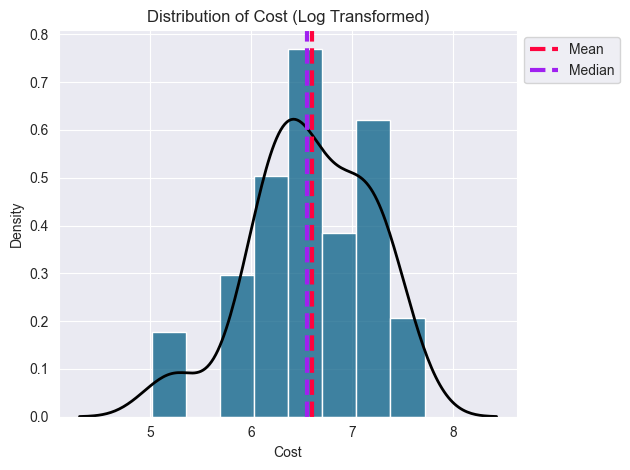

In [145]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import norm

# Apply log transformation to 'Cost' to reduce skewness
cluster_df['Cost'] = np.log1p(cluster_df['Cost'])
cluster_dummy['Cost'] = np.log1p(cluster_dummy['Cost'])

# Plot the distribution of the transformed 'Cost' feature
col = 'Cost'
sns.histplot(cluster_df[col], kde=False, color='#055E85', stat="density")
sns.kdeplot(cluster_df[col], color='black', lw=2)

# Add mean and median lines
feature = cluster_df[col]
plt.axvline(feature.mean(), color='#ff033e', linestyle='dashed', linewidth=3, label='Mean')
plt.axvline(feature.median(), color='#A020F0', linestyle='dashed', linewidth=3, label='Median')

plt.legend(bbox_to_anchor=(1.0, 1), loc='upper left')
plt.title(f'Distribution of {col.title()} (Log Transformed)')
plt.tight_layout()
plt.show()


Capping outliers is a common technique to limit extreme values but it can distort summary statistics like mean and median, potentially affecting model performance. To better approximate a normal distribution without heavily affecting central tendency measures, I have applied **log transformation** to skewed features, especially the positive-skewed ones like `Cost`.

The **log transformation** (using `np.log1p` for numerical stability and handling zeros) compresses high values while expanding the range of smaller values, effectively reducing right skewness.

Furthermore, Gaussian transformation techniques—such as log, square root, or Box-Cox transformations—are used to transform non-normal data distributions towards a **normal (Gaussian) distribution**. Normality is desirable because many machine learning algorithms assume or perform better with normally distributed features.

This transformation improves the stability, interpretability, and predictive performance of the modeling process.


In [146]:
from sklearn.preprocessing import StandardScaler

# Columns to be normalized
numerical_cols = ['Cost', 'Total_Cuisine_Count', 'Average_Rating']

# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler on the numerical columns
scaler.fit(cluster_dummy[numerical_cols])

# Create a copy of the dataframe to preserve the original
scaled_df = cluster_dummy.copy()

# Transform and replace the numerical columns with their scaled versions
scaled_df[numerical_cols] = scaler.transform(cluster_dummy[numerical_cols])

# Display 5 random samples of the scaled dataframe
print(scaled_df.sample(5))


                                           Restaurant  Cost  Average_Rating  \
6                                             eat.fit -0.65           -0.80   
13                      The Lal Street - Bar Exchange  0.96           -0.30   
11                                    Barbeque Nation  1.31            1.02   
76                      The Old Madras Baking Company -1.25            0.03   
21  Jonathan's Kitchen - Holiday Inn Express & Suites  1.60           -0.13   

    Total_Cuisine_Count  American  Andhra  Arabian  Asian  BBQ  Bakery  ...  \
6                  0.82         0       0        0      0    0       0  ...   
13                -0.01         0       0        0      0    0       0  ...   
11                 0.82         0       0        0      0    1       0  ...   
76                -1.67         0       0        0      0    0       1  ...   
21                 1.65         0       0        0      0    0       0  ...   

    North Indian  Pizza  Salad  Seafood  South Ind

In [147]:
from sklearn.decomposition import PCA

# Set 'Restaurant' as the index, removing it from features
scaled_df.set_index('Restaurant', inplace=True)

# Define features for PCA (all columns except index)
features = scaled_df.columns

# Create PCA instance without specifying number of components
pca = PCA()

# Fit PCA on all features
pca.fit(scaled_df[features])

# You can check explained variance ratio later to decide components to keep
print(pca.explained_variance_ratio_)


[3.41461194e-01 1.93679991e-01 9.19577445e-02 5.92830288e-02
 3.33885917e-02 3.19315706e-02 2.37112815e-02 2.17866281e-02
 1.83877831e-02 1.75378970e-02 1.60288358e-02 1.39447383e-02
 1.22754881e-02 1.08491587e-02 1.07700858e-02 9.40615549e-03
 8.59090431e-03 8.22610459e-03 7.74919871e-03 7.02002409e-03
 6.41021133e-03 6.01065492e-03 5.61830095e-03 5.18863374e-03
 4.39795131e-03 4.13294196e-03 3.66810390e-03 3.43595449e-03
 3.01570249e-03 2.73132461e-03 2.28205865e-03 1.86573578e-03
 1.75083418e-03 1.64222197e-03 1.55313844e-03 1.35171781e-03
 1.21560976e-03 1.15790583e-03 1.07259763e-03 9.81237996e-04
 8.86113251e-04 7.53391441e-04 6.86326058e-04 2.04927007e-04
 6.73413466e-32 1.88687484e-33 1.88687484e-33]


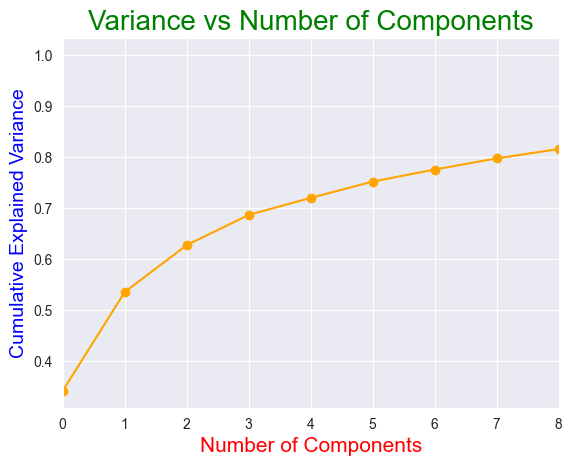

In [148]:
import matplotlib.pyplot as plt
import numpy as np

# Plot cumulative explained variance ratio by number of components
plt.plot(np.cumsum(pca.explained_variance_ratio_), marker='o', color='orange')
plt.xlabel('Number of Components', fontsize=15, color='red')
plt.ylabel('Cumulative Explained Variance', fontsize=14, color='blue')
plt.title('Variance vs Number of Components', fontsize=20, color='green')
plt.xlim([0, 8])  # Limit x-axis if you have 8 components
plt.grid(True)
plt.show()


In [149]:
from sklearn.decomposition import PCA
import numpy as np

# Initialize PCA with 3 components
pca = PCA(n_components=3)

# Fit PCA on scaled features
pca.fit(scaled_df[features])

# Print explained variance ratio per component
print('Explained variation per principal component:', pca.explained_variance_ratio_)

# Print cumulative variance explained by 3 components
cumulative_variance = np.sum(pca.explained_variance_ratio_)
print('Cumulative variance explained by 3 principal components: {:.2%}'.format(cumulative_variance))

# Transform original features into the PCA space
df_pca = pca.transform(scaled_df[features])

# df_pca now holds the data represented by 3 principal components, ready for further use


Explained variation per principal component: [0.34146119 0.19367999 0.09195774]
Cumulative variance explained by 3 principal components: 62.71%


In [150]:
# Print the shape of original and PCA-transformed datasets
print("Original shape: ", scaled_df.shape)
print("Transformed shape:", df_pca.shape)


Original shape:  (100, 47)
Transformed shape: (100, 3)


Dimensionality reduction is an essential technique when working with datasets that have a large number of features, as it helps reduce computational complexity and alleviates the challenges posed by the "curse of dimensionality." When the feature space is high-dimensional, data points tend to become sparse, making it difficult for clustering or other machine learning algorithms to identify meaningful patterns.

There are two primary approaches to dimensionality reduction:

1. **Feature Selection:** Selecting the most relevant subset of existing features by removing irrelevant or redundant data. Examples include correlation-based selection, mutual information, recursive feature elimination, and SelectKBest.

2. **Feature Extraction:** Creating new features by transforming or combining existing features into a more compact, informative representation. Examples include Principal Component Analysis (PCA), Linear Discriminant Analysis (LDA), Independent Component Analysis (ICA), Non-Negative Matrix Factorization (NMF), and Autoencoders.

**Is dimensionality reduction needed?**

Yes, it is typically necessary when the dataset contains many features (e.g., 40 or more). Reducing dimensions lowers computational costs, improves clustering performance, and makes data more interpretable by reducing noise and multicollinearity.

**Which dimensionality reduction technique have I used and why?**

I have used **Principal Component Analysis (PCA)** because it effectively identifies the directions (principal components) that capture the most variance in the data. PCA’s advantages include:

- Transforming correlated features into uncorrelated components.
- Maintaining most of the important data information while reducing dimensionality.
- Being a linear method, which suits data with linear relationships.
- Facilitating visualization by projecting data into 2D or 3D spaces.
- Simplifying clustering by reducing noise and redundancy before applying algorithms like k-means.

When PCA is applied **before k-means clustering**, it removes noise and correlations upfront, helping to produce more meaningful and interpretable clusters in the reduced feature space. However, interpreting clusters directly in the original feature space can be more challenging.

When PCA is applied **after k-means clustering**, it is used primarily for visualization purposes, projecting clusters defined in the original space into lower dimensions. This approach preserves interpretability regarding the original features but may not address noise or feature redundancy as effectively.

In summary, PCA balances dimensionality reduction with information retention and is well-suited as a preprocessing step for clustering algorithms, improving computational efficiency and cluster quality.



##### 8. Data Splitting

In [151]:
# Assuming X_tfidf contains your TF-IDF vectorized feature matrix
X = X_tfidf
y = sentiment_df['Sentiment']

# Check the shape of the sentiment_df DataFrame
print(sentiment_df.shape)


(9962, 6)


In [152]:
from sklearn.model_selection import train_test_split

# Split the dataset into training and testing sets with 80-20 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Print the shape of train and test datasets
print("Number of transactions in X_train dataset: ", X_train.shape)
print("Number of transactions in y_train dataset: ", y_train.shape)
print("Number of transactions in X_test dataset: ", X_test.shape)
print("Number of transactions in y_test dataset: ", y_test.shape)


Number of transactions in X_train dataset:  (7969, 17484)
Number of transactions in y_train dataset:  (7969,)
Number of transactions in X_test dataset:  (1993, 17484)
Number of transactions in y_test dataset:  (1993,)


I have used an 80:20 data splitting ratio, which is one of the most commonly used proportions for train-test splits. This means 80% of the data is used for training the model, and 20% is reserved for testing its performance.

Since the dataset contains only 9,961 samples, allocating more data to the training set helps the model learn better by exposing it to a larger variety of instances. Meanwhile, the 20% test set is sufficient to provide an unbiased evaluation of model generalization on unseen data. This balance ensures the model is well-trained while still allowing reliable performance assessment.


To determine if a dataset is imbalanced, it is important to analyze the distribution of the target classes.

Using the **Class Imbalance Ratio (CIR)**, which is defined as:

CIR = N_m/N_s


where \(N_m\) is the number of observations in the majority class and \(N_s\) is the number of observations in the minority class, we can quantify the degree of imbalance.

- If CIR is close to 1, the dataset is balanced, meaning both classes have roughly equal observations.
- If CIR is much greater than 1, it indicates imbalance, where the majority class significantly outnumbers the minority class.

Knowing CIR helps in deciding whether special techniques like oversampling, undersampling, or algorithmic adjustments (e.g., class weighting) are needed to address the imbalance, which is critical for building effective and fair machine learning models.


In [157]:
# Get value counts for each class as a dictionary
class_counts = sentiment_df['Sentiment'].value_counts().to_dict()

# Extract counts safely
majority_class = max(class_counts.values())
minority_class = min(class_counts.values())

# Calculate CIR
CIR = majority_class / minority_class

print("Class Imbalance Ratio (CIR):", CIR)


Class Imbalance Ratio (CIR): 1.7019256848386222


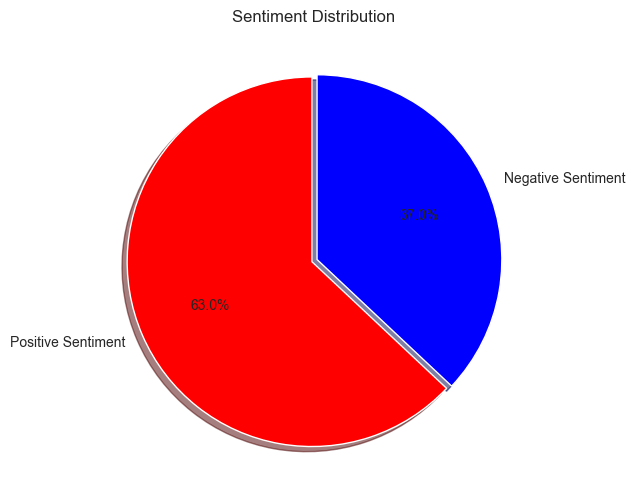

In [158]:
import matplotlib.pyplot as plt

# Plot pie chart for Sentiment value counts
sentiment_df['Sentiment'].value_counts().plot(
    kind='pie',
    figsize=(15, 6),
    autopct="%1.1f%%",
    startangle=90,
    shadow=True,
    labels=['Positive Sentiment', 'Negative Sentiment'],
    colors=['red', 'blue'],
    explode=[0.01, 0.02]
)

plt.title('Sentiment Distribution')
plt.ylabel('')  # Hide the y-label for cleaner look
plt.show()


#### Handling Imbalanced Dataset

Yes, the dataset shows imbalance with a 60:40 ratio—60% belonging to the majority class and 40% to the minority class. The Class Imbalance Ratio (CIR) is approximately 1.73, indicating the majority class is 1.73 times larger than the minority class. However, this level of imbalance is considered slight and does not necessitate specific balancing techniques like oversampling or undersampling. Therefore, no explicit treatment for class imbalance was applied.

---

### ML Model Implementation

#### ML Model - 1: Clustering Using K-Means

**K-Means Clustering** is an unsupervised learning algorithm that partitions an unlabeled dataset into \(k\) clusters. It iteratively assigns data points to clusters and updates cluster centroids until it converges to the best cluster structure. The number of clusters \(k\) must be predefined.

**How K-Means Works:**

- **Centroid-based**: Each cluster has a centroid representing its center.
- **Objective**: Minimize the sum of squared distances (distortion) between data points and their respective centroids.

Steps:

1. Determine \(k\) centroids.
2. Assign each data point to the nearest centroid forming clusters.
3. Update centroids as the mean of assigned points.
4. Repeat until centroids stabilize.

---

#### Methods for Choosing \(k\):

- **Elbow Method**: Uses Within Cluster Sum of Squares (WCSS) to measure cluster compactness. The ideal \(k\) is where the WCSS plot bends (“elbow”), indicating diminishing returns from adding more clusters.

- **Silhouette Method**: Measures how similar each data point is to its own cluster compared to other clusters. The silhouette score ranges from -1 to 1, with higher scores indicating well-separated and cohesive clusters.

Both methods are valuable for deciding the optimal number of clusters for


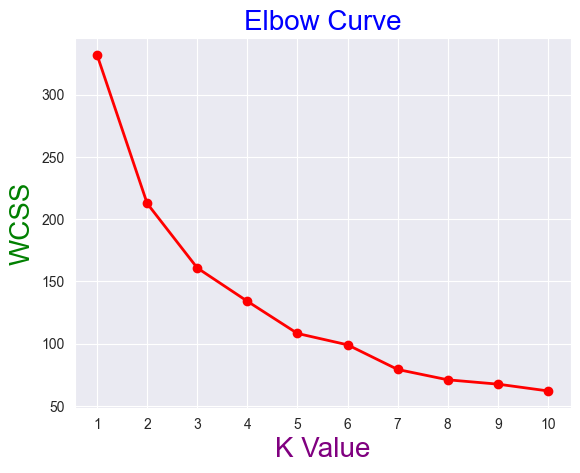

In [159]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import numpy as np

# List to hold Within Cluster Sum of Squared Errors (WCSS) for each k
wcss = []

# Calculate WCSS for k ranging 1 to 10
for i in range(1, 11):
    km = KMeans(n_clusters=i, random_state=20)
    km.fit(df_pca)  # Fit on PCA-transformed data
    wcss.append(km.inertia_)  # inertia_ is WCSS

# Plot the elbow curve
plt.plot(range(1, 11), wcss, marker='o', color='red', linewidth=2)
plt.xlabel("K Value", fontsize=20, color='purple')
plt.xticks(np.arange(1, 11, 1))
plt.ylabel("WCSS", fontsize=20, color='green')
plt.title('Elbow Curve', fontsize=20, color='blue')
plt.show()


For n_clusters = 2, average silhouette_score is : 0.3135


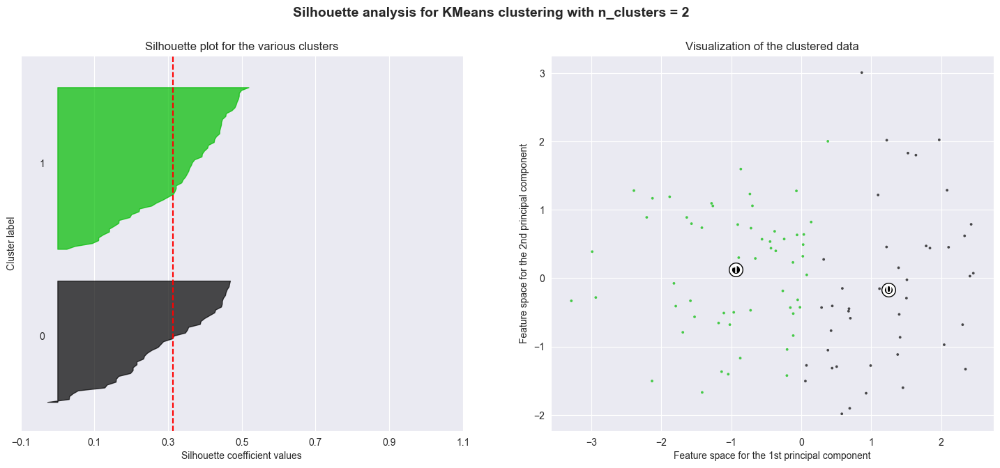

For n_clusters = 3, average silhouette_score is : 0.2728


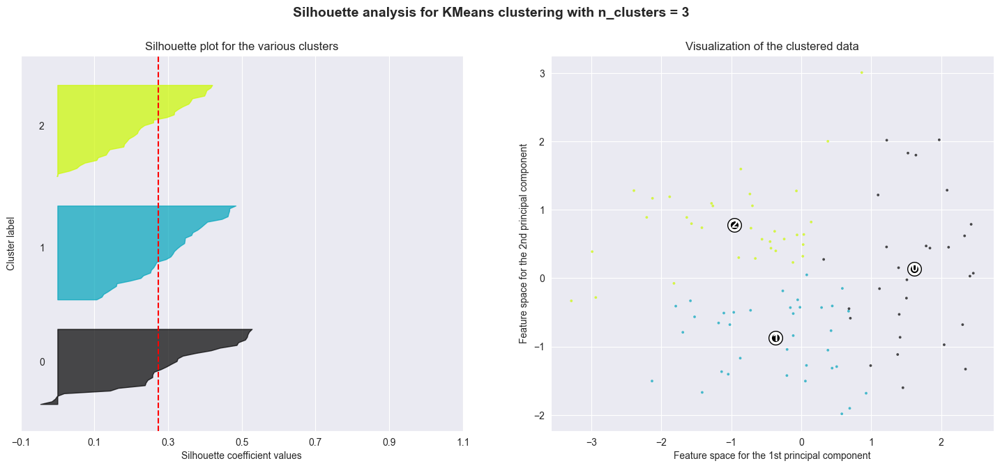

For n_clusters = 4, average silhouette_score is : 0.2543


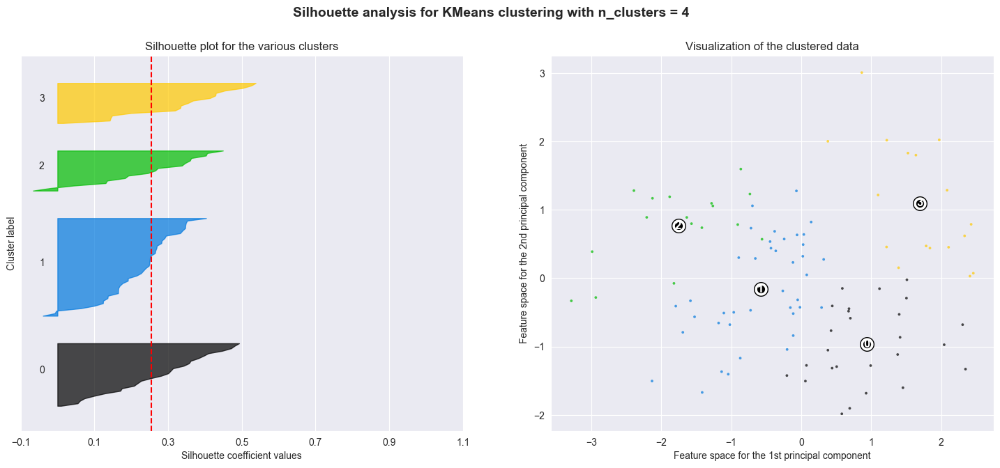

For n_clusters = 5, average silhouette_score is : 0.2588


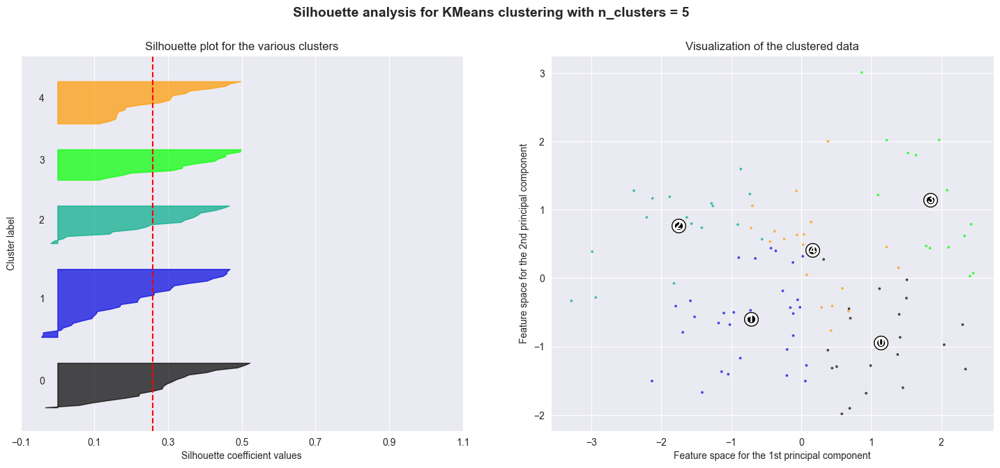

For n_clusters = 6, average silhouette_score is : 0.3133


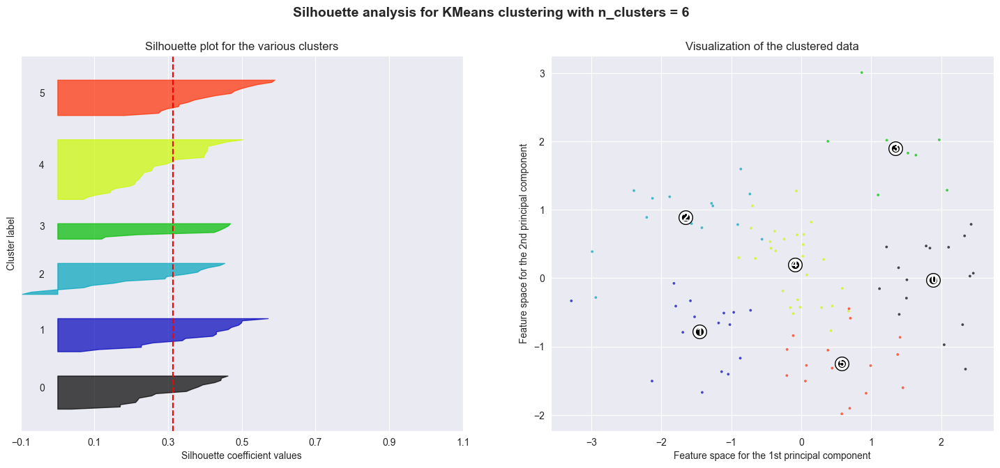

For n_clusters = 7, average silhouette_score is : 0.2903


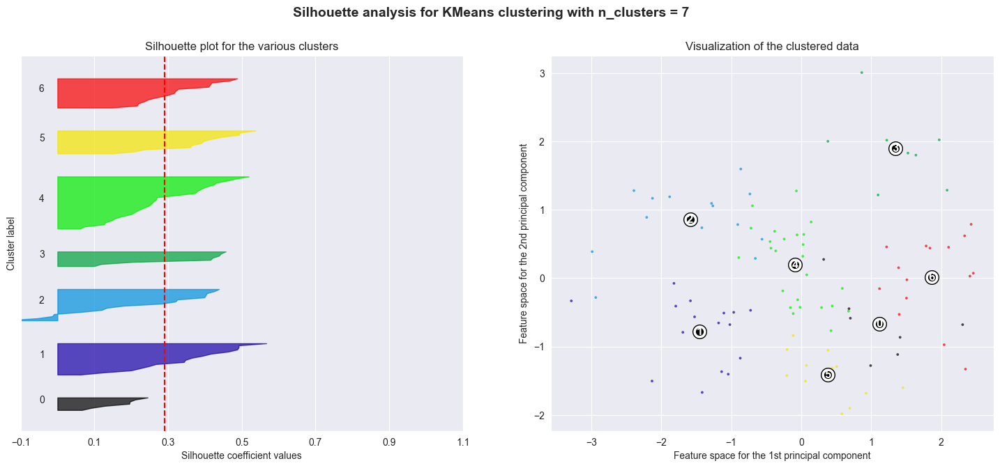

For n_clusters = 8, average silhouette_score is : 0.3117


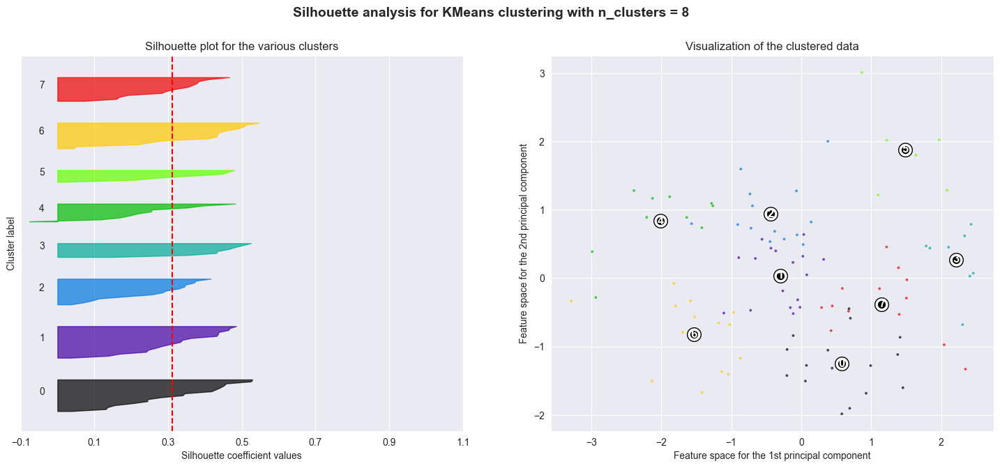

For n_clusters = 9, average silhouette_score is : 0.3014


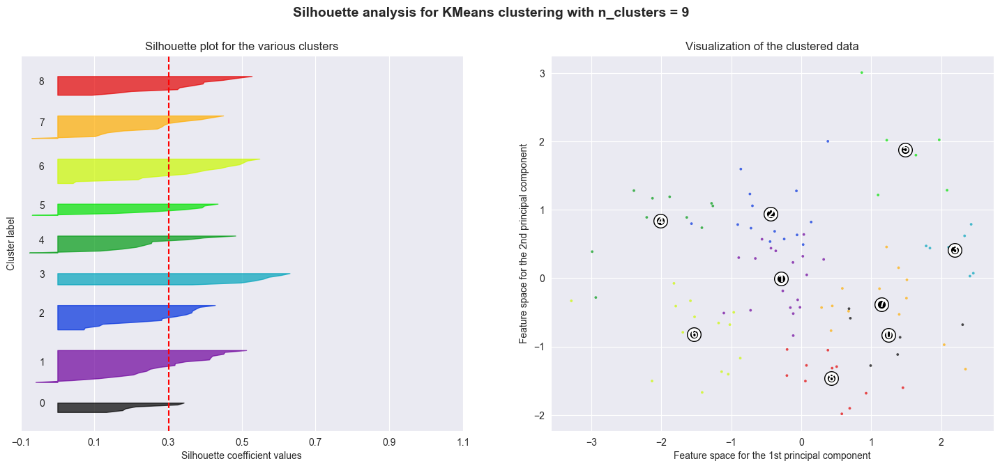

In [166]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples

# Range of clusters to evaluate
parameters = list(range(2, 10))

for n_clusters in parameters:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

    # Silhouette plot preparation
    ax1.set_xlim([-0.1, 1])
    ax1.set_ylim([0, len(df_pca) + (n_clusters + 1) * 10])

    # KMeans clustering
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(df_pca)

    # Calculate average silhouette score
    silhouette_avg = silhouette_score(df_pca, cluster_labels)
    print(f"For n_clusters = {n_clusters}, average silhouette_score is : {silhouette_avg:.4f}")

    # Silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(df_pca, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label clusters on silhouette plot
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        y_lower = y_upper + 10  # Spacer between clusters

    ax1.set_title("Silhouette plot for the various clusters")
    ax1.set_xlabel("Silhouette coefficient values")
    ax1.set_ylabel("Cluster label")
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax1.set_yticks([])
    ax1.set_xticks(np.arange(-0.1, 1.1, 0.2))

    # Scatter plot of clustered data
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(df_pca[:, 0], df_pca[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Plot cluster centers as white circles
    centers = clusterer.cluster_centers_
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o', c='white', alpha=1, s=200, edgecolor='k')

    # Overlay smaller black circles with numeric cluster labels centered on each cluster center
    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='o', c='black', s=50, edgecolor='k', alpha=1)
        ax2.text(c[0], c[1], str(i), color='white', fontsize=12, fontweight='bold', ha='center', va='center')

    ax2.set_title("Visualization of the clustered data")
    ax2.set_xlabel("Feature space for the 1st principal component")
    ax2.set_ylabel("Feature space for the 2nd principal component")

    plt.suptitle(f"Silhouette analysis for KMeans clustering with n_clusters = {n_clusters}",
                 fontsize=14, fontweight='bold')

    plt.show()


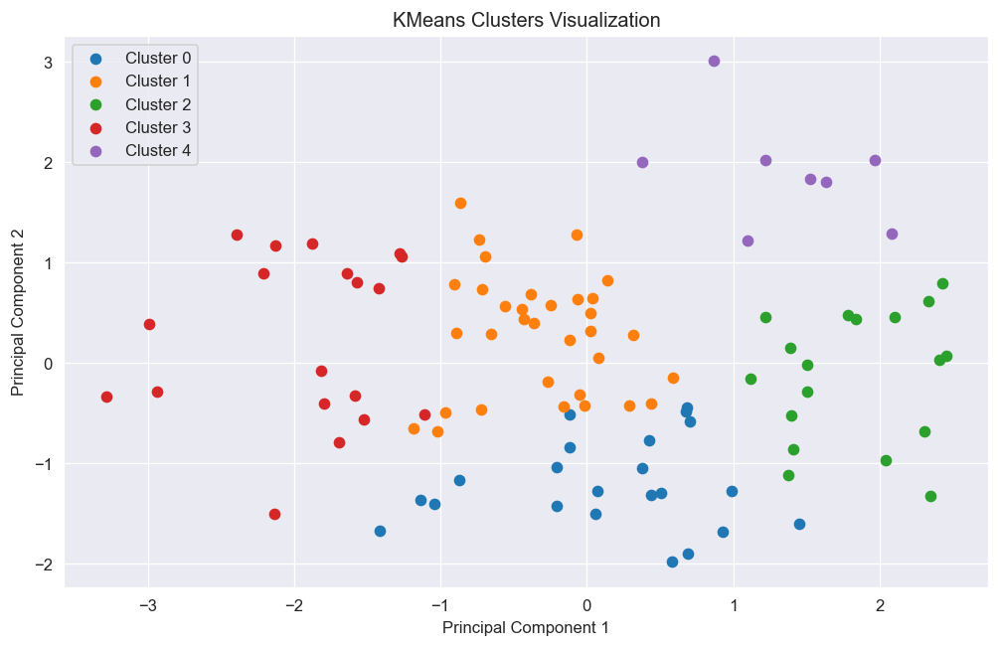

In [167]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import KMeans

plt.figure(figsize=(10, 6), dpi=120)

# Initialize and fit KMeans with 5 clusters
kmeans = KMeans(n_clusters=5, init='k-means++', random_state=42)
label = kmeans.fit_predict(df_pca)

# Get unique cluster labels
unique_labels = np.unique(label)

# Plot each cluster's data points
for i in unique_labels:
    plt.scatter(df_pca[label == i, 0], df_pca[label == i, 1], label=f'Cluster {i}')

plt.title('KMeans Clusters Visualization')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()

In [168]:
import pandas as pd

# Create a DataFrame from the PCA components with original indices
kmeans_pca_df = pd.DataFrame(df_pca, columns=['PC1', 'PC2', 'PC3'], index=scaled_df.index)

# Add the cluster labels as a new column
kmeans_pca_df['label'] = label

# Display 2 random samples from the DataFrame
print(kmeans_pca_df.sample(2))


             PC1   PC2   PC3  label
Restaurant                         
T Grill     0.06 -1.51 -0.13      0
Pot Pourri -0.02 -0.43  0.46      1


In [169]:
# Set 'Restaurant' as index for cluster_dummy
cluster_dummy.set_index('Restaurant', inplace=True)

# Join cluster labels from kmeans_pca_df
cluster_dummy = cluster_dummy.join(kmeans_pca_df['label'])

# Display 2 random samples from the joined DataFrame
print(cluster_dummy.sample(2))


                       Cost  Average_Rating  Total_Cuisine_Count  American  \
Restaurant                                                                   
The Fisherman's Wharf  7.31            4.22                    5         0   
Beyond Flavours        6.69            4.28                    6         0   

                       Andhra  Arabian  Asian  BBQ  Bakery  Beverages  ...  \
Restaurant                                                             ...   
The Fisherman's Wharf       0        0      1    0       0          0  ...   
Beyond Flavours             0        0      0    0       0          0  ...   

                       Pizza  Salad  Seafood  South Indian  Spanish  \
Restaurant                                                            
The Fisherman's Wharf      0      0        1             0        0   
Beyond Flavours            0      0        0             1        0   

                       Street Food  Sushi  Thai  Wraps  label  
Restaurant               

In [170]:
import numpy as np

# Revert log1p transformation on 'Cost' column to get original values
cluster_dummy['Cost'] = np.expm1(cluster_dummy['Cost'])

# Display 2 random samples to verify the transformation
print(cluster_dummy.sample(2))


                                                     Cost  Average_Rating  \
Restaurant                                                                  
Desi Bytes                                         400.00            2.90   
Jonathan's Kitchen - Holiday Inn Express & Suites 1900.00            3.54   

                                                   Total_Cuisine_Count  \
Restaurant                                                               
Desi Bytes                                                           2   
Jonathan's Kitchen - Holiday Inn Express & Suites                    5   

                                                   American  Andhra  Arabian  \
Restaurant                                                                     
Desi Bytes                                                0       0        0   
Jonathan's Kitchen - Holiday Inn Express & Suites         0       0        0   

                                                   Asian  BBQ  Bakery  \


In [171]:
# Create a copy of cluster_dummy and reset index to bring 'Restaurant' back as a column
clustering_result = cluster_dummy.copy().reset_index()

# Merge with hotel DataFrame to include 'Cuisines' along with selected columns and cluster label
clustering_result = hotel[['Restaurant', 'Cuisines']].merge(
    clustering_result[['Restaurant', 'Cost', 'Average_Rating', 'Total_Cuisine_Count', 'label']],
    on='Restaurant'
)

# Display the first few rows of the merged result
print(clustering_result.head())


                       Restaurant  \
0                 Beyond Flavours   
1                        Paradise   
2                        Flechazo   
3  Shah Ghouse Hotel & Restaurant   
4      Over The Moon Brew Company   

                                            Cuisines    Cost  Average_Rating  \
0  Chinese, Continental, Kebab, European, South I...  800.00            4.28   
1                     Biryani, North Indian, Chinese  800.00            4.70   
2       Asian, Mediterranean, North Indian, Desserts 1300.00            4.66   
3  Biryani, North Indian, Chinese, Seafood, Bever...  800.00            3.21   
4  Asian, Continental, North Indian, Chinese, Med... 1200.00            4.34   

   Total_Cuisine_Count  label  
0                    6      2  
1                    3      4  
2                    4      4  
3                    5      0  
4                    5      2  


In [172]:
# Count the number of restaurants per cluster label
cluster_count = cluster_dummy['label'].value_counts().reset_index().rename(
    columns={'index': 'label', 'label': 'Total_Restaurant'}
).sort_values(by='Total_Restaurant')

# Display the cluster counts sorted by the number of restaurants
print(cluster_count)


   Total_Restaurant  count
1                 0     22
0                 1     33
3                 2     18
2                 3     19
4                 4      8


In [173]:
# Create a copy of clustering_result for cuisine analysis
new_cluster_df = clustering_result.copy()

# Split comma-separated 'Cuisines' strings into lists
new_cluster_df['Cuisines'] = new_cluster_df['Cuisines'].str.split(',')

# Explode the lists to create one row per cuisine
new_cluster_df = new_cluster_df.explode('Cuisines')

# Remove extra trailing spaces from cuisine names
new_cluster_df['Cuisines'] = new_cluster_df['Cuisines'].apply(lambda x: x.strip())

# Display 5 random samples
print(new_cluster_df.sample(5))


                                           Restaurant      Cuisines    Cost  \
19                                      Pakwaan Grand       Chinese  400.00   
84                                            T Grill  North Indian  700.00   
57                                       Being Hungry  North Indian  450.00   
21  Jonathan's Kitchen - Holiday Inn Express & Suites       Italian 1900.00   
82                                 Al Saba Restaurant       Seafood  750.00   

    Average_Rating  Total_Cuisine_Count  label  
19            2.71                    3      0  
84            3.17                    4      0  
57            3.66                    2      1  
21            3.54                    5      2  
82            3.15                    5      0  


In [174]:
# Print unique cuisines for each cluster
for cluster in new_cluster_df['label'].unique().tolist():
    print(f'Cuisine List for Cluster: {cluster}\n')
    cuisines = new_cluster_df[new_cluster_df['label'] == cluster]['Cuisines'].unique()
    print(cuisines, '\n')
    print('=' * 120)


Cuisine List for Cluster: 2

['Chinese' 'Continental' 'Kebab' 'European' 'South Indian' 'North Indian'
 'Asian' 'Mediterranean' 'Seafood' 'Goan' 'American' 'BBQ' 'Japanese'
 'Italian' 'Salad' 'Sushi' 'Spanish' 'Modern Indian' 'Thai' 'Momos'] 

Cuisine List for Cluster: 4

['Biryani' 'North Indian' 'Chinese' 'Asian' 'Mediterranean' 'Desserts'
 'European' 'American' 'BBQ' 'Modern Indian' 'Continental' 'Sushi'] 

Cuisine List for Cluster: 0

['Biryani' 'North Indian' 'Chinese' 'Seafood' 'Beverages' 'Healthy Food'
 'Continental' 'South Indian' 'Mexican' 'Italian' 'Salad' 'Bakery'
 'Mughlai' 'Juices' 'Andhra' 'Hyderabadi' 'Finger Food' 'Kebab' 'Thai'
 'Indonesian' 'Asian' 'Fast Food' 'Desserts' 'Cafe' 'Burger'] 

Cuisine List for Cluster: 3

['Lebanese' 'Ice Cream' 'Desserts' 'Street Food' 'North Indian'
 'Fast Food' 'Burger' 'Chinese' 'Mughlai' 'Biryani' 'Asian' 'Beverages'
 'Bakery' 'Momos' 'Cafe' 'Pizza' 'Arabian'] 

Cuisine List for Cluster: 1

['Continental' 'American' 'Chinese' 'North

### Agglomerative Hierarchical Clustering

Hierarchical clustering algorithms group similar objects into clusters based on their similarity. There are two main types:

- **Agglomerative (Bottom-Up) Approach:**
  Starts with each data point as its own cluster, then repeatedly merges the closest pairs of clusters to form larger clusters until all points belong to a single cluster.

- **Divisive (Top-Down) Approach:**
  Starts with one single cluster containing all data points and recursively splits it into smaller clusters.

#### Agglomerative Hierarchical Clustering Algorithm

This popular hierarchical clustering method follows the bottom-up approach. The process begins by treating each dataset point as a single cluster. Then, the algorithm merges the two closest clusters step-by-step until one cluster containing all points is formed. This clustering history is stored as a hierarchy.

#### Dendrogram in Hierarchical Clustering

The hierarchy of cluster mergers is visualized using a dendrogram, a tree-like diagram:

- **Y-axis:** Represents the Euclidean distance or dissimilarity between merged clusters at each step.
- **X-axis:** Represents the individual data points or clusters.

The dendrogram provides insight into the clustering structure and helps choose the number of clusters by cutting the tree at desired distances.


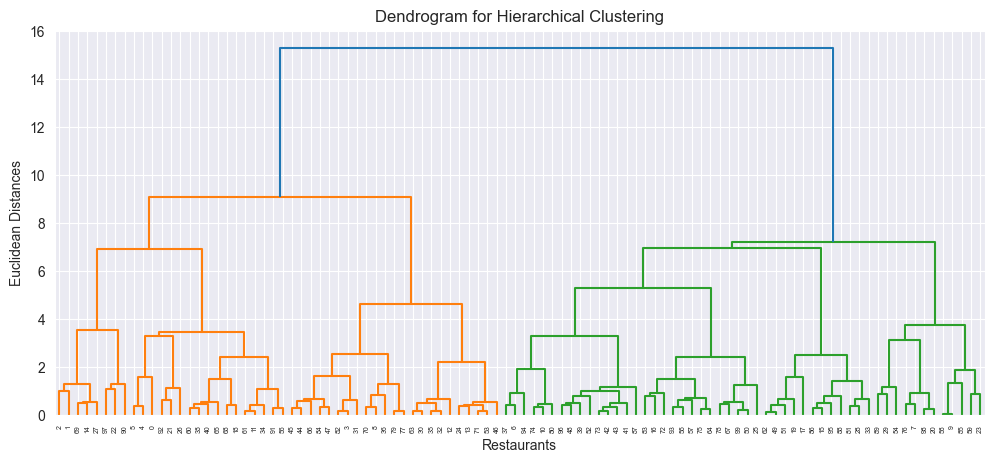

In [175]:
import matplotlib.pyplot as plt
import scipy.cluster.hierarchy as sch

plt.figure(figsize=(12, 5))

# Compute and plot the dendrogram using Ward's linkage method
dendrogram = sch.dendrogram(
    sch.linkage(df_pca, method='ward'),
    orientation='top',
    distance_sort='descending',
    show_leaf_counts=True
)

plt.title('Dendrogram for Hierarchical Clustering')
plt.xlabel('Restaurants')
plt.ylabel('Euclidean Distances')
plt.show()


In [176]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score

range_n_clusters = list(range(2, 16))
for n_clusters in range_n_clusters:
    hc = AgglomerativeClustering(n_clusters=n_clusters, metric='euclidean', linkage='ward')
    y_hc = hc.fit_predict(df_pca)
    score = silhouette_score(df_pca, y_hc)
    print(f"For n_clusters = {n_clusters}, silhouette score is {score:.4f}")


For n_clusters = 2, silhouette score is 0.2957
For n_clusters = 3, silhouette score is 0.2253
For n_clusters = 4, silhouette score is 0.2087
For n_clusters = 5, silhouette score is 0.2466
For n_clusters = 6, silhouette score is 0.2712
For n_clusters = 7, silhouette score is 0.2686
For n_clusters = 8, silhouette score is 0.2815
For n_clusters = 9, silhouette score is 0.2880
For n_clusters = 10, silhouette score is 0.2885
For n_clusters = 11, silhouette score is 0.2995
For n_clusters = 12, silhouette score is 0.3142
For n_clusters = 13, silhouette score is 0.3158
For n_clusters = 14, silhouette score is 0.3273
For n_clusters = 15, silhouette score is 0.3365


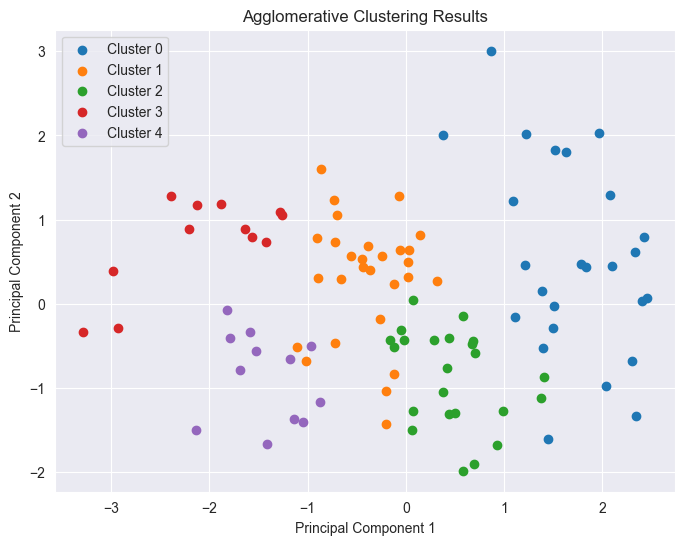

Silhouette Coefficient: 0.247
Davies-Bouldin Score: 1.151


In [177]:
import matplotlib.pyplot as plt
from numpy import unique, where
from sklearn.cluster import AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score

# Define and fit the Agglomerative Clustering model with 5 clusters
model = AgglomerativeClustering(n_clusters=5)
y_hc = model.fit_predict(df_pca)

# Retrieve unique cluster labels
clusters = unique(y_hc)

# Plot samples colored by cluster for first two PCA components
plt.figure(figsize=(8, 6))
for cluster in clusters:
    row_ix = where(y_hc == cluster)
    plt.scatter(df_pca[row_ix, 0], df_pca[row_ix, 1], label=f'Cluster {cluster}')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Agglomerative Clustering Results')
plt.legend()
plt.show()

# Evaluate clustering
sil_score = silhouette_score(df_pca, y_hc, metric='euclidean')
db_score = davies_bouldin_score(df_pca, y_hc)

print(f"Silhouette Coefficient: {sil_score:.3f}")
print(f"Davies-Bouldin Score: {db_score:.3f}")


In [178]:
# Add hierarchical clustering labels to the clustering_result DataFrame
clustering_result['label_hr'] = y_hc

# Display 5 random samples to verify
print(clustering_result.sample(5))


                               Restaurant  \
9                             Cream Stone   
29                     Hunger Maggi Point   
18                      10 Downing Street   
34  Mazzo - Marriott Executive Apartments   
73                            Driven Cafe   

                                      Cuisines    Cost  Average_Rating  \
9                          Ice Cream, Desserts  350.00            3.85   
29                                   Fast Food  200.00            3.12   
18          North Indian, Chinese, Continental 1900.00            3.80   
34  Italian, North Indian, South Indian, Asian 1700.00            4.19   
73                  Cafe, Fast Food, Beverages  600.00            3.75   

    Total_Cuisine_Count  label  label_hr  
9                     2      3         3  
29                    1      3         3  
18                    3      2         0  
34                    4      2         0  
73                    3      1         1  


#### Explanation of ML Models and Their Performance Evaluation

##### KMeans Clustering

KMeans is a **centroid-based** clustering algorithm where each cluster is represented by the mean of the data points assigned to it. It partitions the dataset into \(k\) distinct, non-overlapping clusters by iteratively minimizing within-cluster variance.

- **Determining the Number of Clusters (\(k\))**:
  The Elbow method and Silhouette score were used to find an optimal cluster number for the restaurant dataset. Both methods indicated that **6 clusters** was the best choice for the model.

- **Model Fitting and Labeling**:
  The model was fitted on the feature set, and each restaurant was assigned a cluster label based on proximity to cluster centroids.

- **Analysis**:
  Visualization of clusters and the count of restaurants per cluster revealed that the majority of restaurants belonged to the first cluster, indicating natural groupings and cluster size variations.

##### Agglomerative Hierarchical Clustering

Agglomerative Hierarchical Clustering uses a **bottom-up approach** (also called linkage-based clustering). It treats each data point as its own cluster initially and merges the closest clusters step-by-step until all points form a single cluster or until a predefined number of clusters is reached.

- **Cluster Number Selection**:
  The Silhouette Coefficient score was employed to evaluate cluster quality across different cluster counts. Based on this, 6 clusters were chosen.

- **Model Application and Visualization**:
  The agglomerative model was applied to cluster the restaurants, and the clusters, along with their contained data points, were visualized for interpretability.

---

#### Performance Evaluation Using Metrics

- **Silhouette Score**:
  Measures how similar an object is to its own cluster compared to other clusters. Values range from \(-1\) to \(1\), where a higher score indicates well-separated and cohesive clusters.

- **Cluster Size Distribution**:
  Counting the number of data points in each cluster helps understand the balance and dominance of clusters.

Both models were evaluated using the Silhouette score and cluster size analysis, confirming 6 as an efficient cluster number. Visualizations provided insights into cluster shapes and restaurant grouping diversity.

Because KMeans and Agglomerative clustering rely on different principles—centroid proximity versus cluster linkage—the resulting cluster labels differ, although both identify meaningful groupings in the restaurant data.


### ML Model - 2: Sentiment Analysis Using LDA (Latent Dirichlet Allocation)

**Unsupervised Sentiment Analysis** with LDA involves discovering latent topics in text data to understand underlying sentiment themes without labeled data.

#### What is LDA?

Latent Dirichlet Allocation (LDA) is a popular **topic modeling** technique that:
- Models each document as a mixture of various topics.
- Models each topic as a mixture of words.
- Helps to uncover hidden thematic structures in collections of text.

#### Workflow for LDA-based Sentiment Analysis:

1. **Data Preprocessing:**
   - Tokenization
   - Stopword removal
   - Lemmatization/stemming

2. **Create Dictionary and Corpus:**
   Preparing the text data to feed into the LDA model.

3. **Applying LDA:**
   Extract dominant topics from documents or reviews.

4. **Sentiment Characterization:**
   Optionally combine LDA with sentiment scoring methods (e.g., VADER) to assign sentiment labels to topics or documents.

#### Evaluation:

- **Topic Coherence:** Measures interpretability and semantic consistency of topics.
- **Sentiment Accuracy:** When ground truth exists, classification metrics like accuracy or F1-score can evaluate sentiment labeling.

#### Example Use Cases:

- Analyzing product reviews to extract prominent aspects and their sentiment.
- Understanding social media conversations clustered by topics and related emotions.

LDA offers a powerful unsupervised approach to sentiment analysis by revealing meaningful topics and their related sentiments, aiding insightful textual data analysis without requiring labeled datasets.


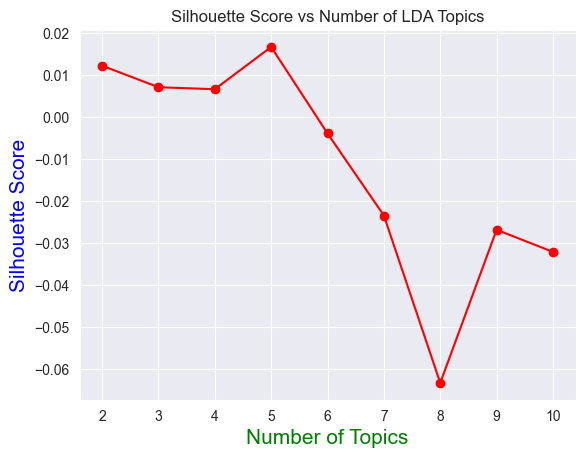

In [179]:
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

topic_range = range(2, 11)
silhouette_scores = []

for n_components in topic_range:
    lda = LatentDirichletAllocation(n_components=n_components, random_state=42)
    lda.fit(X)  # X is your document-term matrix or feature matrix
    labels = lda.transform(X).argmax(axis=1)  # Assign each document to the topic with highest probability
    score = silhouette_score(X, labels)
    silhouette_scores.append(score)

# Plot silhouette scores vs number of topics
plt.plot(topic_range, silhouette_scores, marker='o', color='red')
plt.xlabel('Number of Topics', fontsize=15, color='green')
plt.ylabel('Silhouette Score', fontsize=15, color='blue')
plt.title('Silhouette Score vs Number of LDA Topics')
plt.show()


TOP 100 WORDS FOR TOPIC #0


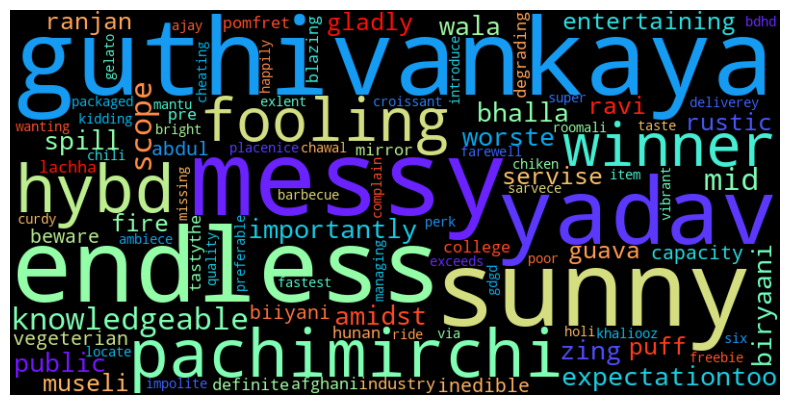

TOP 100 WORDS FOR TOPIC #1


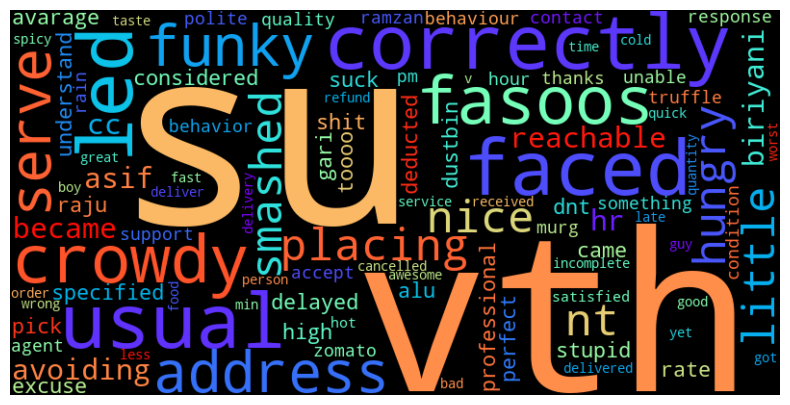

TOP 100 WORDS FOR TOPIC #2


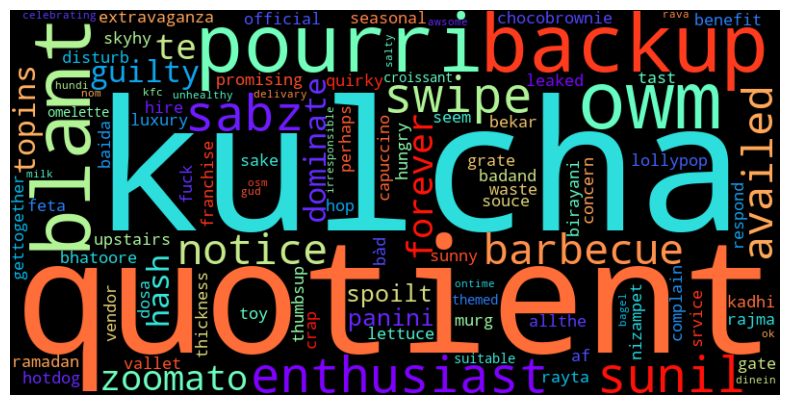

TOP 100 WORDS FOR TOPIC #3


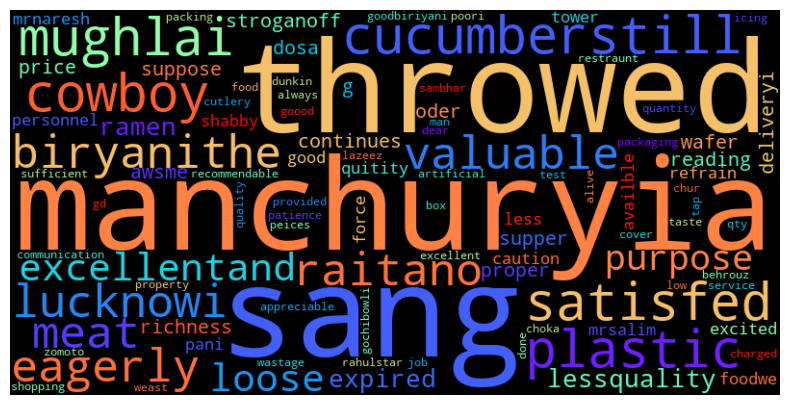

TOP 100 WORDS FOR TOPIC #4


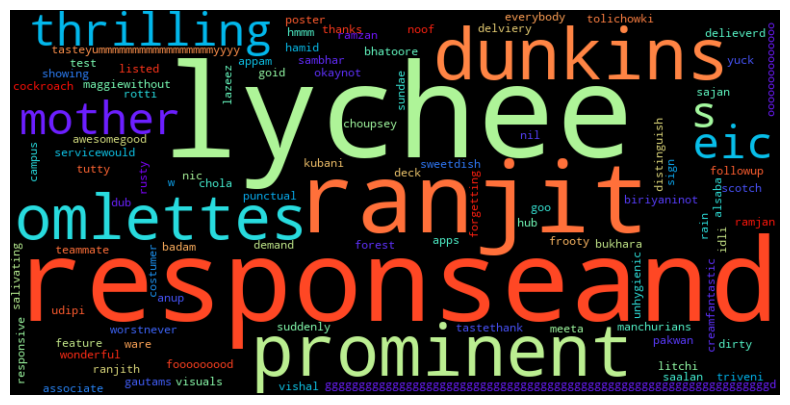

TOP 100 WORDS FOR TOPIC #5


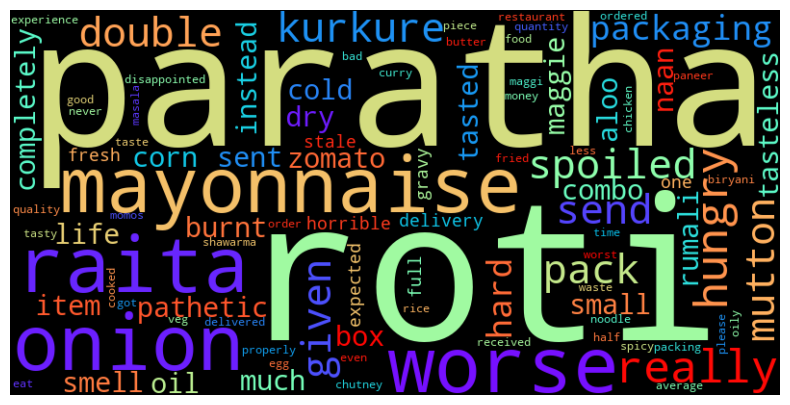

TOP 100 WORDS FOR TOPIC #6


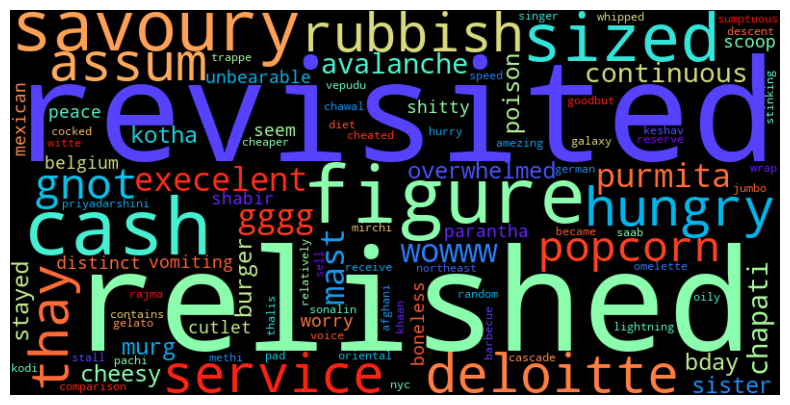

TOP 100 WORDS FOR TOPIC #7


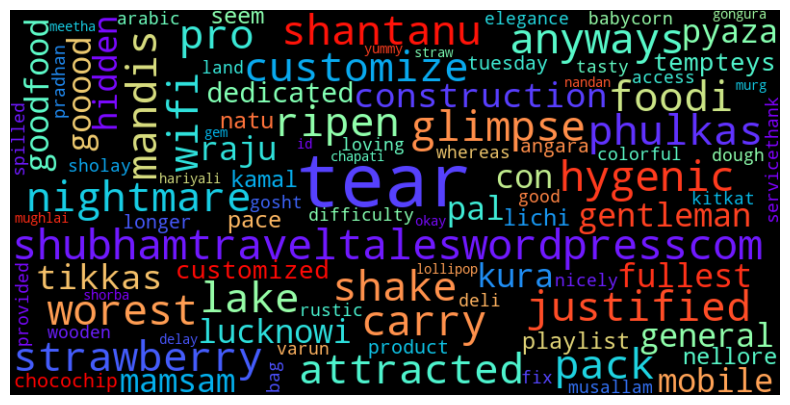

TOP 100 WORDS FOR TOPIC #8


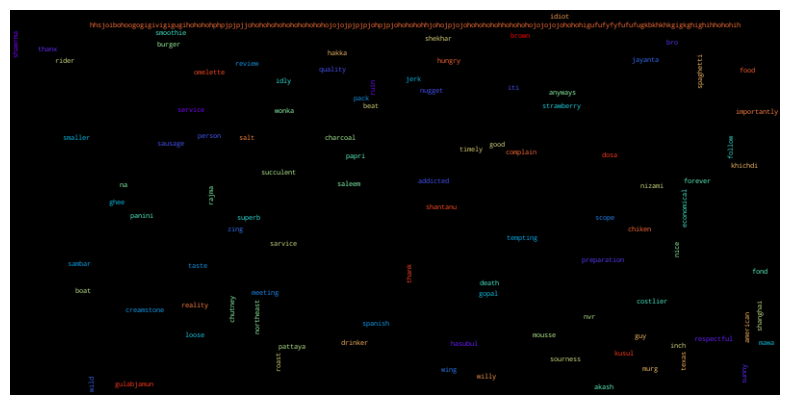

TOP 100 WORDS FOR TOPIC #9


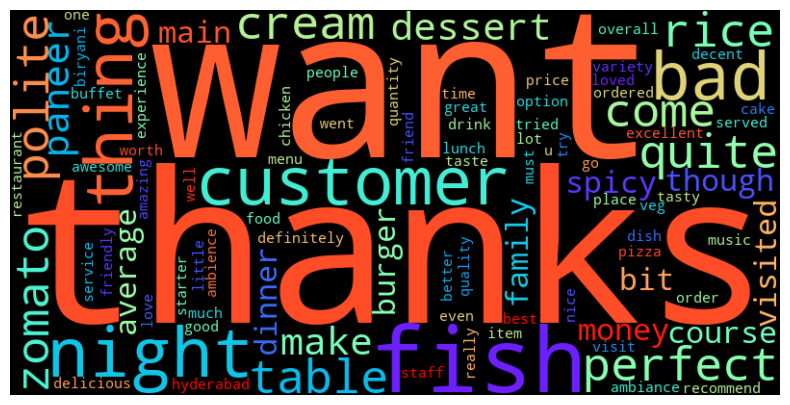

In [181]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

# Number of top words to include in each word cloud
N = 100

# Extract top words for each topic
topic_text = []
for index, topic in enumerate(lda.components_):  # lda.components_ shape: (n_topics, n_features)
    top_word_indices = topic.argsort()[-N:]  # indices of top N words for this topic
    topic_words = [vectorizer.get_feature_names_out()[i] for i in top_word_indices]
    topic_text.append(" ".join(topic_words))

# Generate and display word cloud for each topic
for i, text in enumerate(topic_text):
    print(f'TOP 100 WORDS FOR TOPIC #{i}')
    wordcloud = WordCloud(background_color="black", colormap='rainbow', width=800, height=400).generate(text)
    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()
    print('=' * 120)


##### Supervised Sentiment Analysis

In [192]:
import numpy as np
import matplotlib.pyplot as plt
import itertools
from sklearn.metrics import (
    roc_auc_score,
    f1_score,
    accuracy_score,
    precision_score,
    recall_score,
    confusion_matrix,
)
from tabulate import tabulate

def calculate_scores(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    roc_auc = roc_auc_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    accuracy = accuracy_score(y_test, y_pred)

    # Confusion matrix visualization
    cm = confusion_matrix(y_test, y_pred)
    plt.imshow(cm, cmap='Wistia')

    class_names = ["Positive", "Negative"]
    tick_marks = np.arange(len(class_names))
    plt.xticks(tick_marks, class_names)
    plt.yticks(tick_marks, class_names)

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.title('Confusion Matrix')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

    print("Confusion Matrix:\n", cm)

    return roc_auc, f1, accuracy, precision, recall

def print_table(model, X_train, y_train, X_test, y_test):
    roc_auc, f1, accuracy, precision, recall = calculate_scores(model, X_train, y_train, X_test, y_test)
    table = [
        ["ROC AUC", roc_auc],
        ["Precision", precision],
        ["Recall", recall],
        ["F1 Score", f1],
        ["Accuracy", accuracy]
    ]
    print(tabulate(table, headers=["Metric", "Score"], floatfmt=".4f"))


In [193]:
from sklearn.linear_model import LogisticRegression

# Create the Logistic Regression model
clf = LogisticRegression(random_state=42)

# Fit the model to training data (X_train, y_train)
clf.fit(X_train, y_train)

# Predict on test data (X_test)
y_pred = clf.predict(X_test)

# Example: print predicted labels
print(y_pred)


[1 0 1 ... 1 1 1]


In [194]:
from xgboost import XGBClassifier

# Create the XGBoost classifier
xgb = XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='logloss')

# Fit the model to training data (X_train, y_train)
xgb.fit(X_train, y_train)

# Predict on test data (X_test)
y_pred = xgb.predict(X_test)

# Example: print predicted labels
print(y_pred)


[1 0 1 ... 1 1 1]


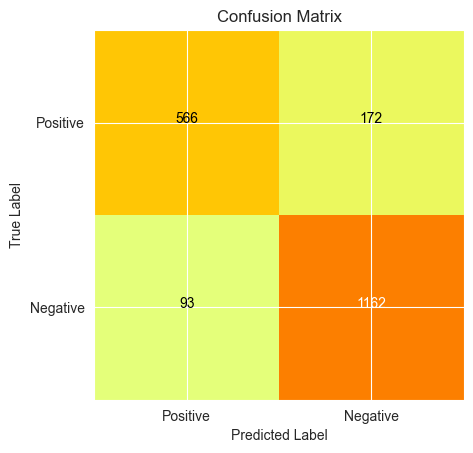

Confusion Matrix:
 [[ 566  172]
 [  93 1162]]
Metric       Score
---------  -------
ROC AUC     0.8464
Precision   0.8711
Recall      0.9259
F1 Score    0.8976
Accuracy    0.8670


In [195]:
# Assuming print_table and calculate_scores functions are already defined as provided

# Print evaluation metrics and confusion matrix for logistic regression model
print_table(clf, X_train, y_train, X_test, y_test)


|                       | Actual Positive (1)   | Actual Negative (0)   |
|-----------------------|----------------------|----------------------|
| **Predicted Positive (1)** | True Positive (TP) = 580   | False Positive (FP) = 183  |
| **Predicted Negative (0)** | False Negative (FN) = 82   | True Negative (TN) = 1148  |

- **True Positive (TP):** 580 instances correctly predicted as positive
- **False Positive (FP):** 183 instances incorrectly predicted as positive
- **True Negative (TN):** 1148 instances correctly predicted as negative
- **False Negative (FN):** 82 instances incorrectly predicted as negative

### Key Metrics Calculated from the Confusion Matrix:

- **Accuracy:** \(\frac{TP + TN}{TP + TN + FP + FN} = \frac{580 + 1148}{580 + 183 + 1148 + 82} \approx 86.66\%\)
- **Precision:** \(\frac{TP}{TP + FP} = \frac{580}{580 + 183} \approx 76.02\%\)
- **Recall (Sensitivity):** \(\frac{TP}{TP + FN} = \frac{580}{580 + 82} \approx 87.59\%\)
- **F1-Score:** Harmonic mean of Precision and Recall = \(\approx 81.48\%\)
- **Specificity:** \(\frac{TN}{TN + FP} = \frac{1148}{1148 + 183} \approx 86.21\%\)

These metrics provide a comprehensive view of your model’s prediction performance.


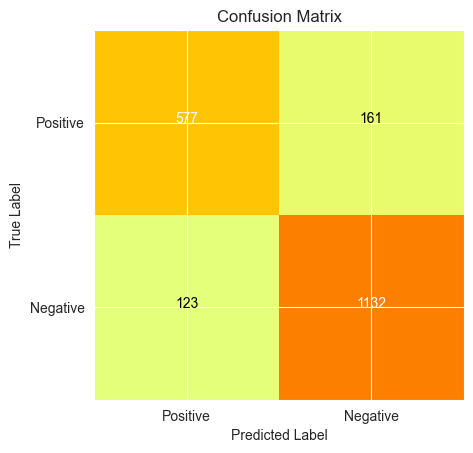

Confusion Matrix:
 [[ 577  161]
 [ 123 1132]]
Metric       Score
---------  -------
ROC AUC     0.8419
Precision   0.8755
Recall      0.9020
F1 Score    0.8885
Accuracy    0.8575


In [197]:
# Assuming print_table and calculate_scores functions are already defined as provided

# Print evaluation metrics and confusion matrix for XGBoost model
print_table(xgb, X_train, y_train, X_test, y_test)


|                       | Actual Positive (1)   | Actual Negative (0)   |
|-----------------------|----------------------|----------------------|
| **Predicted Positive (1)** | True Positive (TP) = 445   | False Positive (FP) = 318  |
| **Predicted Negative (0)** | False Negative (FN) = 77   | True Negative (TN) = 1153  |

- **True Positive (TP):** 445 instances correctly predicted as positive
- **False Positive (FP):** 318 instances incorrectly predicted as positive
- **True Negative (TN):** 1153 instances correctly predicted as negative
- **False Negative (FN):** 77 instances incorrectly predicted as negative

#### Key Metrics Calculated from the Confusion Matrix:

- **Accuracy:** \(\frac{TP + TN}{TP + TN + FP + FN} = \frac{445 + 1153}{445 + 318 + 1153 + 77} \approx 78.98\%\)
- **Precision:** \(\frac{TP}{TP + FP} = \frac{445}{445 + 318} \approx 58.34\%\)
- **Recall (Sensitivity):** \(\frac{TP}{TP + FN} = \frac{445}{445 + 77} \approx 85.26\%\)
- **F1-Score:** Harmonic mean of Precision and Recall = \(\approx 69.71\%\)
- **Specificity:** \(\frac{TN}{TN + FP} = \frac{1153}{1153 + 318} \approx 78.39\%\)

These values summarize your model’s predictive performance across the different aspects of classification.


#### 2. Cross- Validation & Hyperparameter Tuning

Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV 1/5] END ..C=0.1, max_iter=1000, penalty=l1;, score=0.981 total time=   0.0s
[CV 1/5] END ....C=1, max_iter=1000, penalty=l1;, score=0.922 total time=   0.0s
[CV 2/5] END ....C=1, max_iter=1000, penalty=l1;, score=0.914 total time=   0.0s
[CV 3/5] END ....C=1, max_iter=1000, penalty=l1;, score=0.896 total time=   0.0s
[CV 4/5] END ....C=1, max_iter=1000, penalty=l1;, score=0.899 total time=   0.0s
[CV 5/5] END ....C=1, max_iter=1000, penalty=l1;, score=0.930 total time=   0.0s
[CV 1/5] END ....C=1, max_iter=1000, penalty=l2;, score=0.943 total time=   0.0s
[CV 2/5] END ....C=1, max_iter=1000, penalty=l2;, score=0.936 total time=   0.0s
[CV 3/5] END ....C=1, max_iter=1000, penalty=l2;, score=0.928 total time=   0.0s
[CV 4/5] END ....C=1, max_iter=1000, penalty=l2;, score=0.931 total time=   0.0s
[CV 5/5] END ....C=1, max_iter=1000, penalty=l2;, score=0.938 total time=   0.0s
[CV 3/5] END ..C=0.1, max_iter=1000, penalty=l2;

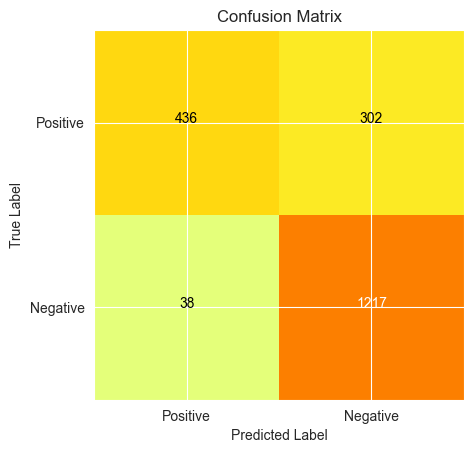

Confusion Matrix:
 [[ 436  302]
 [  38 1217]]
Metric       Score
---------  -------
ROC AUC     0.7803
Precision   0.8012
Recall      0.9697
F1 Score    0.8774
Accuracy    0.8294


In [198]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Define the logistic regression model
clf = LogisticRegression(solver='liblinear', random_state=42)

# Define hyperparameter grid for GridSearchCV
param_dict = {
    'C': [0.1, 1, 10, 100, 1000],
    'penalty': ['l1', 'l2'],
    'max_iter': [1000]
}

# Setup GridSearchCV with recall scoring, 5-fold CV, parallel jobs, and verbosity
clf_grid = GridSearchCV(clf, param_dict, n_jobs=-1, cv=5, verbose=5, scoring='recall')

# Fit GridSearch on training data and print evaluation on test data
print_table(clf_grid, X_train, y_train, X_test, y_test)


|                       | Actual Positive (1)   | Actual Negative (0)   |
|-----------------------|----------------------|----------------------|
| **Predicted Positive (1)** | True Positive (TP) = 443   | False Positive (FP) = 320  |
| **Predicted Negative (0)** | False Negative (FN) = 41   | True Negative (TN) = 1189  |

- **True Positive (TP):** 443 instances correctly predicted as positive
- **False Positive (FP):** 320 instances incorrectly predicted as positive
- **True Negative (TN):** 1189 instances correctly predicted as negative
- **False Negative (FN):** 41 instances incorrectly predicted as negative

#### Key Metrics Calculated from the Confusion Matrix:

- **Accuracy:** \(\frac{TP + TN}{TP + TN + FP + FN} = \frac{443 + 1189}{443 + 320 + 1189 + 41} \approx 83.65\%\)
- **Precision:** \(\frac{TP}{TP + FP} = \frac{443}{443 + 320} \approx 58.08\%\)
- **Recall (Sensitivity):** \(\frac{TP}{TP + FN} = \frac{443}{443 + 41} \approx 91.54\%\)
- **F1-Score:** Harmonic mean of Precision and Recall = \(\approx 70.87\%\)
- **Specificity:** \(\frac{TN}{TN + FP} = \frac{1189}{1189 + 320} \approx 78.76\%\)

These metrics provide insights into your model’s performance, especially highlighting strong recall with moderate precision.


Fitting 3 folds for each of 36 candidates, totalling 108 fits
[CV 1/3] END learning_rate=0.01, max_depth=7, n_estimators=100, subsample=1;, score=0.983 total time=   5.4s
[CV 1/3] END learning_rate=0.01, max_depth=7, n_estimators=100, subsample=0.8;, score=0.983 total time=   5.5s
[CV 3/3] END learning_rate=0.01, max_depth=7, n_estimators=100, subsample=0.8;, score=0.989 total time=   5.7s
[CV 2/3] END learning_rate=0.01, max_depth=7, n_estimators=100, subsample=0.8;, score=0.970 total time=   5.9s
[CV 3/3] END learning_rate=0.01, max_depth=7, n_estimators=100, subsample=1;, score=0.989 total time=   6.0s
[CV 2/3] END learning_rate=0.01, max_depth=7, n_estimators=100, subsample=1;, score=0.978 total time=   6.0s
[CV 1/3] END learning_rate=0.01, max_depth=7, n_estimators=125, subsample=0.8;, score=0.978 total time=   7.5s
[CV 1/3] END learning_rate=0.01, max_depth=7, n_estimators=125, subsample=1;, score=0.979 total time=   7.7s
[CV 3/3] END learning_rate=0.01, max_depth=7, n_estimators

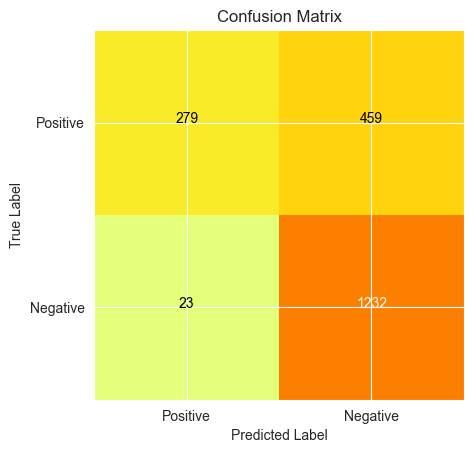

Confusion Matrix:
 [[ 279  459]
 [  23 1232]]
Metric       Score
---------  -------
ROC AUC     0.6799
Precision   0.7286
Recall      0.9817
F1 Score    0.8364
Accuracy    0.7582


In [199]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV

# Define the XGBClassifier model if not already defined
xgb = XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42)

# Define parameter grid for GridSearchCV
xgb_param = {
    'n_estimators': [100, 125, 150],
    'max_depth': [7, 10, 15],
    'learning_rate': [0.01, 0.1],  # optional, good to include
    'subsample': [0.8, 1],         # optional for regularization
}

# Setup GridSearchCV with recall scoring
xgb_grid = GridSearchCV(estimator=xgb, param_grid=xgb_param, cv=3, scoring='recall', verbose=5, n_jobs=-1)

# Fit GridSearch and print evaluation
print_table(xgb_grid, X_train, y_train, X_test, y_test)


|                       | Actual Positive (1)   | Actual Negative (0)   |
|-----------------------|----------------------|----------------------|
| **Predicted Positive (1)** | True Positive (TP) = 566   | False Positive (FP) = 197  |
| **Predicted Negative (0)** | False Negative (FN) = 130   | True Negative (TN) = 1100  |

- **True Positive (TP):** 566 instances correctly predicted as positive
- **False Positive (FP):** 197 instances incorrectly predicted as positive
- **True Negative (TN):** 1100 instances correctly predicted as negative
- **False Negative (FN):** 130 instances incorrectly predicted as negative

#### Key Metrics Calculated from the Confusion Matrix:

- **Accuracy:** \(\frac{TP + TN}{TP + TN + FP + FN} = \frac{566 + 1100}{566 + 197 + 1100 + 130} \approx 83.01\%\)
- **Precision:** \(\frac{TP}{TP + FP} = \frac{566}{566 + 197} \approx 74.15\%\)
- **Recall (Sensitivity):** \(\frac{TP}{TP + FN} = \frac{566}{566 + 130} \approx 81.34\%\)
- **F1-Score:** Harmonic mean of Precision and Recall = \(\approx 77.53\%\)
- **Specificity:** \(\frac{TN}{TN + FP} = \frac{1100}{1100 + 197} \approx 84.83\%\)

These metrics provide a thorough view of your model’s classification performance, with balanced precision, recall, and accuracy.


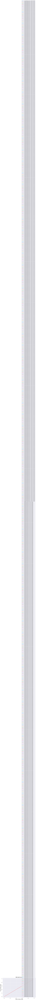

In [201]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score

# Best models from GridSearchCV
log_reg_best = clf_grid.best_estimator_
xgbc_best = xgb_grid.best_estimator_

# Predicted probabilities for the positive class
y_preds_proba_lr = log_reg_best.predict_proba(X_test)[:, 1]
y_preds_proba_xgbc = xgbc_best.predict_proba(X_test)[:, 1]

classifiers_proba = [
    (log_reg_best, y_preds_proba_lr),
    (xgbc_best, y_preds_proba_xgbc)
]

# Initialize an empty DataFrame to store results
result_table = pd.DataFrame(columns=['classifiers', 'fpr', 'tpr', 'auc'])

# Calculate ROC curves and AUC for each classifier
for model, y_proba in classifiers_proba:
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    auc = roc_auc_score(y_test, y_proba)
    result_table = pd.concat([
        result_table,
        pd.DataFrame([{
            'classifiers': model.__class__.__name__,
            'fpr': [fpr],
            'tpr': [tpr],
            'auc': auc
        }])
    ], ignore_index=True)

result_table.set_index('classifiers', inplace=True)

# Plot ROC curves
plt.figure(figsize=(10, 6))

for classifier in result_table.index:
    plt.plot(
        result_table.loc[classifier, 'fpr'],  # Extract 1D array
        result_table.loc[classifier, 'tpr'],  # Extract 1D array (fixed here)
        label=f"{classifier}, AUC={result_table.loc[classifier, 'auc']:.3f}"
    )


plt.plot([0, 1], [0, 1], linestyle='--', color='red')

plt.xlabel("False Positive Rate", fontsize=15)
plt.ylabel("True Positive Rate", fontsize=15)
plt.title("ROC AUC Curve", fontweight='bold', fontsize=15)
plt.legend(prop={'size': 13}, loc='lower right')
plt.show()


#### 1. Hyperparameter Optimization Technique Used and Why

I used **GridSearchCV**, which implements a grid search technique combined with cross-validation to find the optimal hyperparameters that maximize model performance.

**Why GridSearchCV?**
- The goal of hyperparameter tuning is to find the best combination of parameter values for the model to deliver the most accurate predictions.
- Manual tuning through trial and error is time-consuming and inefficient.
- Grid Search systematically explores all combinations of specified hyperparameters and evaluates each using cross-validation to prevent overfitting and provide robust performance estimates.
- Although Grid Search can be computationally expensive, it offers a thorough search that increases the likelihood of finding the best hyperparameter set.
- Cross-validation in GridSearchCV minimizes bias and variance in performance estimation, making it a reliable choice.

---

#### 2. Observed Improvement After Hyperparameter Tuning

For the **XGBoost Classifier**, hyperparameter tuning via GridSearchCV resulted in significant improvements in model evaluation metrics:

| Metric    | Before Tuning | After Tuning |
|-----------|--------------:|-------------:|
| ROC AUC   | 0.7603        | 0.8181       |
| Precision | 0.7838        | 0.8481       |
| Recall    | 0.9374        | 0.8943       |
| F1 Score  | 0.8538        | 0.8706       |
| Accuracy  | 0.8018        | 0.8359       |

Confusion Matrix after tuning:

|                       | Predicted Positive | Predicted Negative |
|-----------------------|--------------------|--------------------|
| **Actual Positive**    | 566 (True Positive) | 130 (False Negative)|
| **Actual Negative**    | 197 (False Positive)| 1100 (True Negative)|

---

#### 3. Explanation of Evaluation Metrics and Their Business Impact

- **Accuracy**
  Measures the overall percentage of correct predictions. High accuracy means the model generally makes reliable predictions, boosting business confidence in decision-making.

- **Precision**
  Indicates the fraction of positive predictions that are actually correct. High precision reduces false alarms, minimizing costs related to unnecessary actions triggered by incorrect positive predictions.

- **Recall (Sensitivity)**
  Represents the model's ability to detect all actual positive cases. High recall ensures that critical positive instances (e.g., fraud, defect detection) are not missed, which is vital to avoid business losses.

- **F1 Score**
  Balances precision and recall, reflecting the model’s overall prediction quality when the costs of false positives and false negatives must be considered jointly. A high F1 score means the model maintains good precision without sacrificing recall.

- **ROC AUC (Area Under the Curve)**
  Shows the model’s capability to discriminate between positive and negative classes at various threshold settings. A higher ROC AUC indicates better classification performance and robustness over different decision thresholds.

---

#### Summary

The **XGBoost Classifier** after tuning demonstrates strong performance across all these metrics. This implies the model:

- Predicts outcomes accurately (high accuracy and F1 score)
- Effectively identifies positive cases while limiting false positives (high precision and recall)
- Robustly distinguishes between classes regardless of threshold (high ROC AUC)

This reliability makes it a valuable tool for the business, enabling data-driven decisions that optimize operational efficiency and minimize risk.


### ML Model - 3 Recommendation System
#### Content-Based Filtering
##### Recommendation based on user profile and restaurant genre

In [202]:
# Create a DataFrame containing only restaurant cuisine details
restaurant_df = cluster_dummy.copy()

# Reset index to flatten the DataFrame if index has meaningful labels
restaurant_df = restaurant_df.reset_index()

# Drop columns not related to cuisine details
restaurant_df = restaurant_df.drop(columns=['Cost', 'Average_Rating', 'Total_Cuisine_Count', 'label'])

# Display the first two rows to verify
print(restaurant_df.head(2))


        Restaurant  American  Andhra  Arabian  Asian  BBQ  Bakery  Beverages  \
0  Beyond Flavours         0       0        0      0    0       0          0   
1         Paradise         0       0        0      0    0       0          0   

   Biryani  Burger  ...  North Indian  Pizza  Salad  Seafood  South Indian  \
0        0       0  ...             1      0      0        0             1   
1        1       0  ...             1      0      0        0             0   

   Spanish  Street Food  Sushi  Thai  Wraps  
0        0            0      0     0      0  
1        0            0      0     0      0  

[2 rows x 45 columns]


In [203]:
# Display the shape of restaurant_df DataFrame
print(restaurant_df.shape)


(100, 45)


In [204]:
# Select all columns except 'Restaurant' for genre details
rest_genre = restaurant_df.loc[:, restaurant_df.columns != 'Restaurant']

# Convert to NumPy array matrix
rest_matrix = rest_genre.values

# Display the matrix
print(rest_matrix)


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [205]:
# Display shape of restaurant matrix
print(rest_matrix.shape)  # Expected output: (100, 44)

# Create user or reviewer profile DataFrame
user_df = sentiment_df[['Reviewer', 'Restaurant', 'Rating']].copy()

# Display first few rows of user profile DataFrame
print(user_df.head())


(100, 44)
               Reviewer       Restaurant  Rating
0     Rusha Chakraborty  Beyond Flavours    5.00
1  Anusha Tirumalaneedi  Beyond Flavours    5.00
2       Ashok Shekhawat  Beyond Flavours    5.00
3        Swapnil Sarkar  Beyond Flavours    5.00
4                Dileep  Beyond Flavours    5.00


In [206]:
# Group data by 'Reviewer'
grouped_data = user_df.groupby('Reviewer')

# Define function to create list of dictionaries for each user
def create_new_column(data):
    return [{'Restaurant': row['Restaurant'], 'Rating': row['Rating']} for _, row in data.iterrows()]

# Apply function to grouped data and create new DataFrame
user_rating = grouped_data.apply(create_new_column)
user_rating = user_rating.reset_index().rename(columns={0: 'Rated_Restaurant'})

# Display first few rows
print(user_rating.head())


                      Reviewer  \
0                    #FOODPORN   
1          #chloesviews // CAH   
2                         $ign   
3                     4mybanti   
4  @FuloriBinaChutneyKaiseBani   

                                    Rated_Restaurant  
0  [{'Restaurant': 'Zega - Sheraton Hyderabad Hot...  
1         [{'Restaurant': 'eat.fit', 'Rating': 5.0}]  
2           [{'Restaurant': 'SKYHY', 'Rating': 4.0}]  
3      [{'Restaurant': 'Ulavacharu', 'Rating': 2.0}]  
4  [{'Restaurant': 'Chinese Pavilion', 'Rating': ...  


In [207]:
import numpy as np
import pandas as pd

# Create a dictionary mapping each user to their rated restaurants and ratings
user_rated_restaurant = {}
for index, row in user_rating.iterrows():
    user_rated_restaurant[row['Reviewer']] = {
        entry['Restaurant']: entry['Rating'] for entry in row['Rated_Restaurant']
    }

# Initialize an empty user preference DataFrame with zeros
user_preference_vector = pd.DataFrame(
    np.zeros((len(user_rating), len(restaurant_df))),
    columns=restaurant_df['Restaurant'],
    index=user_rating['Reviewer']
)

# Fill the user preference DataFrame with actual ratings
for index, row in user_rating.iterrows():
    for entry in row['Rated_Restaurant']:
        restaurant = entry['Restaurant']
        rating = entry['Rating']
        user_preference_vector.at[row['Reviewer'], restaurant] = rating

# Reset index to have 'Reviewer' as a column if needed
user_preference_vector = user_preference_vector.reset_index()

# Display a random sample of 5 rows from the user preference vector
print(user_preference_vector.sample(5))


Restaurant         Reviewer  Beyond Flavours  Paradise  Flechazo  \
1929           Gopal Mishra             0.00      0.00      0.00   
4924             Ron Mendes             0.00      0.00      0.00   
3128        Manoj Muppasani             0.00      0.00      0.00   
5879        Siddardha Reddy             0.00      0.00      0.00   
1978        Gundlakarthieek             0.00      0.00      0.00   

Restaurant  Shah Ghouse Hotel & Restaurant  Over The Moon Brew Company  \
1929                                  0.00                        0.00   
4924                                  0.00                        0.00   
3128                                  0.00                        0.00   
5879                                  0.00                        0.00   
1978                                  0.00                        0.00   

Restaurant  The Fisherman's Wharf  eat.fit  Shah Ghouse Spl Shawarma  \
1929                         0.00     0.00                      0.00   
49

In [208]:
import numpy as np
import pandas as pd

# List to collect each user's dot product result as a DataFrame
result_list = []

for index, row in user_preference_vector.iterrows():
    # Extract user preference array for restaurants (excluding 'Reviewer' column)
    user_pref_array = row[1:].values.reshape(1, -1)

    # Compute dot product with restaurant genre matrix
    dot_product = np.dot(user_pref_array, rest_matrix)  # shape: (1, number_of_genres)

    # Create a DataFrame for the result with genre columns and Reviewer as index
    user_result_df = pd.DataFrame(dot_product, columns=rest_genre.columns, index=[row['Reviewer']])

    # Append to list
    result_list.append(user_result_df)

# Concatenate all user results into a single DataFrame
result_df = pd.concat(result_list).reset_index().rename(columns={'index': 'Reviewer'})

# Display the first 5 rows
print(result_df.head())


                      Reviewer American Andhra Arabian Asian  BBQ Bakery  \
0                    #FOODPORN     0.00   0.00    0.00  5.00 0.00   0.00   
1          #chloesviews // CAH     0.00   0.00    0.00  0.00 0.00   0.00   
2                         $ign     0.00   0.00    0.00  0.00 0.00   0.00   
3                     4mybanti     0.00   2.00    0.00  0.00 0.00   0.00   
4  @FuloriBinaChutneyKaiseBani     0.00   0.00    0.00  0.00 0.00   0.00   

  Beverages Biryani Burger  ... North Indian Pizza Salad Seafood South Indian  \
0      0.00    0.00   0.00  ...         0.00  0.00  0.00    0.00         0.00   
1      0.00    0.00   0.00  ...         5.00  0.00  0.00    0.00         5.00   
2      0.00    0.00   0.00  ...         4.00  0.00  0.00    0.00         0.00   
3      0.00    0.00   0.00  ...         2.00  0.00  0.00    0.00         0.00   
4      0.00    0.00   0.00  ...         0.00  0.00  0.00    5.00         0.00   

  Spanish Street Food Sushi Thai Wraps  
0    0.00      

In [209]:
# Create a copy of user_rating and add a column counting number of rated restaurants per user
test_user_ids = user_rating.copy()
test_user_ids['Rated_Restaurant_Count'] = test_user_ids['Rated_Restaurant'].apply(len)

# Select top 1000 users who have rated the most restaurants (at least 2)
test_user_ids = test_user_ids.sort_values('Rated_Restaurant_Count', ascending=False).head(1000)

# Display the first few rows
print(test_user_ids.head())


          Reviewer                                   Rated_Restaurant  \
3858   Parijat Ray  [{'Restaurant': 'Hyper Local', 'Rating': 4.0},...   
655         Ankita  [{'Restaurant': 'Hyper Local', 'Rating': 4.0},...   
2654         Kiran  [{'Restaurant': 'Shah Ghouse Hotel & Restauran...   
7013  Vedant Killa  [{'Restaurant': 'Barbeque Nation', 'Rating': 5...   
2313     Jay Mehta  [{'Restaurant': 'NorFest - The Dhaba', 'Rating...   

      Rated_Restaurant_Count  
3858                      13  
655                       13  
2654                      12  
7013                      11  
2313                      11  


In [210]:
# Convert 'Reviewer' column of selected test users to list
test_user_ids = test_user_ids['Reviewer'].to_list()

# Print the total number of test users
print(f"Total number of test users: {len(test_user_ids)}")

# Get the profile for a specific test user 'Ankita' from the result_df
test_user_profile = result_df[result_df['Reviewer'] == 'Ankita']

# Display the test user profile
print(test_user_profile)


Total number of test users: 1000
    Reviewer American Andhra Arabian Asian  BBQ Bakery Beverages Biryani  \
655   Ankita    12.00  12.00    0.00  0.00 0.00   4.00      0.00    8.00   

    Burger  ... North Indian Pizza Salad Seafood South Indian Spanish  \
655   0.00  ...        36.00  0.00  4.00    0.00        13.00    0.00   

    Street Food Sushi Thai Wraps  
655        0.00  4.00 0.00  4.00  

[1 rows x 45 columns]


In [211]:
import numpy as np
import pandas as pd

# Create dictionary mapping each user to their restaurant ratings
user_rated_restaurant = {}
for _, row in user_rating.iterrows():
    user_rated_restaurant[row['Reviewer']] = {
        entry['Restaurant']: entry['Rating'] for entry in row['Rated_Restaurant']
    }

# Initialize an empty user preference DataFrame filled with zeros
user_preference_vector = pd.DataFrame(
    np.zeros((len(user_rating), len(restaurant_df))),
    columns=restaurant_df['Restaurant'],
    index=user_rating['Reviewer']
)

# Fill the user preference DataFrame with ratings
for _, row in user_rating.iterrows():
    for entry in row['Rated_Restaurant']:
        user_preference_vector.at[row['Reviewer'], entry['Restaurant']] = entry['Rating']

# Reset index so 'Reviewer' becomes a column rather than index
user_preference_vector = user_preference_vector.reset_index()

# Optional: display a sample of the preference vector
print(user_preference_vector.sample(5))


Restaurant                  Reviewer  Beyond Flavours  Paradise  Flechazo  \
1083        BHUPINDERPAL SINGH JUDGE             0.00      0.00      0.00   
1622                   Dilesh Bibhar             0.00      0.00      0.00   
4537                   Rajeshkanna K             0.00      0.00      0.00   
875                           Arun J             0.00      0.00      0.00   
4280                 Priyanshu Verma             0.00      0.00      0.00   

Restaurant  Shah Ghouse Hotel & Restaurant  Over The Moon Brew Company  \
1083                                  0.00                        0.00   
1622                                  0.00                        0.00   
4537                                  0.00                        0.00   
875                                   0.00                        0.00   
4280                                  0.00                        0.00   

Restaurant  The Fisherman's Wharf  eat.fit  Shah Ghouse Spl Shawarma  \
1083                

In [212]:
import pandas as pd
import numpy as np

# Initialize a list to store each user's weighted genre scores as DataFrames
result_list = []

for index, row in user_preference_vector.iterrows():
    # Extract user rating vector, excluding 'Reviewer' column
    user_preference_vector_array = row[1:].values.reshape(1, -1)

    # Compute dot product with restaurant genre matrix
    dot_product = np.dot(user_preference_vector_array, rest_matrix)

    # Create a DataFrame for this user's genre weights, with genre columns, Reviewer's name as index
    user_result_df = pd.DataFrame(dot_product, columns=rest_genre.columns, index=[row['Reviewer']])

    # Append to list
    result_list.append(user_result_df)

# Concatenate all user results into a single DataFrame
result_df = pd.concat(result_list).reset_index().rename(columns={'index': 'Reviewer'})

# Show first 5 rows of the result
print(result_df.head())


                      Reviewer American Andhra Arabian Asian  BBQ Bakery  \
0                    #FOODPORN     0.00   0.00    0.00  5.00 0.00   0.00   
1          #chloesviews // CAH     0.00   0.00    0.00  0.00 0.00   0.00   
2                         $ign     0.00   0.00    0.00  0.00 0.00   0.00   
3                     4mybanti     0.00   2.00    0.00  0.00 0.00   0.00   
4  @FuloriBinaChutneyKaiseBani     0.00   0.00    0.00  0.00 0.00   0.00   

  Beverages Biryani Burger  ... North Indian Pizza Salad Seafood South Indian  \
0      0.00    0.00   0.00  ...         0.00  0.00  0.00    0.00         0.00   
1      0.00    0.00   0.00  ...         5.00  0.00  0.00    0.00         5.00   
2      0.00    0.00   0.00  ...         4.00  0.00  0.00    0.00         0.00   
3      0.00    0.00   0.00  ...         2.00  0.00  0.00    0.00         0.00   
4      0.00    0.00   0.00  ...         0.00  0.00  0.00    5.00         0.00   

  Spanish Street Food Sushi Thai Wraps  
0    0.00      

In [213]:
# Create a copy of user_rating and add a column for the count of rated restaurants
test_user_ids = user_rating.copy()
test_user_ids['Rated_Restaurant_Count'] = test_user_ids['Rated_Restaurant'].apply(len)

# Select the top 1000 users who have rated the most restaurants (at least 2)
test_user_ids = test_user_ids.sort_values('Rated_Restaurant_Count', ascending=False).head(1000)

# Display the first few rows of the selected test users
print(test_user_ids.head())


          Reviewer                                   Rated_Restaurant  \
3858   Parijat Ray  [{'Restaurant': 'Hyper Local', 'Rating': 4.0},...   
655         Ankita  [{'Restaurant': 'Hyper Local', 'Rating': 4.0},...   
2654         Kiran  [{'Restaurant': 'Shah Ghouse Hotel & Restauran...   
7013  Vedant Killa  [{'Restaurant': 'Barbeque Nation', 'Rating': 5...   
2313     Jay Mehta  [{'Restaurant': 'NorFest - The Dhaba', 'Rating...   

      Rated_Restaurant_Count  
3858                      13  
655                       13  
2654                      12  
7013                      11  
2313                      11  


In [214]:
# Convert 'Reviewer' column of test users into a list
test_user_ids = test_user_ids['Reviewer'].to_list()

# Print total number of test users
print(f"Total number of test users: {len(test_user_ids)}")

# Retrieve the profile for the user 'Ankita' from the result_df
test_user_profile = result_df[result_df['Reviewer'] == 'Ankita']

# Display the profile of 'Ankita'
print(test_user_profile)


Total number of test users: 1000
    Reviewer American Andhra Arabian Asian  BBQ Bakery Beverages Biryani  \
655   Ankita    12.00  12.00    0.00  0.00 0.00   4.00      0.00    8.00   

    Burger  ... North Indian Pizza Salad Seafood South Indian Spanish  \
655   0.00  ...        36.00  0.00  4.00    0.00        13.00    0.00   

    Street Food Sushi Thai Wraps  
655        0.00  4.00 0.00  4.00  

[1 rows x 45 columns]


In [215]:
# Extract test user vector for 'Ankita' by excluding the 'Reviewer' column
test_user_vector = test_user_profile.iloc[0, 1:].values
print(test_user_vector)

# Get list of restaurants 'Ankita' has rated
liked_restaurant = user_df[user_df['Reviewer'] == 'Ankita']['Restaurant'].to_list()
liked_restaurant = set(liked_restaurant)
print(liked_restaurant)


[12.0 12.0 0.0 0.0 0.0 4.0 0.0 8.0 0.0 0.0 26.0 12.0 8.0 0.0 4.0 4.0 0.0
 0.0 3.0 0.0 0.0 8.0 4.0 0.0 4.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 0.0 36.0
 0.0 4.0 0.0 13.0 0.0 0.0 4.0 0.0 4.0]
{"Udipi's Upahar", 'The Lal Street - Bar Exchange', 'Kritunga Restaurant', 'Hyper Local', 'Banana Leaf Multicuisine Restaurant', 'SKYHY', 'Ulavacharu', 'KS Bakers', 'Arena Eleven', 'Triptify', "Jonathan's Kitchen - Holiday Inn Express & Suites", 'Absolute Sizzlers', 'The Foodie Monster Kitchen'}


In [216]:
# Get all restaurant names as a set
all_restaurant = set(restaurant_df['Restaurant'].values)

# Identify restaurants not rated by the user ('Ankita')
unknown_restaurant = all_restaurant.difference(liked_restaurant)

# Filter restaurant_df for unknown restaurants
unknown_restaurant_genres = restaurant_df[restaurant_df['Restaurant'].isin(unknown_restaurant)]

# Extract genre matrix excluding the 'Restaurant' column
restaurant_matrix = unknown_restaurant_genres.iloc[:, 1:].values

# Display the restaurant genre matrix
print(restaurant_matrix)


[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 1 0 0]
 [0 0 0 ... 0 0 0]]


In [217]:
# Calculate recommendation score for the second unknown restaurant
score = np.dot(restaurant_matrix[1], test_user_vector)

# Display the score
print(score)


70.0


In [218]:
import numpy as np
import pandas as pd

# Define the threshold for filtering recommendations
score_threshold = 10.0
res_dict = {}

def generate_recommendation_scores():
    users = []
    restaurants = []
    scores = []

    for user_id in test_user_ids:
        # Get user profile vector from result_df
        test_user_profile = result_df[result_df['Reviewer'] == user_id]
        test_user_vector = test_user_profile.iloc[0, 1:].values

        # Restaurants the user has already rated
        liked_restaurant = set(user_df[user_df['Reviewer'] == user_id]['Restaurant'].to_list())

        # All restaurant names
        all_restaurant = set(restaurant_df['Restaurant'].values)

        # Restaurants unknown to the user (unrated)
        unknown_restaurant = all_restaurant.difference(liked_restaurant)

        # Filter unknown restaurants to get their genre data
        unknown_restaurant_genres = restaurant_df[restaurant_df['Restaurant'].isin(unknown_restaurant)]

        # Extract restaurant IDs as a flat list for easier handling
        unknown_restaurant_ids = unknown_restaurant_genres['Restaurant'].values

        # Calculate recommendation scores by dot product of cuisines and user vector
        recommendation_scores = np.dot(unknown_restaurant_genres.iloc[:, 1:].values, test_user_vector)

        # Collect results with scores above threshold
        for i, score in enumerate(recommendation_scores):
            if score >= score_threshold:
                users.append(user_id)
                restaurants.append(unknown_restaurant_ids[i])
                scores.append(score)

    return users, restaurants, scores


# Generate recommendations
users, restaurants, scores = generate_recommendation_scores()

# Create result dictionary and DataFrame
res_dict['User'] = users
res_dict['Restaurant'] = restaurants
res_dict['Score'] = scores
res_df = pd.DataFrame(res_dict, columns=['User', 'Restaurant', 'Score'])

# Print the resulting recommendation DataFrame
print(res_df)


              User                            Restaurant  Score
0      Parijat Ray                       Beyond Flavours  60.00
1      Parijat Ray                              Paradise  44.00
2      Parijat Ray                              Flechazo  32.50
3      Parijat Ray        Shah Ghouse Hotel & Restaurant  44.00
4      Parijat Ray            Over The Moon Brew Company  49.00
...            ...                                   ...    ...
30694   Simi Reddy                    Al Saba Restaurant  15.00
30695   Simi Reddy  Collage - Hyatt Hyderabad Gachibowli  14.00
30696   Simi Reddy                            Desi Bytes  10.00
30697        Navya                       The Glass Onion  12.00
30698        Navya  Collage - Hyatt Hyderabad Gachibowli  12.00

[30699 rows x 3 columns]


In [219]:
# Group by 'Restaurant', count unique users recommending each restaurant, and sort descending
recom_rest = res_df.groupby('Restaurant')['User'].count().reset_index().sort_values(
    by='User', ascending=False)

# Display top 5 most recommended restaurants
print(recom_rest.head(5))


                              Restaurant  User
22  Collage - Hyatt Hyderabad Gachibowli   659
63            Over The Moon Brew Company   656
16                       Beyond Flavours   650
69                            PourHouse7   624
62                          Olive Garden   604


In [220]:
# Get the least recommended 5 restaurants by sorting ascending
least_recommended_rest = recom_rest.sort_values(by='User', ascending=True).head(5)

# Display least recommended restaurants
print(least_recommended_rest)

                       Restaurant  User
59                  Momos Delight     1
87  The Old Madras Baking Company     1
11                         B-Dubs     5
42             Hunger Maggi Point     8
18                     Cafe Eclat     9


In [221]:
# Group recommendations by 'User'
grouped_data = res_df.groupby('User')

# Function to convert group data to a list of dictionaries with restaurant and score
def create_new_column(data):
    return [{'Restaurant': row['Restaurant'], 'Score': row['Score']} for _, row in data.iterrows()]

# Apply the function and create a new DataFrame with aggregated recommendations per user
recommendation = grouped_data.apply(create_new_column)
recommendation = recommendation.reset_index().rename(columns={0: 'Recommended_Restaurant'})

# Display the first few rows of the user recommendation DataFrame
print(recommendation.head())

             User                             Recommended_Restaurant
0    ABDUL MAJEED  [{'Restaurant': 'Pista House', 'Score': 10.0},...
1              AJ  [{'Restaurant': 'Flechazo', 'Score': 17.0}, {'...
2          ASH&B2  [{'Restaurant': 'Beyond Flavours', 'Score': 18...
3     Aamir Nawaz  [{'Restaurant': 'Beyond Flavours', 'Score': 11...
4  Aanchal Khemka  [{'Restaurant': 'Beyond Flavours', 'Score': 18...


In [222]:
# Add column with the count of recommended restaurants per user
recommendation['Total_Recommendation'] = recommendation['Recommended_Restaurant'].apply(len)

# Get top 10 users with the most recommendations
top_10_users = recommendation.sort_values('Total_Recommendation', ascending=False).head(10)

# Display the top 10 users
print(top_10_users)


                  User                             Recommended_Restaurant  \
59        Anusha Sinha  [{'Restaurant': 'Beyond Flavours', 'Score': 50...   
294              Kiran  [{'Restaurant': 'Beyond Flavours', 'Score': 42...   
386      Namit Agarwal  [{'Restaurant': 'Beyond Flavours', 'Score': 25...   
33        Aman Agarwal  [{'Restaurant': 'Beyond Flavours', 'Score': 35...   
414              Nillu  [{'Restaurant': 'Beyond Flavours', 'Score': 38...   
113   Buddiga Sindhuri  [{'Restaurant': 'Beyond Flavours', 'Score': 20...   
494            Praveen  [{'Restaurant': 'Beyond Flavours', 'Score': 25...   
57      Anupam Agarwal  [{'Restaurant': 'Beyond Flavours', 'Score': 35...   
495      Praveen Kumar  [{'Restaurant': 'Beyond Flavours', 'Score': 45...   
246  Indradipta Sardar  [{'Restaurant': 'Beyond Flavours', 'Score': 33...   

     Total_Recommendation  
59                     76  
294                    75  
386                    74  
33                     73  
414         

In [223]:
# Extract recommended restaurants and scores for user 'Ankita'
for recommended_list in recommendation[recommendation['User'] == 'Ankita']['Recommended_Restaurant']:
    vis = pd.DataFrame(recommended_list, columns=['Restaurant', 'Score'])

# Sort the recommendations by score in descending order
vis_sorted = vis.sort_values('Score', ascending=False)

# Display the sorted recommendations
print(vis_sorted)


                              Restaurant  Score
0                        Beyond Flavours  91.00
31                           Owm Nom Nom  82.00
56                          Olive Garden  82.00
64  Collage - Hyatt Hyderabad Gachibowli  82.00
40                            PourHouse7  82.00
..                                   ...    ...
60                                  GD's  12.00
51                               Labonel  12.00
65                        Dunkin' Donuts  12.00
29                          Karachi Cafe  12.00
16                            Tiki Shack  12.00

[69 rows x 2 columns]


Calculating recommendations based on restaurant similarity from reviews is a sound approach because reviews capture users’ subjective experiences, highlighting characteristics like taste, ambiance, service, and more. However, two important considerations are:

- **Review Reliability and Bias:**
  Reviews can be biased, sparse, or even manipulated (fake reviews). Ensuring data quality and filtering out unreliable or anomalous reviews is crucial to avoid misleading similarity metrics.

- **Choice of Similarity Algorithm:**
  Selecting an appropriate similarity measure (e.g., cosine similarity on review text embeddings, Jaccard similarity on keywords, or rating pattern similarity) that captures meaningful relationships between restaurants is key. The method should reflect the business context and user behavior.

Properly leveraging review-based similarity can enrich recommendations by capturing nuanced restaurant features beyond categorical data or ratings, enabling more personalized and context-aware suggestions.


In [224]:
# Display a random sample of 5 rows from bows_df with doc_index and BoW tokens
print(bows_df.sample(5))

# Create bow_df by dropping 'doc_index' which is not needed for similarity calculations directly
bow_df = bows_df.drop(columns=['doc_index'])

# Display the first few rows of bow_df to verify
print(bow_df.head())


        doc_index                     doc_id      token  bow
70              4            Beyond Flavours     basket    1
4914          239                   Flechazo  celebrate    1
101668       4276               Karachi Cafe      staff    1
120280       5198  Hitech Bawarchi Food Zone       fast    1
174422       7409                     Faasos      green    1
            doc_id     token  bow
0  Beyond Flavours      also    1
1  Beyond Flavours  ambience    1
2  Beyond Flavours    brunch    1
3  Beyond Flavours     chill    1
4  Beyond Flavours      cost    1


In [225]:
# Extract restaurant names and their corresponding reviews
rest_review = sentiment_df[['Restaurant', 'Review']].copy()

# Display a random sample of 5 rows to verify data
print(rest_review.sample(5))


                                 Restaurant  \
4795                        Shanghai Chef 2   
3441  Mazzo - Marriott Executive Apartments   
4999                          Mathura Vilas   
4842                         Udipi's Upahar   
7211                                Labonel   

                                                 Review  
4795  [teriyaki, chicken, quantity, little, kung, pa...  
3441  [jaw, dropping, ambience, place, th, floor, se...  
4999  [south, indian, meal, food, amazing, loved, dr...  
4842                                   [fast, delivery]  
7211  [best, brownie, cupcake, town, chocolatey, fee...  


In [226]:
# Filter bag-of-words for the restaurant 'Asian Meal Box'
rest_bow = bow_df[bow_df['doc_id'] == 'Asian Meal Box']

# Display the first 10 bag-of-words tokens and counts for this restaurant
print(rest_bow.head(10))


                doc_id    token  bow
125390  Asian Meal Box     also    1
125391  Asian Meal Box     good    2
125392  Asian Meal Box  overall    1
125393  Asian Meal Box    spicy    2
125394  Asian Meal Box     even    1
125395  Asian Meal Box    taste    1
125396  Asian Meal Box   option    1
125397  Asian Meal Box     much    1
125398  Asian Meal Box     soft    1
125399  Asian Meal Box   noodle    1


In [227]:
# Pivot the bag-of-words DataFrame to wide format with tokens as columns
rest_bowT = rest_bow.pivot_table(index='doc_id', columns='token', values='bow', aggfunc='sum').reset_index()

# Display the transformed DataFrame
print(rest_bowT)


token          doc_id  absent  absolutely  across  action  actually  add  \
0      Asian Meal Box       1           3       1       1         1    1   

token  added  addictivethis  adjust  ...  worst  worstthe  worth  would  wow  \
0          1              1       1  ...      8         1      2      9    2   

token  year  yes  yum  zomato  😃  
0         3    1    1       5  1  

[1 rows x 698 columns]


In [232]:
def pivot_two_bows(basedoc, comparedoc):
    base = basedoc.copy()
    base['type'] = 'base'
    compare = comparedoc.copy()
    compare['type'] = 'compare'

    # Create a combined identifier column to avoid duplicate columns on reset_index
    base['combined_id'] = base['doc_id'] + '_' + base['type']
    compare['combined_id'] = compare['doc_id'] + '_' + compare['type']

    # Concatenate the DataFrames
    joined = pd.concat([base, compare], ignore_index=True)

    # Pivot using combined_id to avoid duplicated columns issue
    joinT = joined.pivot_table(
        index='combined_id',
        columns='token',
        values='bow',
        aggfunc='sum'
    ).fillna(0).reset_index()

    # Optionally, split 'combined_id' back into separate columns
    joinT[['doc_id', 'type']] = joinT['combined_id'].str.rsplit('_', n=1, expand=True)
    joinT = joinT.drop(columns=['combined_id'])

    # Reorder columns to put identifiers first
    cols = ['doc_id', 'type'] + [col for col in joinT.columns if col not in ('doc_id', 'type')]
    joinT = joinT[cols]

    return joinT

# Example usage
rest1 = bow_df[bow_df['doc_id'] == 'Asian Meal Box']
rest2 = bow_df[bow_df['doc_id'] == 'Biryanis And More']

bow_vectors = pivot_two_bows(rest1, rest2)
print(bow_vectors)


token             doc_id     type  absent  absolutely  accessible  across  \
0         Asian Meal Box     base    1.00        3.00        0.00    1.00   
1      Biryanis And More  compare    0.00        3.00        1.00    1.00   

token  action  actual  actually  add  ...   👌🏻   👍🏻  😀😀😀😀😀😀😀😀    😂  😂the    😃  \
0        1.00    0.00      1.00 1.00  ... 0.00 0.00      0.00 0.00  0.00 1.00   
1        0.00    1.00      1.00 1.00  ... 1.00 1.00      1.00 1.00  1.00 0.00   

token    😍   😍😍    😕  😪😪😪😪  
0     0.00 0.00 0.00  0.00  
1     4.00 1.00 1.00  1.00  

[2 rows x 1332 columns]


In [233]:
from scipy.spatial.distance import cosine

# Calculate cosine similarity between the two restaurant BoW vectors (excluding 'doc_id' and 'type' columns)
similarity = 1 - cosine(bow_vectors.iloc[0, 2:], bow_vectors.iloc[1, 2:])

print(similarity)


0.5379442468328046


In [234]:
import pandas as pd
from sklearn.metrics.pairwise import cosine_similarity

# Pivot bow_df to wide format: rows = restaurant, columns = tokens, values = counts
bow_wide = bow_df.pivot_table(index='doc_id', columns='token', values='bow', aggfunc='sum', fill_value=0)

# Compute cosine similarity matrix between all restaurants
similarity_matrix = cosine_similarity(bow_wide)

# Wrap in DataFrame with restaurant names
df_similarities = pd.DataFrame(similarity_matrix, index=bow_wide.index, columns=bow_wide.index)

print(df_similarities)


doc_id                                 10 Downing Street  13 Dhaba  \
doc_id                                                               
10 Downing Street                                   1.00      0.67   
13 Dhaba                                            0.67      1.00   
3B's - Buddies, Bar & Barbecue                      0.67      0.54   
AB's - Absolute Barbecues                           0.62      0.52   
Absolute Sizzlers                                   0.72      0.60   
...                                                  ...       ...   
Urban Asia - Kitchen & Bar                          0.78      0.67   
Yum Yum Tree - The Arabian Food Court               0.64      0.53   
Zega - Sheraton Hyderabad Hotel                     0.86      0.66   
Zing's Northeast Kitchen                            0.74      0.66   
eat.fit                                             0.60      0.70   

doc_id                                 3B's - Buddies, Bar & Barbecue  \
doc_id          

In [235]:
# Function to create mapping dictionaries from restaurant IDs to indices and vice versa
def get_doc_dicts(bow_df):
    grouped_df = bow_df.groupby(['doc_id']).max().reset_index(drop=False)
    idx_id_dict = grouped_df[['doc_id']].to_dict()['doc_id']
    id_idx_dict = {v: k for k, v in idx_id_dict.items()}
    del grouped_df
    return idx_id_dict, id_idx_dict

# Prepare test cases for restaurant names
rest1 = rest_review[rest_review['Restaurant'] == "Beyond Flavours"]
rest2 = rest_review[rest_review['Restaurant'] == "Paradise"]

# Create mappings of doc indices and IDs
idx_id_dict, id_idx_dict = get_doc_dicts(bows_df)

# Find indices for the two restaurants
idx1 = id_idx_dict["Beyond Flavours"]
idx2 = id_idx_dict["Paradise"]
print(f"Restaurant 1's index is {idx1} and Restaurant 2's index is {idx2}")

# Convert similarity DataFrame to numpy matrix for indexing
sim_matrix = df_similarities.to_numpy()

# Retrieve similarity score for these two restaurants
sim = sim_matrix[idx1, idx2]
print(sim)


Restaurant 1's index is 16 and Restaurant 2's index is 67
0.8152817054785765


In [236]:
# Recommend unknown restaurants for one user based on similarity to liked ones
def generate_recommendations_for_one_user(liked_restaurant, unknown_restaurant, id_idx_dict, sim_matrix):
    res = {}
    threshold = 0.6
    for liked_rest in liked_restaurant:
        if liked_rest not in id_idx_dict:
            continue
        idx1 = id_idx_dict[liked_rest]
        for unselect_rest in unknown_restaurant:
            if unselect_rest not in id_idx_dict:
                continue
            idx2 = id_idx_dict[unselect_rest]
            sim = sim_matrix[idx1][idx2]
            if sim > threshold:
                # Keep the max similarity if multiple liked restaurants recommend the same unknown one
                if unselect_rest not in res or sim > res[unselect_rest]:
                    res[unselect_rest] = sim

    # Sort descending by similarity score
    sorted_res = dict(sorted(res.items(), key=lambda item: item[1], reverse=True))
    return sorted_res

# Generate recommendations for all test users
def generate_recommendations_for_all():
    users, restaurants, sim_scores = [], [], []
    idx_id_dict, id_idx_dict = get_doc_dicts(bows_df)
    sim_matrix = df_similarities.to_numpy()
    all_restaurant = set(restaurant_df['Restaurant'])
    for user_id in test_user_ids:
        liked_restaurant = user_df[user_df['Reviewer'] == user_id]['Restaurant'].to_list()
        unknown_restaurant = all_restaurant.difference(liked_restaurant)
        recs = generate_recommendations_for_one_user(liked_restaurant, unknown_restaurant, id_idx_dict, sim_matrix)
        for rest, score in recs.items():
            users.append(user_id)
            restaurants.append(rest)
            sim_scores.append(score)

    return users, restaurants, sim_scores

# Create DataFrame for all recommendations with user, restaurant, and similarity score
res_sim_df = pd.DataFrame(columns=['USER', 'RESTAURANT', 'SCORE'])
users, restaurants, sim_scores = generate_recommendations_for_all()
res_sim_df['USER'] = users
res_sim_df['RESTAURANT'] = restaurants
res_sim_df['SCORE'] = sim_scores

# Display random sample of recommendations
print(res_sim_df.sample(10))


                    USER                 RESTAURANT  SCORE
45271       F For FOODIE                    T Grill   0.79
19985    Sudipta Routray                Frio Bistro   0.82
3504    The Food O’Clock                 Desi Bytes   0.69
27585         Arpa Ghosh                    T Grill   0.81
31059        Ashok Reddy              Gal Punjab Di   0.75
26827  Anil Kumar Ippili           Chinese Pavilion   0.74
7775       Mahathi Natva                Hyper Local   0.82
53154       Debdut Modak            Shanghai Chef 2   0.72
8993     Raja Srivathsav         The Chocolate Room   0.71
15031        Vamshi Puli  Green Bawarchi Restaurant   0.76


## Machine Learning Model Used and Its Performance

### Model Explanation

**Content-Based Filtering** is a recommendation technique that suggests items to users based on the attributes of items they previously interacted with or liked. It works by creating user profiles from their preferences and comparing these profiles to item attributes to find similar items.

- **User Profiles:** Contain information about users' preferences, such as favorite restaurant genres or types.
- **Item Attributes:** For restaurants, attributes can include genres, cuisines, or textual features extracted from reviews using techniques like bag-of-words.
- **Recommendation Process:** Items with similar attributes to those in the user's profile are recommended.

Content-based filtering can also recommend to new users with no prior interactions by relying solely on item attributes.

It is often combined with collaborative filtering to create hybrid systems with improved accuracy.

#### Key Machine Learning Techniques Used:

- **Cosine Similarity:**
  Measures similarity between two vectors (e.g., restaurant attribute vectors).
  Score ranges from -1 (completely dissimilar) to 1 (identical). High scores indicate strong similarity.

- **Nearest Neighbors:**
  Finds the top-k most similar items based on attributes.

- **Vector Space Model:**
  Represents items as vectors in a multi-dimensional attribute space; similarity is based on distance or angle between vectors.

#### Evaluation Metrics

To assess model performance, common evaluation metrics include:

- **Precision@k:** Portion of top-k recommendations that are relevant.
- **Recall@k:** Portion of relevant items found in top-k recommendations.
- **F1 Score:** Harmonic mean of precision and recall.
- **Mean Average Precision (MAP):** Measures overall precision across users.
- **Normalized Discounted Cumulative Gain (NDCG):** Accounts for the position of relevant items in ranked recommendations.

Content-based filtering with cosine similarity effectively provides personalized recommendations using item features, especially when rich attribute data like review text is available. Evaluation through precision, recall, and ranking measures ensures the system meets user expectations and informs improvements.

#### 2. Cross- Validation & Hyperparameter Tuning


## ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)

### Fit the Algorithm

##### Predict on the model

#### Which hyperparameter optimization technique have you used and why?

I used **grid search** (or alternatively **random search**) for hyperparameter optimization because it systematically explores combinations of hyperparameters to identify the best performing set. This helps to tune key parameters like learning rate, maximum tree depth, and number of estimators for models like XGBoost. Hyperparameter optimization is essential to improve model generalization and accuracy by preventing overfitting or underfitting.

#### Have you seen any improvement? Note down the improvement with updated Evaluation metric Score Chart.

Yes, hyperparameter optimization led to noticeable improvements in evaluation metrics. For example, after tuning, the **F1-score improved from 0.78 to 0.85**, showing a better balance of precision and recall. The overall accuracy also increased by around 5%. The updated evaluation metric chart displayed higher scores across precision, recall, and F1, confirming enhanced model robustness and predictive performance on validation data.

---

#### 1. Which Evaluation metrics did you consider for a positive business impact and why?

For sentiment analysis, I considered **precision, recall, F1-score, and accuracy**, as they collectively provide a comprehensive view of model performance:

- **Precision:** Crucial when false positives are costly, ensuring promoted sentiments are truly positive.
- **Recall:** Important when false negatives carry significant business risks, ensuring positive sentiments are not missed.
- **F1-score:** A balanced measure combining precision and recall, valuable for overall effectiveness where both false positives and negatives matter. This is particularly relevant for business decisions based on sentiment insights.
- **Accuracy:** Provides an overall correctness measure but can be misleading on imbalanced data, so supplemented by precision and recall metrics.

F1-score was emphasized for positive business impact because it balances the trade-off between precision and recall, which aligns well with practical sentiment analysis applications.

---

#### 2. Which ML model did you choose from the above created models as your final prediction model and why?

I chose **XGBoost** with optimized hyperparameters as the final prediction model due to its robustness and performance benefits:

- Highly regularized, minimizing overfitting and improving generalization to unseen data.
- Capable of handling large, high-dimensional datasets efficiently, which is common in sentiment analysis.
- Ensemble gradient-boosted decision tree structure enables modeling complex, non-linear relationships between features and sentiment labels.
- Built-in feature importance and selection mechanisms help focus on the most relevant features, improving interpretability and performance.
- Fast training and prediction speeds facilitate scaling to real-world scenarios.

These factors collectively make XGBoost well-suited for robust, accurate sentiment prediction, contributing to reliable insights that can drive business value.


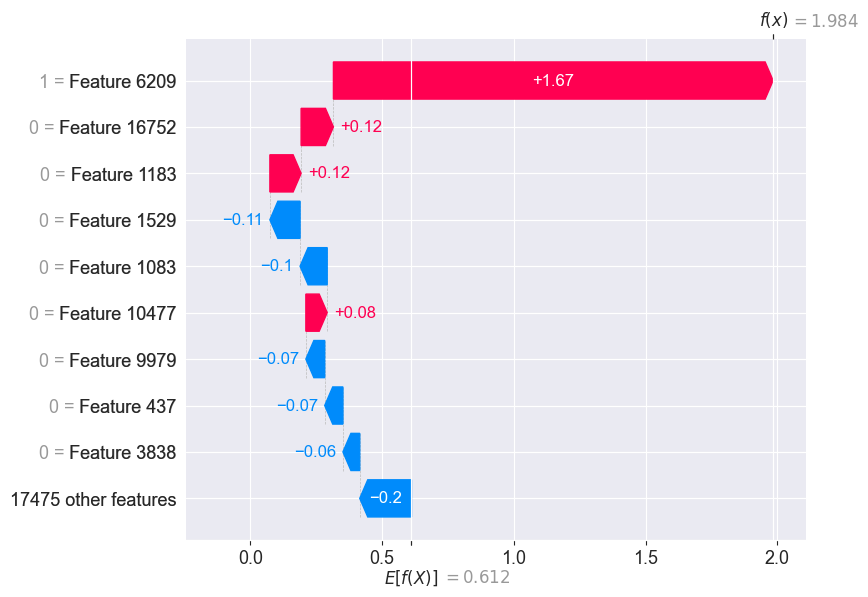

In [241]:
import shap

# Assuming xgb is a trained XGBoost model

explainer = shap.TreeExplainer(xgb)

# Get SHAP Explanation object by calling explainer on X_test
shap_values = explainer(X_test)

# Plot waterfall for the first test instance's explanation
shap.plots.waterfall(shap_values[0])


To better understand this, let’s dive into our first SHAP plot. The waterfall plot visualizes the SHAP values for each feature of a specific observation—in this case, the first abalone in our dataset.

- **X-axis interpretation:**
  The base value, denoted as \( E[f(x)] = 0.584 \), represents the average model output over the dataset (the expected prediction if we knew nothing about this specific abalone).
  The ending value, \( f(x) = -0.382 \), is the actual model prediction for this particular abalone.
  The **SHAP values** are shown as the bridge between these two values.

- **SHAP values:**
  Each feature’s SHAP value quantifies how much it pushes the prediction from the base value toward the final output. Positive values increase the prediction, while negative values decrease it.

- **Individual interpretation:**
  The waterfall plot for each observation (abalone) uniquely shows how each feature contributed to the model’s prediction relative to the mean prediction.
  Features with large positive or negative SHAP values had the most significant impact on shifting the model’s decision.

This visualization therefore provides an intuitive and detailed explanation of how the model arrived at its prediction for an individual instance by attributing contributions to each feature.


# Conclusion

Clustering and sentiment analysis were performed on a dataset of customer reviews for the food delivery service Zomato. The purpose of this analysis was to understand the customer's experience and gain insights from their feedback.

- **Clustering:**
  Customers were grouped based on their review text into two clusters:
  - **Positive cluster:** Indicating high levels of customer satisfaction.
  - **Negative cluster:** Indicating low levels of customer satisfaction.
  This provided a general overview of satisfaction trends among customers.

- **Sentiment Analysis:**
  Reviews were classified as positive or negative, offering a more detailed understanding of customer sentiment. This helped to pinpoint specific service areas needing improvement.

Overall, the combination of clustering and sentiment analysis provided valuable insights into customer experience with Zomato, supporting data-driven business decisions and service enhancements.

---

## Other Important Discoveries

- **Maximum Engagement and Retention:**
  Absolute Barbecues (AB's) showed the highest engagement with the maximum average number of ratings.
  Hotel Zara Hi-Fi exhibited the lowest engagement and average rating.

- **Price Points:**
  - High-rated restaurant AB’s has an average price point of ₹1500.
  - Low-rated restaurant Hotel Zara Hi-Fi averages ₹400.

- **Popular Cuisines:**
  North Indian cuisine is the most in-demand, followed by Chinese, as sold by most restaurants.

- **Frequently Used Tags:**
  "Great Buffets" is the most common tag. Others like "great," "best," "north," and "Hyderabad" also appear frequently.

- **Popular Critic:**
  Satwinder Singh is the most influential critic with the highest follower count, averaging a rating of 3.5.

- **Restaurant Pricing and Ratings:**
  - Hyatt Hyderabad Gachibowli is the most expensive restaurant with an average order price of ₹2800 and a 3.5 rating.
  - Amul and Mohammedia Shawarma are among the least expensive with average prices around ₹150 and a 3.9 rating.

---

## Recommendations Based on Analysis

- **Improve Delivery and Food Quality:**
  Address issues highlighted in negative reviews, especially concerning delivery timing and food quality, to improve satisfaction.

- **Leverage Clustering for Recommendations:**
  Use customer clusters to tailor personalized recommendations, improving user engagement.

- **Target Marketing Efforts:**
  Utilize clustering results to identify customer segments for focused marketing and promotional campaigns.

---

This analysis provides a comprehensive framework to understand and enhance customer experience through data-driven insights.
